<br />
<br />
<br />

## WVF Coincidence Explore:

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

import os

# ------------------------------------------------------------
# 1️⃣ Define data groups
# ------------------------------------------------------------
data_groups = [
    {
        "data_dir": "./statResult_pds_bkg",
        "dates": [
            "20250627", "20250614"
        ]
    }
]

coinNum = []
coinTrueE = []
coinPDG = []
coinMS = []
coinMH = []

# ------------------------------------------------------------
# 2️⃣ Read all groups — waveform coincidence counts
# ------------------------------------------------------------
print("\n=== Reading waveform coincidence counts ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_count_{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                line = line.strip()
                if not line:
                    continue

                parts = line.split(":")
                if len(parts) >= 2:
                    try:
                        coinNum.append(int(parts[1].strip()))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not parse '{parts[1].strip()}' in {fname}")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 3️⃣ Read all groups — candidate energies
# ------------------------------------------------------------
print("\n=== Reading candidate energies ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_trueE{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinTrueE.append(float(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to float.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 4️⃣ Read all groups — PDG codes
# ------------------------------------------------------------
print("\n=== Reading PDG codes ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_truePDG{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinPDG.append(int(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to int.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")




# ------------------------------------------------------------
# 5  Read all groups — candidate MS
# ------------------------------------------------------------
print("\n=== Reading candidate MS ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_trueMS{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinMS.append(float(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to float.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")


# ------------------------------------------------------------
# 6  Read all groups — PDG codes
# ------------------------------------------------------------
print("\n=== Reading  MH ===")

for group in data_groups:
    data_dir = group["data_dir"]

    print(f"\n[GROUP] {data_dir}")

    for d in group["dates"]:
        fname = f"{data_dir}/print_trueMH{d}.txt"
        if not os.path.exists(fname):
            print(f"[WARN] Missing {fname}")
            continue

        count = 0
        with open(fname, "r") as file:
            for line in file:
                value = line.strip()
                if value:
                    try:
                        coinMH.append(int(value))
                        count += 1
                    except ValueError:
                        print(f"[WARN] Could not convert '{value}' in {fname} to int.")

        print(f"  - Loaded {count:5d} entries from {d} → {os.path.basename(fname)}")




# ------------------------------------------------------------
# ✅ Summary
# ------------------------------------------------------------


print("Event candidates (TPC cut)  : xxx")
print("Track candidates with NO wvf: xxx")
print("Number of track candidates  :", len(coinNum))

#coinNum.extend([0] * 5642)


print("\nLength of track coinTrueE: ", len(coinTrueE))
print("Length of track coinPDG  : ", len(coinPDG))
print("Length of track coinMS   : ", len(coinMS))
print("Length of track coinMH   : ", len(coinMH))



# ========================================================================
# Apply cut: Make sure MS > 0.3 & MH > 3
coinNum_msh3 = []
coinTrueE_msh3 = []
coinPDG_msh3 = []
coinMS_msh3 =[]

for i in range(0, len(coinNum)):
    num = coinNum[i]
    e = coinTrueE[i]
    pdg = coinPDG[i]
    ms = coinMS[i]
    mh = coinMH[i]

    if ms >= 0.0 and mh < 3:
        coinNum_msh3.append(num)
        coinTrueE_msh3.append(e)
        coinPDG_msh3.append(pdg)

print("\n\nAfter requesting MS > 0.0 & MH < 3: ")
#print("\n\nAfter requesting MS > 0.2 & MH >2: ")
print("Number of track candidates:", len(coinNum_msh3))
print("Length of track coinTrueE : ", len(coinTrueE_msh3))
print("Length of track coinPDG   : ", len(coinPDG_msh3))



=== Reading waveform coincidence counts ===

[GROUP] ./statResult_pds_bkg
  - Loaded 111330 entries from 20250627 → print_count_20250627.txt
  - Loaded 117158 entries from 20250614 → print_count_20250614.txt

=== Reading candidate energies ===

[GROUP] ./statResult_pds_bkg
  - Loaded 111330 entries from 20250627 → print_trueE20250627.txt
  - Loaded 117158 entries from 20250614 → print_trueE20250614.txt

=== Reading PDG codes ===

[GROUP] ./statResult_pds_bkg
  - Loaded 111330 entries from 20250627 → print_truePDG20250627.txt
  - Loaded 117158 entries from 20250614 → print_truePDG20250614.txt

=== Reading candidate MS ===

[GROUP] ./statResult_pds_bkg
  - Loaded 111330 entries from 20250627 → print_trueMS20250627.txt
  - Loaded 117158 entries from 20250614 → print_trueMS20250614.txt

=== Reading  MH ===

[GROUP] ./statResult_pds_bkg
  - Loaded 111330 entries from 20250627 → print_trueMH20250627.txt
  - Loaded 117158 entries from 20250614 → print_trueMH20250614.txt
Event candidates (TPC

Purity of coinNum:  7449 / 228488 (3.26%)
Michel e:  1301 / 7449 (17.47%)
Michel p:  6148 / 7449 (82.53%)

[20260625] A lot of empty events

Candidates with #opWvf>=3:  210770 / 228488 (92.25%)
Purity:  5488 / 210770 (2.60%)

Values here are based on MS>0.3 & MH>3...
max(coinNum) = 9
Number of coinNum == 10: 0
Unique counts: [1, 2, 3, 4, 5, 6, 7, 8, 9]


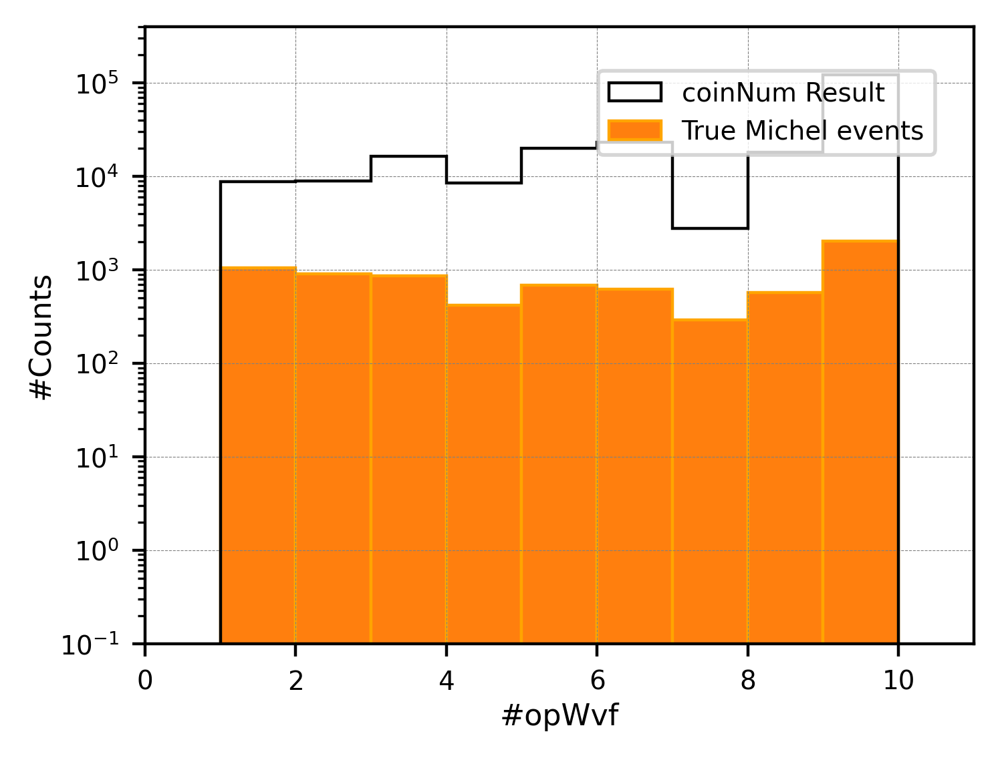

<Figure size 1600x1200 with 0 Axes>

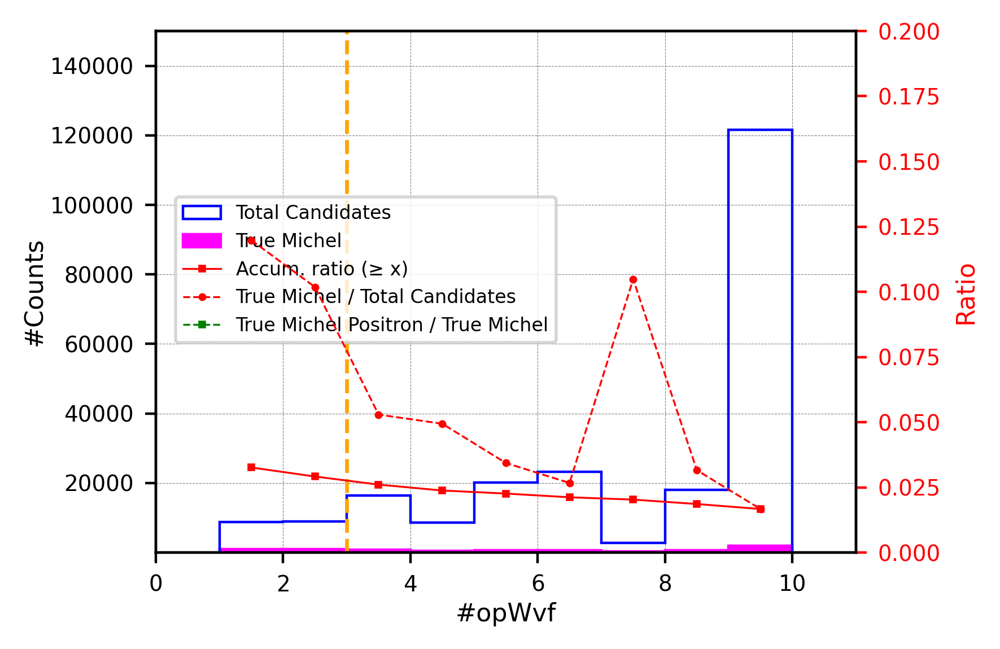

In [7]:

#Extract coinNum with trueE:===========================
coinNum_trueE = []
coinNum_trueE_e = [] #Michel electron
coinNum_trueE_p = [] #Michel positron
for i in range(0, len(coinTrueE_msh3)):
    count = coinNum_msh3[i]
    e = coinTrueE_msh3[i]
    pdg = coinPDG_msh3[i]

    if e > 0:
        coinNum_trueE.append(count)
        if pdg == 11:
            coinNum_trueE_e.append(count)
        if pdg == -11:
            coinNum_trueE_p.append(count)

print("Purity of coinNum: ", len(coinNum_trueE), "/", len(coinNum_msh3), "({:.2f}%)".format(len(coinNum_trueE)/len(coinNum_msh3)*100))
print("Michel e: ", len(coinNum_trueE_e), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_e)/len(coinNum_trueE)*100))
print("Michel p: ", len(coinNum_trueE_p), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_p)/len(coinNum_trueE)*100))



#Apply preliminary cut #opWvf >=3:=====================
coinNum_cut5 = []
coinNum_trueE_cut5 = []
for i in range(0, len(coinNum_msh3)):
    coin = coinNum_msh3[i]
    trueE = coinTrueE_msh3[i]

    if coin >=3:
        coinNum_cut5.append(coin)
    
        if trueE > 0:
            coinNum_trueE_cut5.append(trueE)

print("\n[20260625] A lot of empty events")
print("\nCandidates with #opWvf>=3: ", len(coinNum_cut5), "/", len(coinNum_msh3), "({:.2f}%)".format(len(coinNum_cut5)/len(coinNum_msh3)*100))
print("Purity: ", len(coinNum_trueE_cut5), "/", len(coinNum_cut5), "({:.2f}%)".format(len(coinNum_trueE_cut5)/len(coinNum_cut5)*100))

print("\nValues here are based on MS>0.3 & MH>3...")



print("max(coinNum) =", max(coinNum_msh3))
print("Number of coinNum == 10:", sum(1 for x in coinNum_msh3 if x == 10))
print("Unique counts:", sorted(set(coinNum_msh3)))



# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 1
range_min = 0
range_max = 11
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.plot([5, 5], [0, 1200], color="black", linewidth=1.5, linestyle='--')

plt.hist(coinNum_msh3, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label='coinNum Result')
plt.hist(coinNum_trueE, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='bar', linewidth=0.8, label="True Michel events")



plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.xlim(0, 11)
#plt.ylim(0, 50)
plt.xlabel('#opWvf', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 400000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show() 








#Michel score distribution (Original)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 1
range_min = 1
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(coinNum_msh3, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(coinNum_trueE, bins=bins, range=(range_min, range_max))
hist_trueP, _ = np.histogram(coinNum_trueE_p, bins=bins, range=(range_min, range_max))#True positron

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', color='magenta', histtype='bar', 
         linewidth=0.8, label="True Michel")
#ax1.hist(bin_centers, bins=bins, weights=hist_trueP, edgecolor='green', color='green', histtype='bar', 
#         linewidth=0.8, label="True Michel Positron")


ax1.plot([3, 3], [0, 10000000], color="orange", linewidth=1.2, linestyle='--')


ax1.set_xlim(0, 11)
ax1.set_xlabel('#opWvf', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
ax1.set_ylim(0.1, 150000)
#ax1.set_yscale('log')
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero

ratio2 = np.divide(hist_trueP, hist_true, out=np.zeros_like(hist_trueP, dtype=float), where=hist_total!=0)  # Avoid division by zero

# --- Accumulated (>= x) ratio ---
# Cumulative sums from the right (>= x)
cum_total = np.cumsum(hist_total[::-1])[::-1]
cum_true  = np.cumsum(hist_true[::-1])[::-1]
acc_ratio = np.divide(cum_true, cum_total,
                      out=np.zeros_like(cum_true, dtype=float),
                      where=cum_total != 0)

# Add the accumulated ratio curve on the secondary y-axis
ax2.plot(bin_centers, acc_ratio, color='red', marker='s', markersize=1.5,
         linestyle='-', linewidth=0.6, label='Accum. ratio (≥ x)')


ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel / Total Candidates")

ax2.plot(bin_centers, ratio2, color='green', marker='s', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel Positron / True Michel")



ax2.set_ylabel('Ratio', fontsize=8, color='red')
#ax2.set_ylim(0.0, 1.0)
ax2.set_ylim(0.0, 0.2)

ax2.tick_params(axis='y', labelsize=7, colors='red')



# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center', bbox_to_anchor=(0.3, 0.7),
           fontsize=9, ncol=1, prop={'size': 6})



plt.show()



<br />
<br />
<br />
<br />
<br />
<br />

## Process WVF:
### After TPC cuts & (#opWvf >= 3) (This can be taken as "PDS Cut 1")

In [8]:
from dataclasses import dataclass
from typing import Optional
import matplotlib.pyplot as plt
import numpy as np
import re
from mpl_toolkits.mplot3d import Axes3D



# ------------------- Dataclass -------------------
@dataclass
class PdsEvent:
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    third_time: Optional[int] = None             # NEW
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None      # NEW
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None
    # muon
    mu_leftTurn: Optional[int] = None
    mu_rightTurn: Optional[int] = None
    mu_leftHeight: Optional[float] = None
    mu_rightHeight: Optional[float] = None
    # michel
    mi_leftTurn: Optional[int] = None
    mi_rightTurn: Optional[int] = None
    mi_leftHeight: Optional[float] = None
    mi_rightHeight: Optional[float] = None
    # third peak
    th_leftTurn: Optional[int] = None            # NEW
    th_rightTurn: Optional[int] = None           # NEW
    th_leftHeight: Optional[float] = None        # NEW
    th_rightHeight: Optional[float] = None       # NEW
    # Michel-level attributes
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None            # ✅ NEW



# ------------------- Helpers -------------------
def parse_event_track(path_str: str):
    """Extract eventID and trackID from a file path string."""
    m = re.search(r"event(\d+)_trackID(\d+)", path_str)
    if m:
        return int(m.group(1)), int(m.group(2))
    return None, None



def read_total_files(files, dates, kind="muon"):
    """
    Read *_total_xxx.txt files.
    Each line: path: t, I, leftTurn, leftHeight, rightTurn, rightHeight
    """
    records = []
    for fname, date in zip(files, dates):
        try:
            with open(fname, "r") as f:
                for line in f:
                    line = line.strip()
                    if not line:
                        continue
                    parts = line.split(":")
                    if len(parts) < 2:
                        continue

                    path_part = parts[0].strip()
                    values = [v.strip() for v in parts[1].split(",")]
                    if len(values) < 6:
                        print(f"[WARN] Malformed line in {fname}: {line}")
                        continue

                    try:
                        time_val = int(values[0])
                        inten_val = float(values[1])
                        left_turn = int(values[2])
                        left_h = float(values[3])
                        right_turn = int(values[4])
                        right_h = float(values[5])
                    except ValueError:
                        print(f"[WARN] Could not parse numbers in {line}")
                        continue

                    evID, trID = parse_event_track(path_part)
                    rec = {"eventID": evID, "trackID": trID, "date": int(date)}

                    if kind == "muon":
                        rec.update({
                            "muon_time": time_val,
                            "muon_intensity": inten_val,
                            "mu_leftTurn": left_turn,
                            "mu_leftHeight": left_h,
                            "mu_rightTurn": right_turn,
                            "mu_rightHeight": right_h
                        })
                    elif kind == "michel":
                        rec.update({
                            "michel_time": time_val,
                            "michel_intensity": inten_val,
                            "mi_leftTurn": left_turn,
                            "mi_leftHeight": left_h,
                            "mi_rightTurn": right_turn,
                            "mi_rightHeight": right_h
                        })
                    elif kind == "third":
                        rec.update({
                            "third_time": time_val,
                            "third_intensity": inten_val,
                            "th_leftTurn": left_turn,
                            "th_leftHeight": left_h,
                            "th_rightTurn": right_turn,
                            "th_rightHeight": right_h
                        })

                    records.append(rec)
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return records




def read_plain_files(files, cast_type=float):
    """Read one or more plain text files with one number per line and return concatenated values."""
    values = []
    for fname in files:
        try:
            with open(fname, "r") as file:
                for line in file:
                    value = line.strip()
                    if value:
                        try:
                            values.append(cast_type(value))
                        except ValueError:
                            print(f"Could not convert {value} in {fname}")
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return values



# ------------------- Load data -------------------
# ------------------- Load data (TWO GROUPS) -------------------

data_groups = [
    {
        "data_dir": "./statResult_pds_bkg",
        "dates": [
            "20250627", "20250614"
        ]
    }
]

muon_records   = []
michel_records = []
third_records  = []

posX, posY, posZ = [], [], []
energy, lifetime = [], []
pdg = []
miScore, miHits = [], []

print("\n================= Reading multi-group files =================\n")

for group in data_groups:
    dir0  = group["data_dir"]
    dates = group["dates"]

    print(f"\n[GROUP] Reading from: {dir0}\n")

    # ------------------- A. TOTAL FILES -------------------
    muon_files   = [f"{dir0}/muon_total_{d}.txt"   for d in dates]
    michel_files = [f"{dir0}/michel_total_{d}.txt" for d in dates]
    third_files  = [f"{dir0}/third_total_{d}.txt"  for d in dates]

    print("→ Reading MUON TOTAL files...")
    recs = read_total_files(muon_files, dates, kind="muon")
    print(f"  Loaded {len(recs)} muon records\n")
    muon_records.extend(recs)

    print("→ Reading MICHEL TOTAL files...")
    recs = read_total_files(michel_files, dates, kind="michel")
    print(f"  Loaded {len(recs)} michel records\n")
    michel_records.extend(recs)

    print("→ Reading THIRD TOTAL files...")
    recs = read_total_files(third_files, dates, kind="third")
    print(f"  Loaded {len(recs)} third records\n")
    third_records.extend(recs)


    # ------------------- B. PLAIN FILES -------------------
    print("→ Reading plain-text extracted files...\n")

    posX.extend(     read_plain_files([f"{dir0}/posX_extract_{d}.txt" for d in dates]) )
    posY.extend(     read_plain_files([f"{dir0}/posY_extract_{d}.txt" for d in dates]) )
    posZ.extend(     read_plain_files([f"{dir0}/posZ_extract_{d}.txt" for d in dates]) )
    energy.extend(   read_plain_files([f"{dir0}/energy_extract_{d}.txt" for d in dates]) )
    lifetime.extend( read_plain_files([f"{dir0}/lifetime_extract_{d}.txt" for d in dates]) )
    pdg.extend(      read_plain_files([f"{dir0}/pdg_extract_{d}.txt" for d in dates], cast_type=int) )
    miScore.extend(  read_plain_files([f"{dir0}/michelScore_extract_{d}.txt" for d in dates]) )
    miHits.extend(   read_plain_files([f"{dir0}/michelHits_extract_{d}.txt"  for d in dates], cast_type=int) )


print("\n================= SUMMARY OF COUNTS =================")
print("Muon total records   :", len(muon_records))
print("Michel total records :", len(michel_records))
print("Third total records  :", len(third_records))
print("posX length          :", len(posX))
print("posY length          :", len(posY))
print("posZ length          :", len(posZ))
print("energy length        :", len(energy))
print("lifetime length      :", len(lifetime))
print("pdg length           :", len(pdg))
print("michelScore length   :", len(miScore))
print("michelHits length    :", len(miHits))
print("=====================================================\n")



# ------------------- Build dataset -------------------
events_veryInitial = []
n_events = min(
    len(muon_records), len(michel_records), len(third_records),
    len(posX), len(posY), len(posZ),
    len(energy), len(lifetime), len(pdg),
    len(miScore), len(miHits)
)

for i in range(n_events):
    rec_mu = muon_records[i]
    rec_mi = michel_records[i]
    rec_th = third_records[i]

    ev = PdsEvent(
        eventID=rec_mu.get("eventID", rec_mi.get("eventID", rec_th.get("eventID"))),
        trackID=rec_mu.get("trackID", rec_mi.get("trackID", rec_th.get("trackID"))),
        date=rec_mu.get("date", rec_mi.get("date", rec_th.get("date"))),

        # muon
        muon_time=rec_mu.get("muon_time"),
        muon_intensity=rec_mu.get("muon_intensity"),
        mu_leftTurn=rec_mu.get("mu_leftTurn"),
        mu_leftHeight=rec_mu.get("mu_leftHeight"),
        mu_rightTurn=rec_mu.get("mu_rightTurn"),
        mu_rightHeight=rec_mu.get("mu_rightHeight"),

        # michel
        michel_time=rec_mi.get("michel_time"),
        michel_intensity=rec_mi.get("michel_intensity"),
        mi_leftTurn=rec_mi.get("mi_leftTurn"),
        mi_leftHeight=rec_mi.get("mi_leftHeight"),
        mi_rightTurn=rec_mi.get("mi_rightTurn"),
        mi_rightHeight=rec_mi.get("mi_rightHeight"),
        michel_score=miScore[i],
        michel_hits=miHits[i],

        # third
        third_time=rec_th.get("third_time"),
        third_intensity=rec_th.get("third_intensity"),
        th_leftTurn=rec_th.get("th_leftTurn"),
        th_leftHeight=rec_th.get("th_leftHeight"),
        th_rightTurn=rec_th.get("th_rightTurn"),
        th_rightHeight=rec_th.get("th_rightHeight"),

        # physical properties
        posX=posX[i], posY=posY[i], posZ=posZ[i],
        energy=energy[i], lifetime=lifetime[i], pdg=pdg[i]
    )
    events_veryInitial.append(ev)

print("Very initial dataset:", len(events_veryInitial))

example = events_veryInitial[0]
print("\nExample Event (index 0):")
for field, value in vars(example).items():
    print(f"  {field:20s}: {value}")









#Apply cuts on peak intensities-----------------------------
events_reco_initial = []
events_true_initial = []

for ev in events_veryInitial:
    muIntensity = ev.muon_intensity
    miIntensity = ev.michel_intensity
    e = ev.energy

    ms = ev.michel_score
    mh = ev.michel_hits

    #mu & mi are cuts in following block already!
    #Here is additional CUT!!!
    if muIntensity > -0.1  and miIntensity > -0.1 and ms <0.01 and mh < 3:
        events_reco_initial.append(ev)

        if e > 0:
            events_true_initial.append(ev)

print("\nDataset after initial intensity-cut (ms>=0.0 and mh<3)----------------------")
print("Michel initial dataset   : ", len(events_reco_initial))
print("Michel purity (true/reco): ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100)) 


print("\n\nThe difference with the result of opNum>=3 is that " \
"beam events are removed in official production")






================= Reading multi-group files =================


[GROUP] Reading from: ./statResult_pds_bkg

→ Reading MUON TOTAL files...
  Loaded 206907 muon records

→ Reading MICHEL TOTAL files...
  Loaded 206907 michel records

→ Reading THIRD TOTAL files...
  Loaded 206907 third records

→ Reading plain-text extracted files...


================= SUMMARY OF COUNTS =================
Muon total records   : 206907
Michel total records : 206907
Third total records  : 206907
posX length          : 206907
posY length          : 206907
posZ length          : 206907
energy length        : 206907
lifetime length      : 206907
pdg length           : 206907
michelScore length   : 206907
michelHits length    : 206907

Very initial dataset: 206907

Example Event (index 0):
  muon_time           : 187
  michel_time         : 125
  third_time          : 402
  muon_intensity      : 8.53185
  michel_intensity    : 2.15363
  third_intensity     : 0.330201
  posX                : -113.266
  posY   

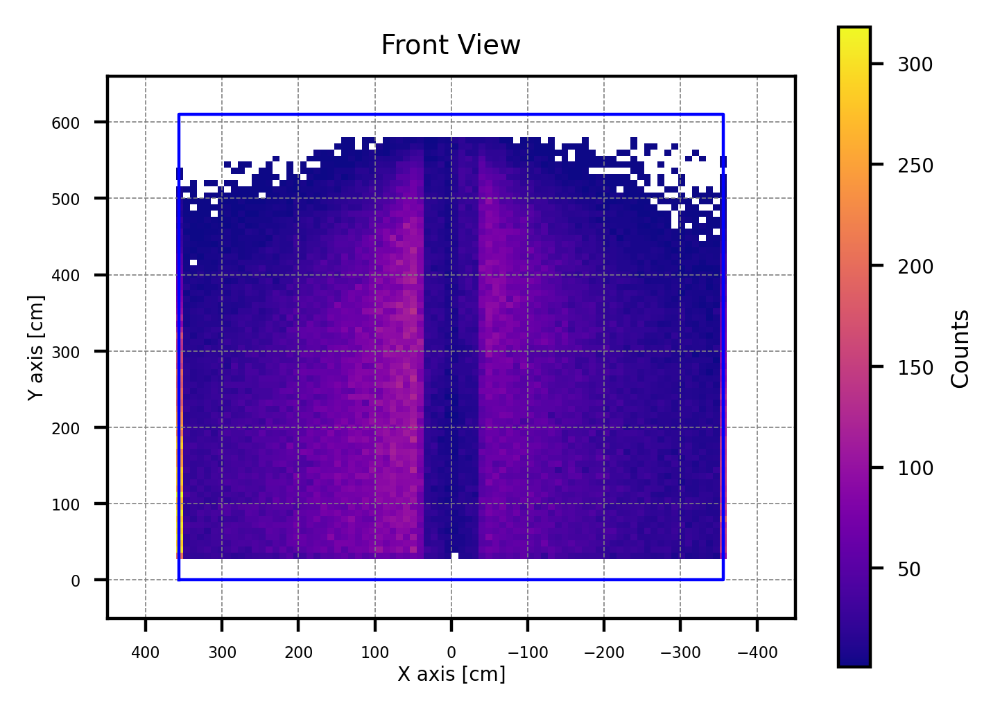

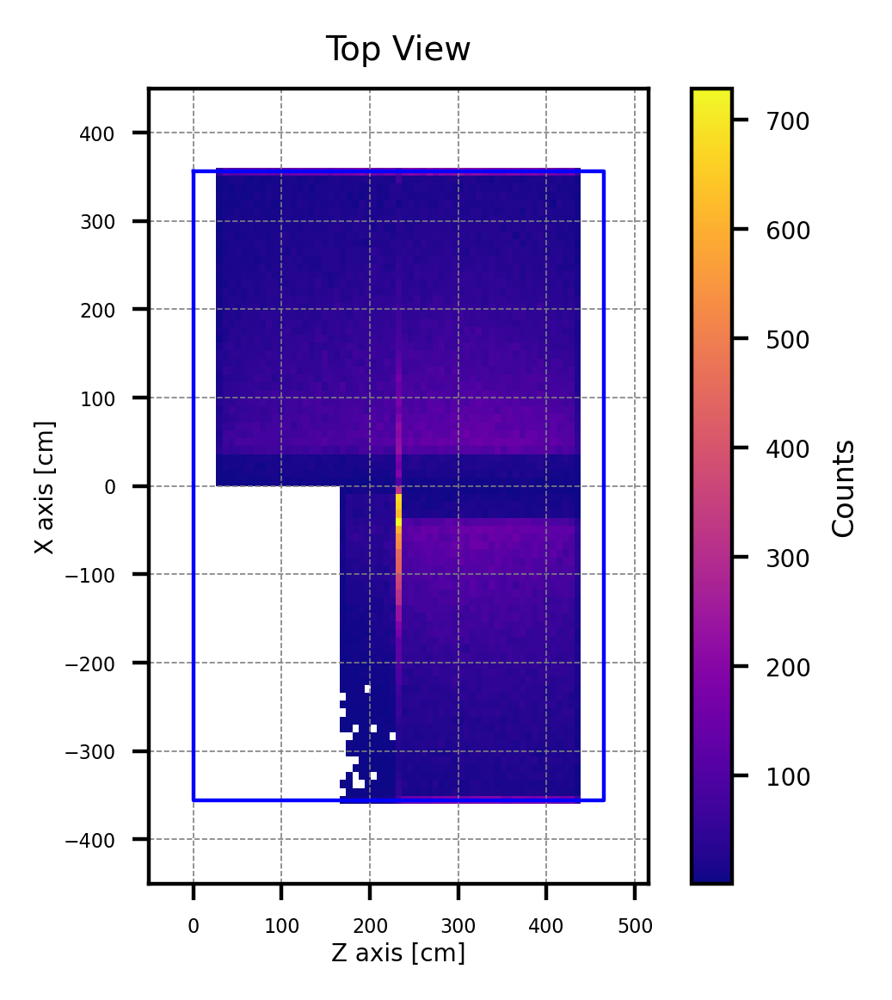


Decay points distribution (TPC & #opWvf cuts): 
# of X < 0 :  78765 (40.62%)
# of X >= 0:  115153 (59.38%)

Michel purity:  4971 /  193918 (2.56%)

Bin Center | Final / Initial Ratio
-------------------------------
   -355.0 | 0.002
   -345.0 | 0.008
   -335.0 | 0.005
   -325.0 | 0.014
   -315.0 | 0.014
   -305.0 | 0.021
   -295.0 | 0.012
   -285.0 | 0.017
   -275.0 | 0.015
   -265.0 | 0.020
   -255.0 | 0.016
   -245.0 | 0.015
   -235.0 | 0.022
   -225.0 | 0.017
   -215.0 | 0.019
   -205.0 | 0.019
   -195.0 | 0.025
   -185.0 | 0.023
   -175.0 | 0.022
   -165.0 | 0.025
   -155.0 | 0.024
   -145.0 | 0.026
   -135.0 | 0.029
   -125.0 | 0.027
   -115.0 | 0.029
   -105.0 | 0.030
    -95.0 | 0.032
    -85.0 | 0.042
    -75.0 | 0.040
    -65.0 | 0.037
    -55.0 | 0.035
    -45.0 | 0.031
    -35.0 | 0.060
    -25.0 | 0.081
    -15.0 | 0.041
     -5.0 | 0.036
      5.0 | 0.132
     15.0 | 0.124
     25.0 | 0.121
     35.0 | 0.084
     45.0 | 0.030
     55.0 | 0.027
     65.0 | 0.029
     75.0 

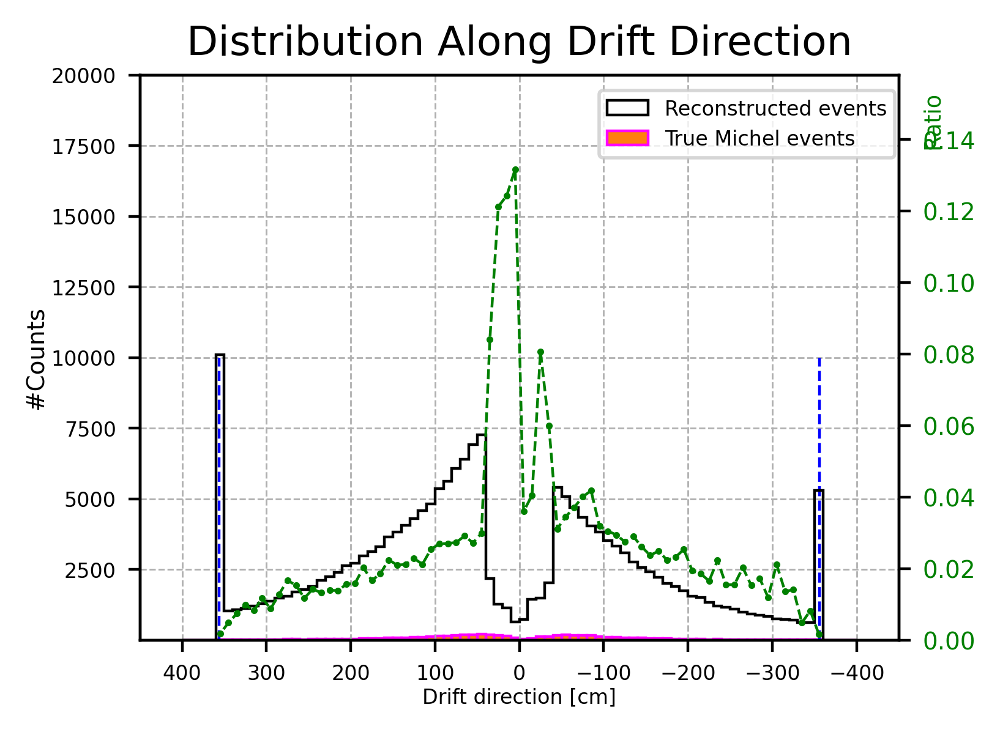

In [9]:
posX = [ev.posX for ev in events_reco_initial]
posY = [ev.posY for ev in events_reco_initial]
posZ = [ev.posZ for ev in events_reco_initial]

posX_true = [ev.posX for ev in events_true_initial]




#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posX, posY, bins=(100, 100), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 




#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posZ, posX, bins=(100, 100), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()








#Decay points distribution:==================================================================
print("\nDecay points distribution (TPC & #opWvf cuts): ")

posX = np.array(posX)
neg_X = np.sum(posX < 0)
pos_X = np.sum(posX >= 0)
print("# of X < 0 : ", neg_X, "({:.2f}%)".format(neg_X/len(posX)*100))
print("# of X >= 0: ", pos_X, "({:.2f}%)".format(pos_X/len(posX)*100))

print("\nMichel purity: ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100))         



# Plotting the histogram (X distribution)---------------
fig, ax1 = plt.subplots(figsize=(4, 3), dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = (bins[:-1] + bins[1:]) / 2

# --- Histogram counts ---
n_initial, _ = np.histogram(posX, bins=bins)
n_final, _ = np.histogram(posX_true, bins=bins)

# --- Ratio Calculation (only for [-360, 360]) ---
ratio = []
ratio_centers = []

print("\nBin Center | Final / Initial Ratio")
print("-------------------------------")
for center, ni, nf in zip(bin_centers, n_initial, n_final):
    if -360 <= center <= 360:
        r = nf / ni if ni > 0 else np.nan
        ratio.append(r)
        ratio_centers.append(center)
        if ni > 0:
            print(f"{center:9.1f} | {r:.3f}")
        else:
            print(f"{center:9.1f} |   NaN")


# Filter out NaN values for min/max calculation
valid_ratios = [r for r in ratio if not np.isnan(r)]

if valid_ratios:
    print("\nMaximum ratio: {:.3f}".format(np.max(valid_ratios)))
    print("Minimum ratio: {:.3f}".format(np.min(valid_ratios)))
else:
    print("\nNo valid ratios to compute min/max.")

#APA planes---
plt.plot([-356, -356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([356, 356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')

# Plot histograms
ax1.hist(bins[:-1], bins=bins, weights=n_initial, edgecolor='black',
         histtype='step', linewidth=0.8, label='Reconstructed events')
ax1.hist(bins[:-1], bins=bins, weights=n_final, edgecolor='magenta',
         histtype='bar', linewidth=0.8, label='True Michel events')

ax1.set_ylabel('Counts')
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.legend(loc='upper center', bbox_to_anchor=(0.8, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})
ax1.set_xlim(-450, 450)
ax1.set_ylim(0.1, 20000)
ax1.set_xlabel('Drift direction [cm]', labelpad=1, fontsize=6)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=7)
ax1.invert_xaxis()
#ax1.set_yscale('log')
ax1.tick_params(labelsize=6)

# Secondary y-axis for ratio
ax2 = ax1.twinx()

ax2.plot(ratio_centers, ratio, 'o--', color='green', markersize=1, linewidth=0.8, label='Final / Initial Ratio')

ax2.set_ylabel('Ratio', labelpad=1, fontsize=6.6, color='green', rotation=90)
ax2.yaxis.set_label_position("right")
ax2.yaxis.set_label_coords(1.03, 0.92)  # (x, y) in axis coordinates

ax2.tick_params(labelsize=7, axis='y', labelcolor='green')
ax2.set_ylim(0, np.nanmax(ratio) * 1.2)

# Final layout
#plt.tight_layout()

plt.title('Distribution Along Drift Direction', fontsize=12)

plt.show()



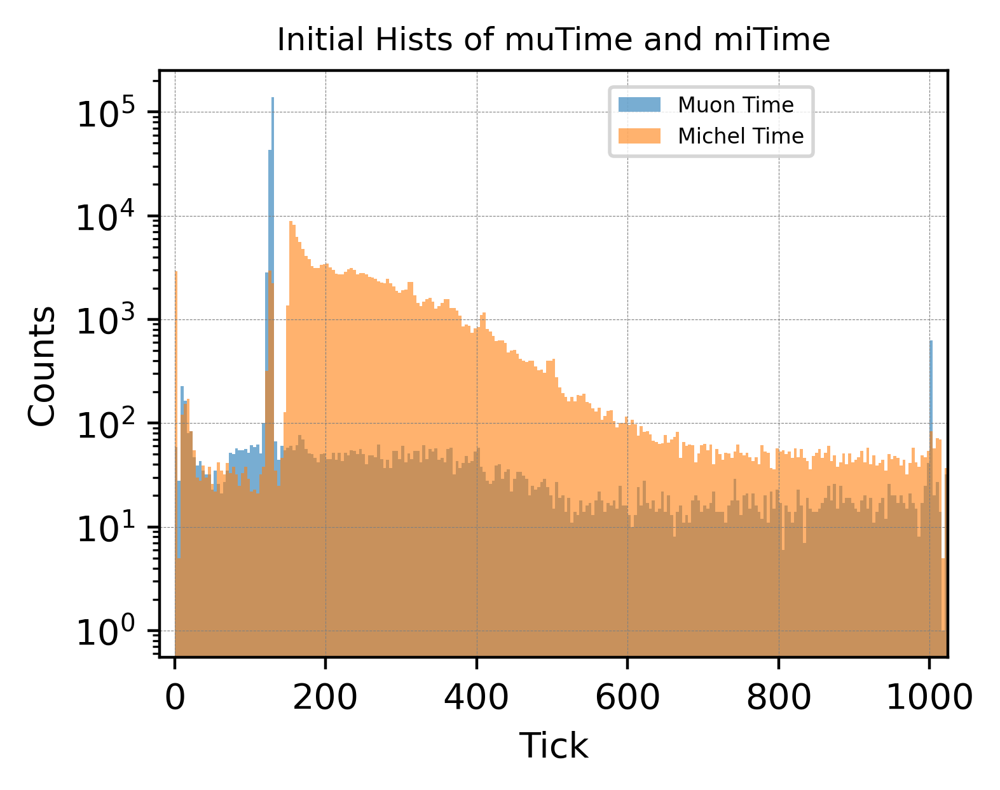

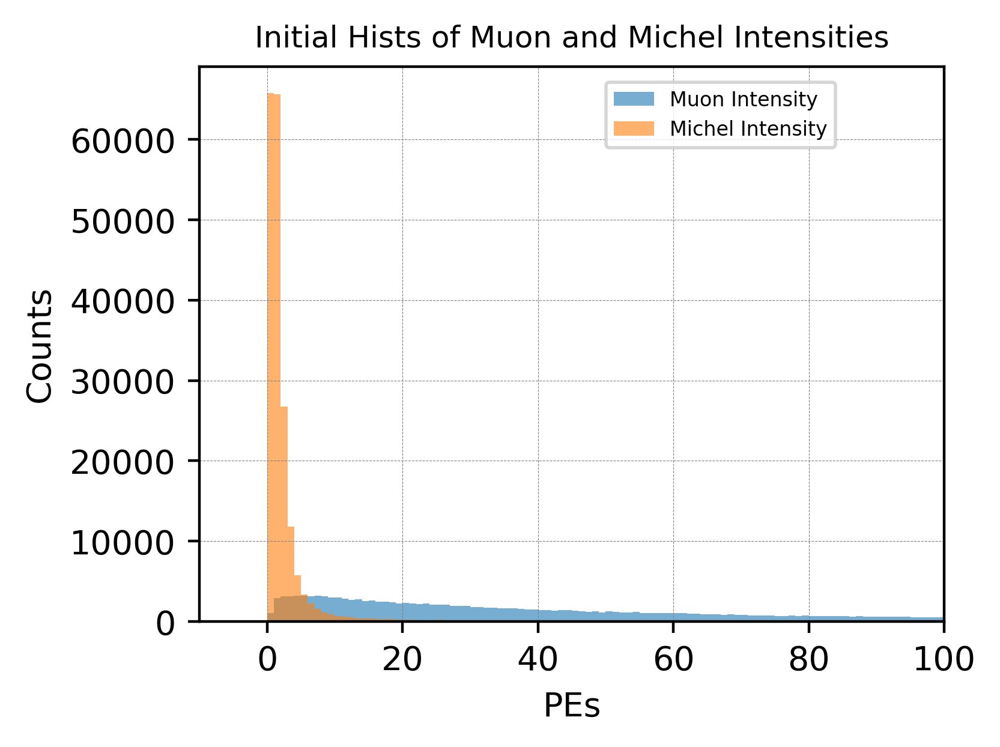

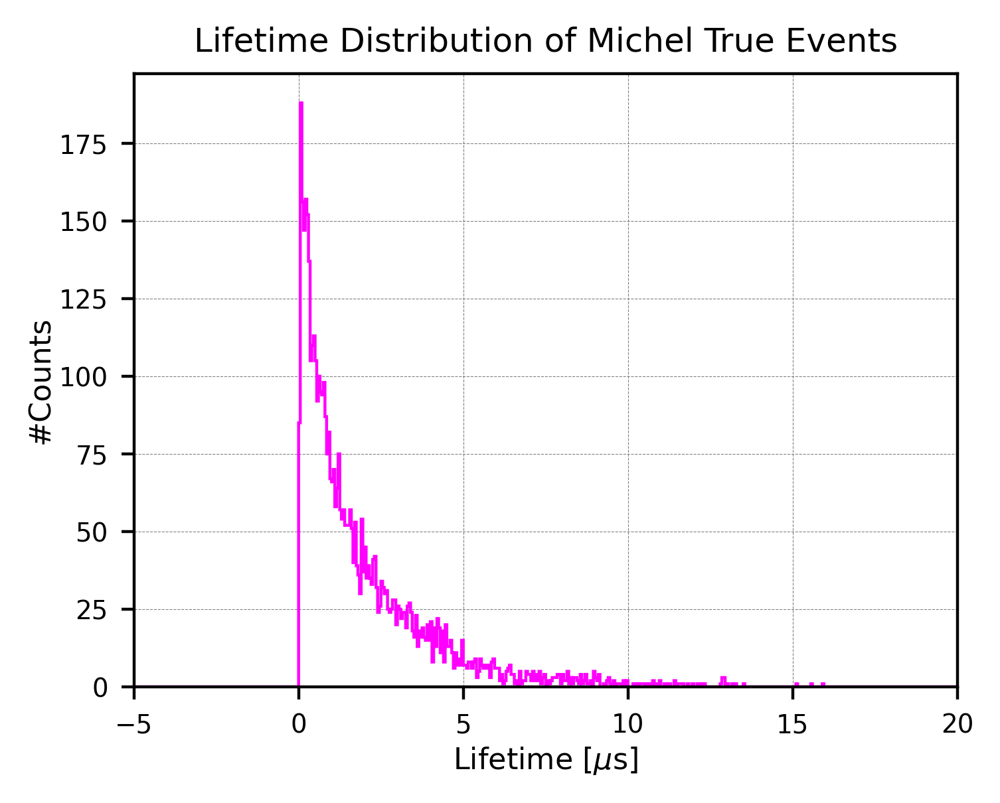

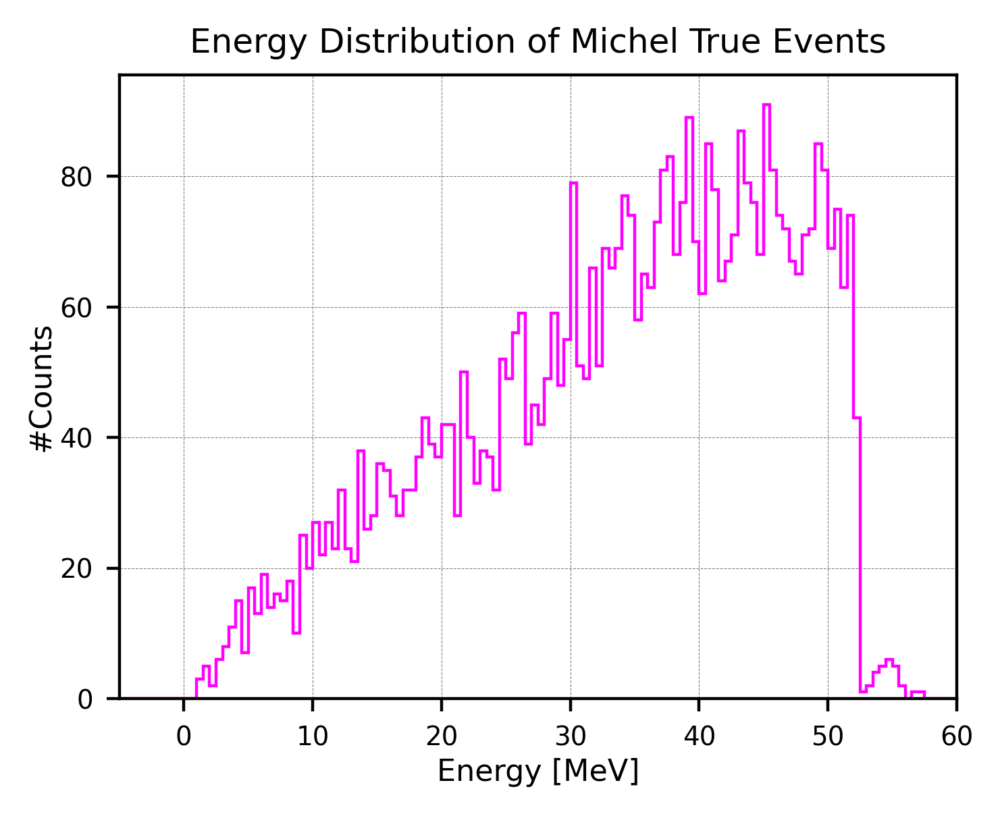

In [10]:
muon_time = [ev.muon_time for ev in events_reco_initial]
michel_time = [ev.michel_time for ev in events_reco_initial]

muon_intensity = [ev.muon_intensity for ev in events_reco_initial]
michel_intensity = [ev.michel_intensity for ev in events_reco_initial]

lifetime = [ev.lifetime for ev in events_true_initial] #true lifetime---
energy = [ev.energy for ev in events_true_initial] 


#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_time, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(michel_time, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()




#Initial Mu and Michel intensity distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 100
bin_width_initial = 1  # You can change this value
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_intensity, bins=bins, alpha=0.6, label='Muon Intensity')
plt.hist(michel_intensity, bins=bins, alpha=0.6, label='Michel Intensity')

plt.xlabel('PEs')
plt.ylabel('Counts')
#plt.yscale('log')
plt.xlim(-10, 100)
plt.title('Initial Hists of Muon and Michel Intensities', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()







#True Lifetime distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(lifetime, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 20)
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.show()  





#True Energy distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(energy, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Energy Distribution of Michel True Events', fontsize=9)
plt.show()  





<br />
<br />
<br />
<br />


### Purification / cut 2: remove abnormal muon signals (constrain muTime to [120, 130])

Muon events selection (mu peak constrained to [120, 130]):
Updated Muon events:  185169 /  193918 (95.49%)
Length of time_difference (Updated):  185169

Michel purity:  4720 /  185169 (2.55%)


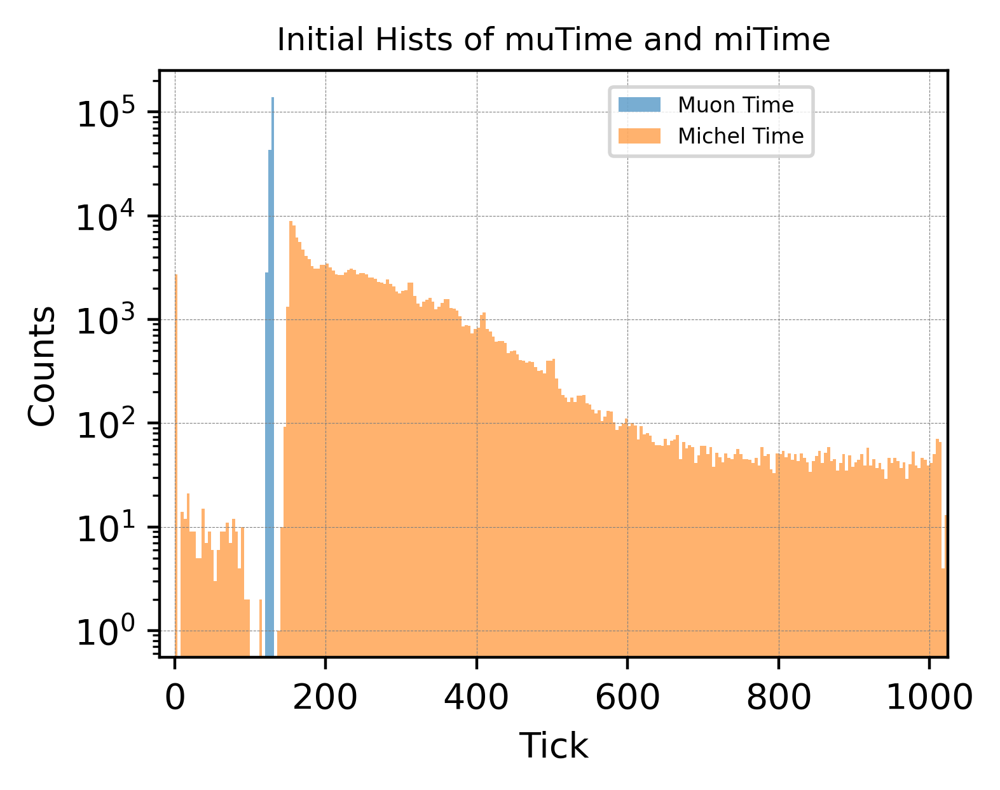




Lifetime distribution (Updated):
# Initial Candidates [-16000, 16000]:  185169


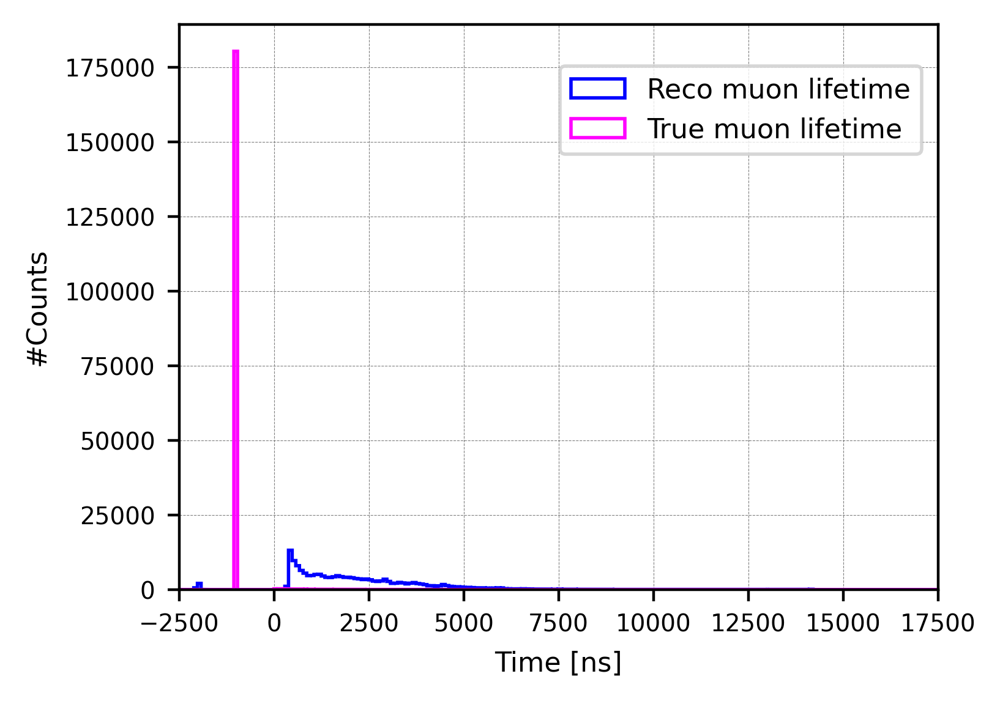

In [11]:
events_reco_update1 = []
events_true_update1 = []

lifetime_reco_update1 = []

for ev in events_reco_initial:
    muTime = ev.muon_time
    miTime = ev.michel_time
    energy = ev.energy

    if 120 <= muTime <= 130:
        events_reco_update1.append(ev)
        t = miTime-muTime
        lifetime_reco_update1.append(t)

        if energy > 0:
            events_true_update1.append(ev)


print("Muon events selection (mu peak constrained to [120, 130]):")
print("Updated Muon events: ", len(events_reco_update1), "/ ", len(events_reco_initial), 
       "({:.2f}%)".format(len(events_reco_update1)/len(events_reco_initial)*100))

# Element-wise subtraction: (mi - mu) for each corresponding element
print("Length of time_difference (Updated): ", len(lifetime_reco_update1))

print("\nMichel purity: ", len(events_true_update1), "/ ", len(events_reco_update1), 
      "({:.2f}%)".format(len(events_true_update1)/len(events_reco_update1)*100)) 









#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

muTime_update = [ev.muon_time for ev in events_reco_update1]
miTime_update = [ev.michel_time for ev in events_reco_update1]


# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(miTime_update, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()









# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Convert to ns (assuming mu_lifetime is already defined)
timdeDiff_update_ns = [value * 16 for value in lifetime_reco_update1]#reco lifetime---

lifetime_true_update1 = [ev.lifetime for ev in events_reco_update1]
lifetime_update_ns = [value * 1000 for value in lifetime_true_update1]#True lifetime---


print("\n\n\nLifetime distribution (Updated):")
print("# Initial Candidates [-16000, 16000]: ", len(timdeDiff_update_ns))

# Define histogram parameters
bin_width =96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(timdeDiff_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')

plt.hist(lifetime_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2500, 17500)
#plt.ylim(0, 10000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






<br />
<br />
<br />
<br />


### Purification / cut 3: remove events with unphysical lifetime

#### (20251022): lifetime cut should be >0 here (we know later that 500 is NOT a good standard)




Lifetime distribution (Updated)

After lifetime cut (cut 3):
# Updated Candidates [0, 16000]:  182241
Efficiency (cut3 / cut2):  182241 / 185169 (98.42%)

#Purity:  4418 / 182241 (2.42%)


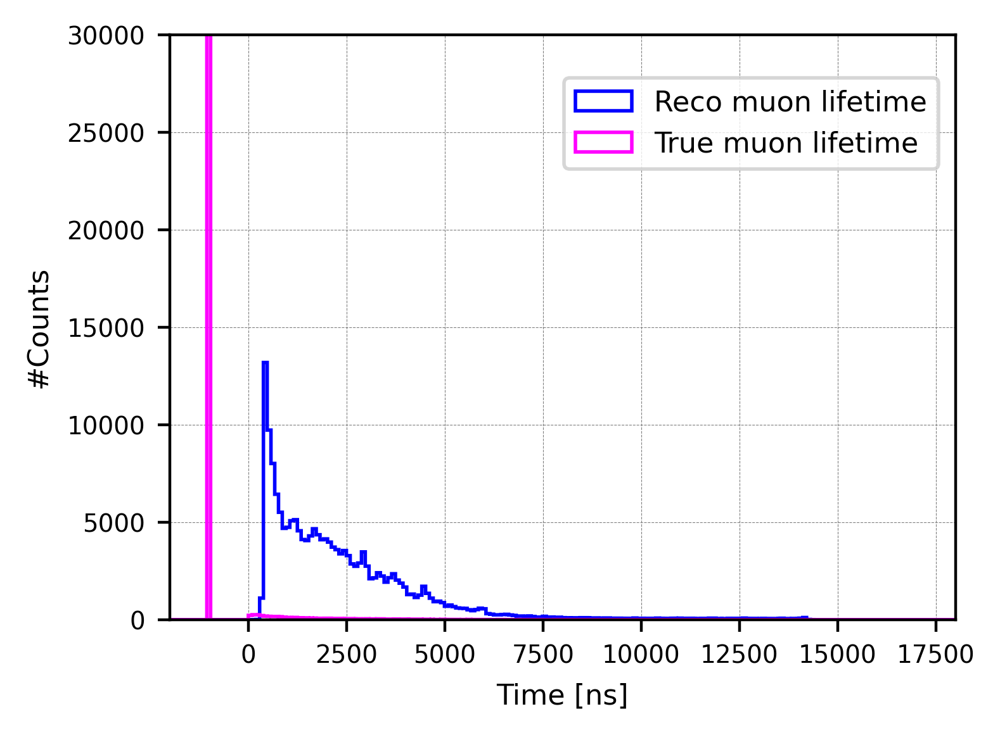

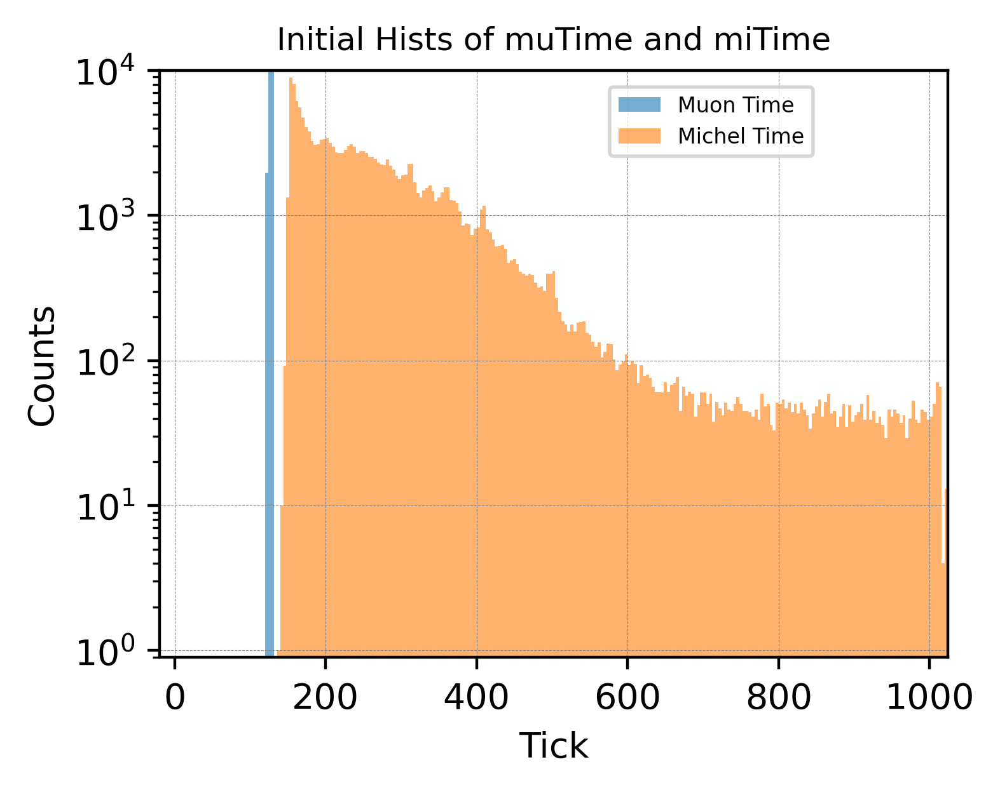


--------------------------------------
[-500, 500]:  2475 / 182241 (1.36%)


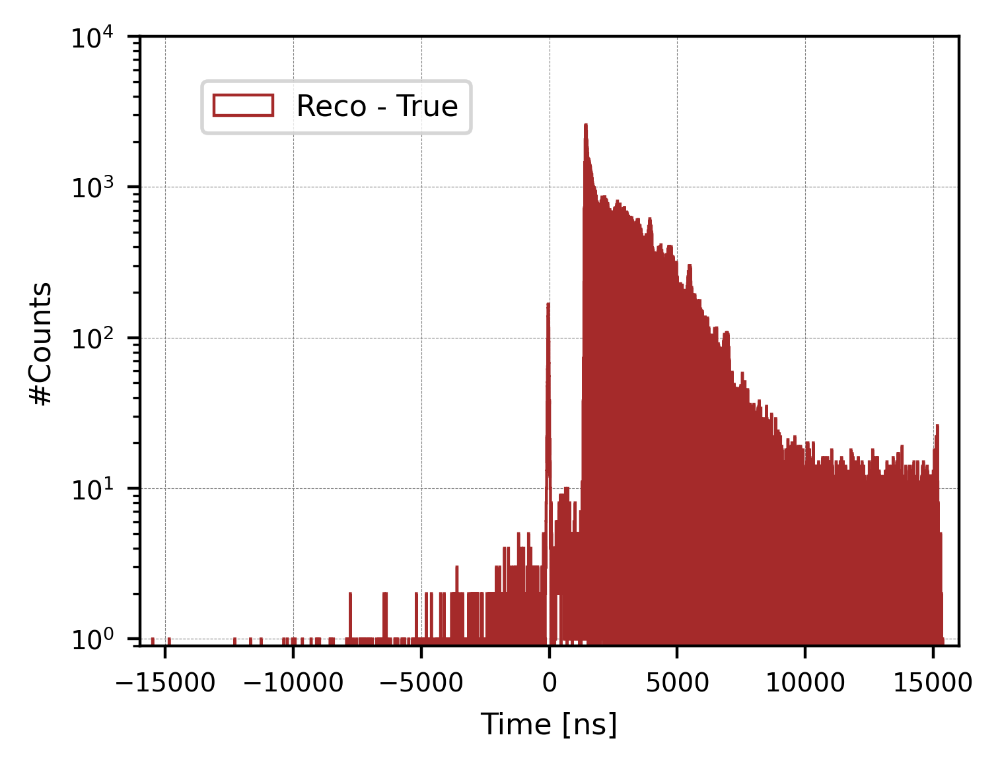



Explore the peak------


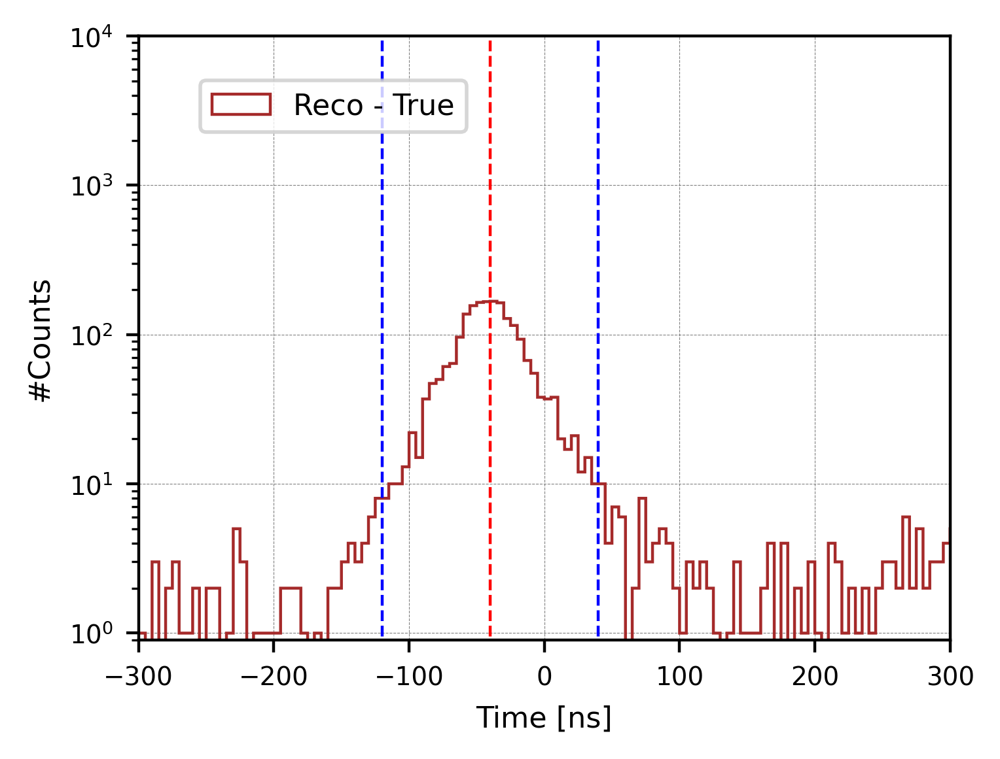

In [12]:
events_reco_update2 = []#Dataset after Purification 2---
events_true_update2 = []
lifetime_reco_update2 = []

for ev in events_reco_update1:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    e = ev.energy

    if 0 <= timeDiff: #keep physical events here---
        events_reco_update2.append(ev)
        lifetime_reco_update2.append(timeDiff)

        if e > 0:
            events_true_update2.append(ev)





print("\n\n\nLifetime distribution (Updated)")
print("\nAfter lifetime cut (cut 3):")
print("# Updated Candidates [0, 16000]: ", len(events_reco_update2))
print("Efficiency (cut3 / cut2): ", len(events_reco_update2), "/", len(events_reco_update1),
      "({:.2f}%)".format(len(events_reco_update2)/len(events_reco_update1)*100))
print("\n#Purity: ", len(events_true_update2), "/", len(events_reco_update2), 
     "({:.2f}%)".format(len(events_true_update2)/len(events_reco_update2)*100))





# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 96
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')


lifetime_update_ns2 = [ev.lifetime * 1000 for ev in events_reco_update2]#True lifetime (contain false)---
plt.hist(lifetime_update_ns2, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2000, 18000)
plt.ylim(0, 30000)
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






#--------------------------------------------------------------
#Mu time & Mi time distribution after reco>0:
muTime_update_ns2 = [ev.muon_time for ev in events_reco_update2]
miTime_update_ns2 = [ev.michel_time for ev in events_reco_update2]

plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update_ns2, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(miTime_update_ns2, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.ylim(0.9, 10000)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()












#---------------------------------------------------------------
#Reco True difference-------------------------------------------

diff_reco_true = []
for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    lifetime = ev.lifetime * 1000 #convert to ns---

    diff_reco_true.append(timeDiff-lifetime)


reco_true_count_500 = sum(-500 <= x <= 500 for x in diff_reco_true)
print("\n--------------------------------------")
print("[-500, 500]: ", reco_true_count_500, "/", len(diff_reco_true), 
     "({:.2f}%)".format(reco_true_count_500/len(diff_reco_true)*100))


#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -96000
range_max = 96000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')


plt.xlim(-16000, 16000)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()





#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

print("\n\nExplore the peak------")

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

# The peak
plt.plot([-40, -40], [0, 10000], color="red", linewidth=0.8, linestyle='--')
#+-5 ticks
plt.plot([-120, -120], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([40, 40], [0, 10000], color="blue", linewidth=0.8, linestyle='--')

plt.xlim(-300, 300)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Ex=')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()



#### Gaussian fitting of (Reco - True) peak:



Explore the peak------

First-pass fit:
    mu    = -41.25 ns
    sigma = 23.81 ns

Second-pass fit:
    mu    = -41.26 ns
    sigma = 23.69 ns
    fit window = [-112.7, 30.2] ns

Goodness-of-fit:
    chi2 = 86.8
    ndf  = 26
    chi2/ndf = 3.34

Comment from Shu: The Gaussian fitting result is not reliable...


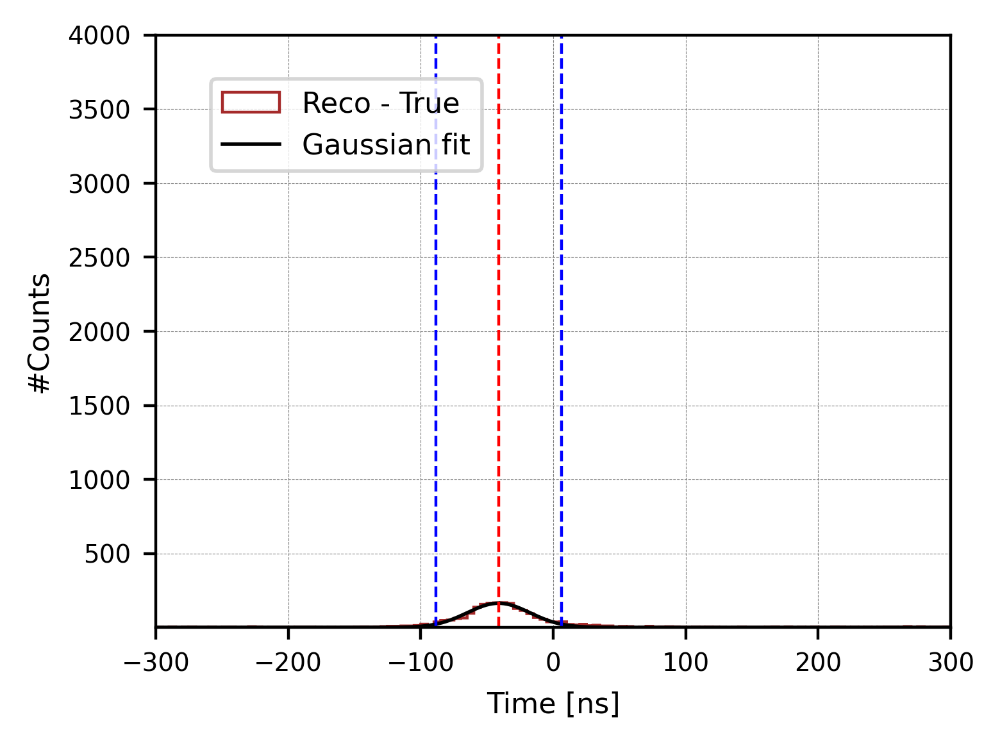

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

plt.figure(figsize=(4, 3), dpi=400)

print("\n\nExplore the peak------")

counts, edges = np.histogram(diff_reco_true, bins=bins, range=(range_min, range_max))
centers = 0.5 * (edges[:-1] + edges[1:])

def gaussian(x, A, mu, sigma):
    sigma = abs(sigma) + 1e-12
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

# -------------------------
# First-pass fit
# -------------------------
fit_mask1 = (centers > -150) & (centers < 100)

x_fit1 = centers[fit_mask1]
y_fit1 = counts[fit_mask1]

A0 = np.max(y_fit1)
mu0 = x_fit1[np.argmax(y_fit1)]
sigma0 = 30.0

popt1, pcov1 = curve_fit(gaussian, x_fit1, y_fit1, p0=[A0, mu0, sigma0])

A1, mu1, sigma1 = popt1
sigma1 = abs(sigma1)

print("\nFirst-pass fit:")
print(f"    mu    = {mu1:.2f} ns")
print(f"    sigma = {sigma1:.2f} ns")

# -------------------------
# Second-pass fit (core region)
# -------------------------
low2 = mu1 - 3 * sigma1
high2 = mu1 + 3 * sigma1

fit_mask2 = (centers > low2) & (centers < high2)

x_fit2 = centers[fit_mask2]
y_fit2 = counts[fit_mask2]

if len(y_fit2) < 5:
    print("Warning: second-pass window too small, using first-pass window")
    x_fit2 = x_fit1
    y_fit2 = y_fit1

popt2, pcov2 = curve_fit(gaussian, x_fit2, y_fit2, p0=[A1, mu1, sigma1])

A_fit, mu_fit, sigma_fit = popt2
sigma_fit = abs(sigma_fit)

print("\nSecond-pass fit:")
print(f"    mu    = {mu_fit:.2f} ns")
print(f"    sigma = {sigma_fit:.2f} ns")
print(f"    fit window = [{low2:.1f}, {high2:.1f}] ns")

# -------------------------
# Goodness of fit (chi2)
# -------------------------
model = gaussian(x_fit2, A_fit, mu_fit, sigma_fit)

mask = y_fit2 > 0
chi2 = np.sum((y_fit2[mask] - model[mask])**2 / y_fit2[mask])
ndf = np.sum(mask) - 3

print("\nGoodness-of-fit:")
print(f"    chi2 = {chi2:.1f}")
print(f"    ndf  = {ndf}")
print(f"    chi2/ndf = {chi2/ndf:.2f}")


print("\nComment from Shu: The Gaussian fitting result is not reliable...")


# -------------------------
# Plot
# -------------------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

x_dense = np.linspace(-300, 300, 800)
y_dense = gaussian(x_dense, A_fit, mu_fit, sigma_fit)

plt.plot(x_dense, y_dense, color="black", linewidth=1.0, label="Gaussian fit")

plt.axvline(mu_fit, color="red", linestyle="--", linewidth=0.8)
plt.axvline(mu_fit - 2*sigma_fit, color="blue", linestyle="--", linewidth=0.8)
plt.axvline(mu_fit + 2*sigma_fit, color="blue", linestyle="--", linewidth=0.8)

plt.xlim(-300, 300)
plt.ylim(0.9, 4000)
#plt.yscale('log')

plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)

plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95),
           fontsize=11, markerscale=5, ncol=1, prop={'size':8})

plt.show()



<br />
<br />
<br />
<br />
<br />
<br />
<br />

## Explore Dataset After purification 3 [RecoT>0]:

In [14]:
@dataclass
class PdsEventNew: #new class containing reco lifetime, true lifetime & diff
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None #in unit of us---
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None 
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None 
    reco_lifetime: Optional[float] = None
    true_lifetime: Optional[float] = None # in unit of ns---
    diff_lifetime: Optional[float] = None
    michel_rise: Optional[float] = None
    michel_drop: Optional[float] = None



#Test print---------------
print("Size of events_reco_update2 (previous class): ", len(events_reco_update2))

#New calculated reco & true lifetime lists:
recoLife_update2 = []
trueLife_update2 = []  
diffLife_update2 = []

michel_rise_slope = []
michel_drop_slope = []

for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---

    recoLife_update2.append(timeDiff)
    trueLife_update2.append(ev.lifetime * 1000)
    diffLife_update2.append(timeDiff - ev.lifetime * 1000)

    left_slope = ev.mi_leftHeight / (miTime - ev.mi_leftTurn)
    right_slope = ev.mi_rightHeight / (ev.mi_rightTurn - miTime)

#    left_slope = (miTime - ev.mi_leftTurn)
#    right_slope = (ev.mi_rightTurn - miTime)

    michel_rise_slope.append(left_slope)
    michel_drop_slope.append(right_slope)

print("Size of lifetime_reco_update2               : ", len(recoLife_update2))
print("Size of lifetime_update_ns2                 : ", len(trueLife_update2))



#Final events with new features----------
events_newClass = []
for ev, reco_life, true_life, diff_life, rise, drop in zip(
    events_reco_update2, 
    recoLife_update2, 
    trueLife_update2, 
    diffLife_update2,
    michel_rise_slope,
    michel_drop_slope
    ):
    new_ev = PdsEventNew(
        muon_time=ev.muon_time,
        michel_time=ev.michel_time,
        muon_intensity=ev.muon_intensity,
        michel_intensity=ev.michel_intensity,
        third_intensity=ev.third_intensity,
        posX=ev.posX,
        posY=ev.posY,
        posZ=ev.posZ,
        energy=ev.energy,
        lifetime=ev.lifetime,
        pdg=ev.pdg,
        eventID=ev.eventID,
        trackID=ev.trackID,
        date=ev.date,
        michel_score=ev.michel_score,
        michel_hits=ev.michel_hits, 
        reco_lifetime=reco_life,
        true_lifetime=true_life,
        diff_lifetime=diff_life,
        michel_rise=rise,
        michel_drop=drop
    )
    events_newClass.append(new_ev)

print("\nLength of final dataset in format of new class: ", len(events_newClass))


events_diff500 = []
events_diff0 = []
true_newClass = []
for ev in events_newClass:
    if ev.energy > 0:
        true_newClass.append(ev)

#===========================================================================
    if ev.diff_lifetime > 40 or ev.diff_lifetime < -120:
        events_diff500.append(ev)
    if -120 <= ev.diff_lifetime <= 40:
        events_diff0.append(ev)
#===========================================================================

print("\nLength of final true in format of new class: ", len(true_newClass))

print("\nEvents with diff [-120, 40] : ", len(events_diff0), "/", len(true_newClass),
       "({:.2f}%)".format(len(events_diff0)/len(true_newClass)*100))
print("\nEvents with diff OTHERS: ", len(events_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(events_diff500)/len(events_newClass)*100))


Size of events_reco_update2 (previous class):  182241
Size of lifetime_reco_update2               :  182241
Size of lifetime_update_ns2                 :  182241

Length of final dataset in format of new class:  182241

Length of final true in format of new class:  4418

Events with diff [-120, 40] :  2052 / 4418 (46.45%)

Events with diff OTHERS:  180189 / 182241 (98.87%)


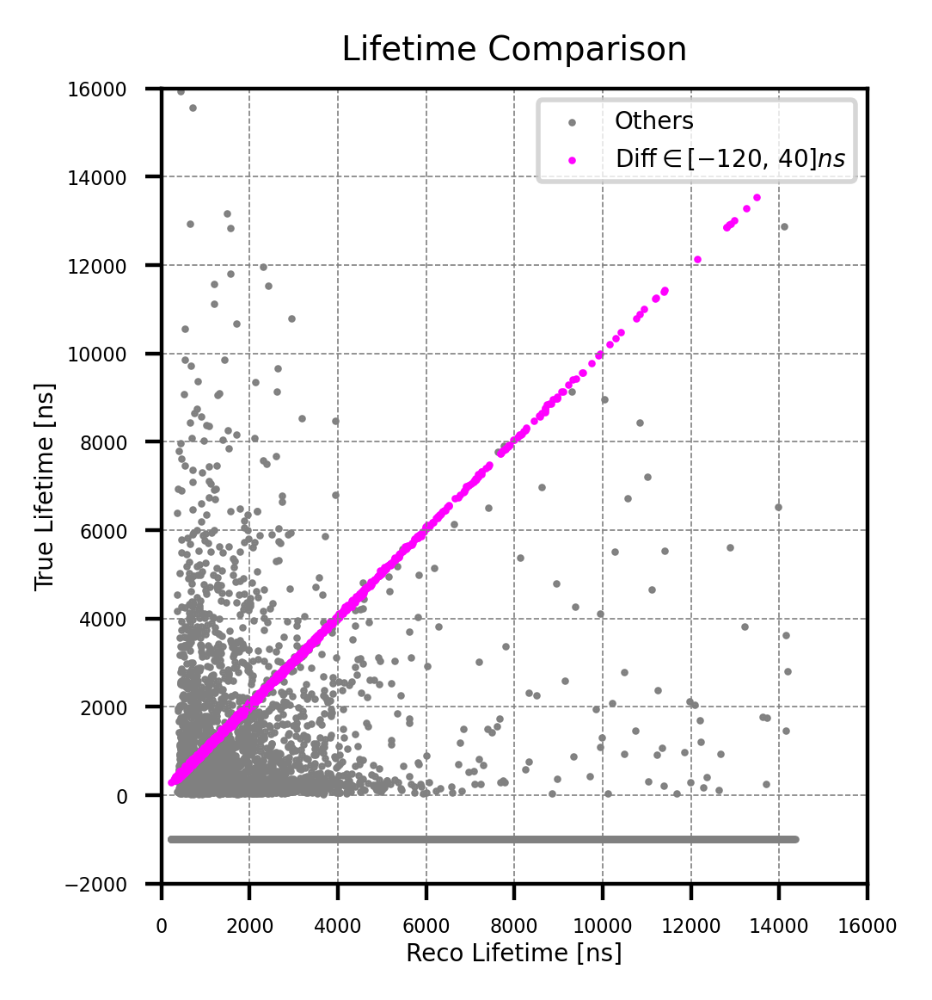

After lifetime cut (cut 3):
Purity (true / reco):  4418 / 182241 (2.42%)

(Diff [-120, 40]):  2052 / 4418 (46.45%)
(Diff OTHERS)    :  180189 / 182241 (98.87%)

Total events        = 182241
Mean Michel score   = 0.001
N(score > 0.8)      = 0
Fraction > 0.8      = 0.000

(michel Intensity) / (muon intensity) (Cut 4):----------
Efficiency (cut4 / cut3):  13882 / 182241 (7.62%)
Purity (true / reco):  2073 / 13882 (14.93%)

(Diff [-120, 40]):  1194 / 2073 (57.60%)
(Diff Others)    :  12688 / 13882 (91.40%)

Total events        = 13882
Mean Michel score   = 0.001
N(score > 0.8)      = 0
Fraction > 0.8      = 0.000


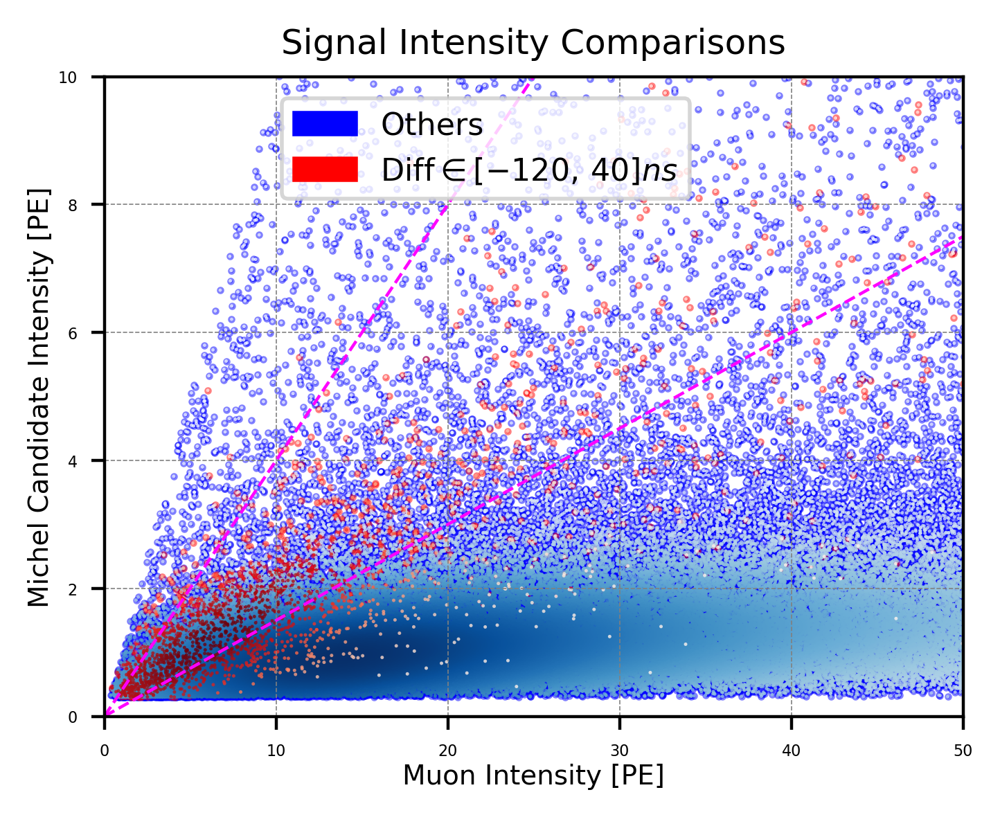


Purify 4----------------------


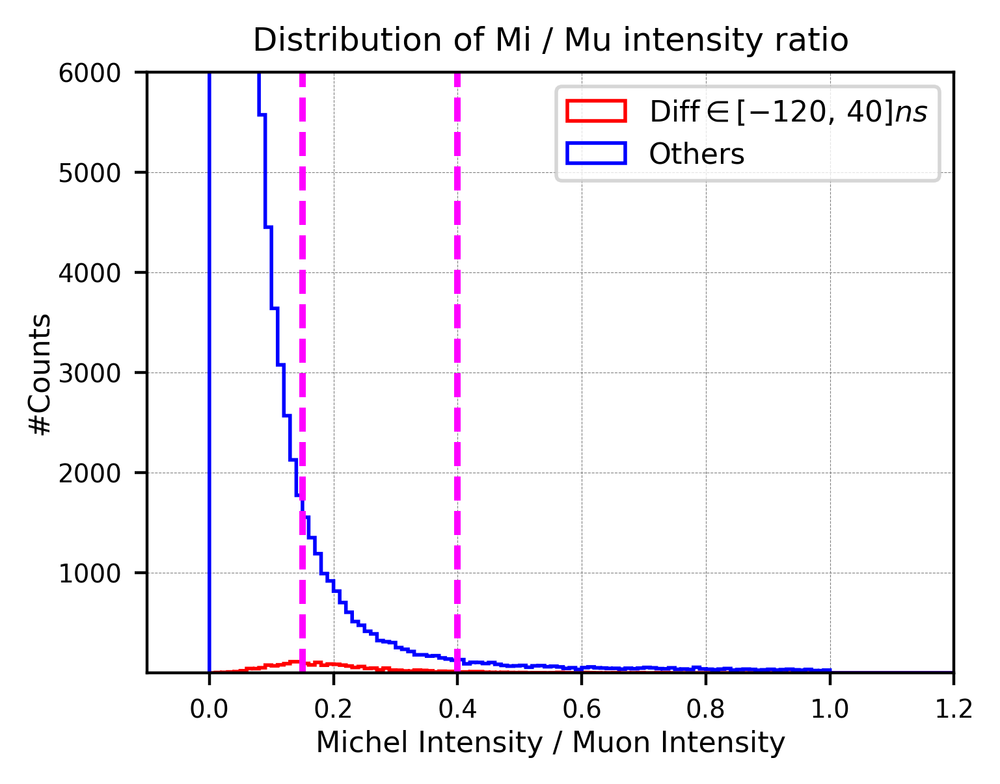

=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===
x=0.005, Ratio=NaN (denominator=0)
x=0.015, Ratio=7990.5000
x=0.025, Ratio=4255.1667
x=0.035, Ratio=2057.2000
x=0.045, Ratio=1229.0000
x=0.055, Ratio=555.4545
x=0.065, Ratio=211.3409
x=0.075, Ratio=164.7907
x=0.085, Ratio=107.1923
x=0.095, Ratio=57.0769
x=0.105, Ratio=51.2817
x=0.115, Ratio=37.9877
x=0.125, Ratio=27.6237
x=0.135, Ratio=19.0000
x=0.145, Ratio=15.8393
x=0.155, Ratio=16.3684
x=0.165, Ratio=16.8875
x=0.175, Ratio=11.3429
x=0.185, Ratio=12.8831
x=0.195, Ratio=10.3258
x=0.205, Ratio=9.5000
x=0.215, Ratio=9.0128
x=0.225, Ratio=8.7826
x=0.235, Ratio=9.3273
x=0.245, Ratio=7.4375
x=0.255, Ratio=9.2444
x=0.265, Ratio=8.1250
x=0.275, Ratio=10.4194
x=0.285, Ratio=6.5000
x=0.295, Ratio=10.8214
x=0.305, Ratio=9.3704
x=0.315, Ratio=11.8000
x=0.325, Ratio=11.8889
x=0.335, Ratio=6.4643
x=0.345, Ratio=7.2400
x=0.355, Ratio=8.0000
x=0.365, Ratio=17.2000
x=0.375, Ratio=8.8235
x=0.385, Ratio=9.2667
x=0.395, Ratio=8.4667
x=0.405, Ratio=14.77

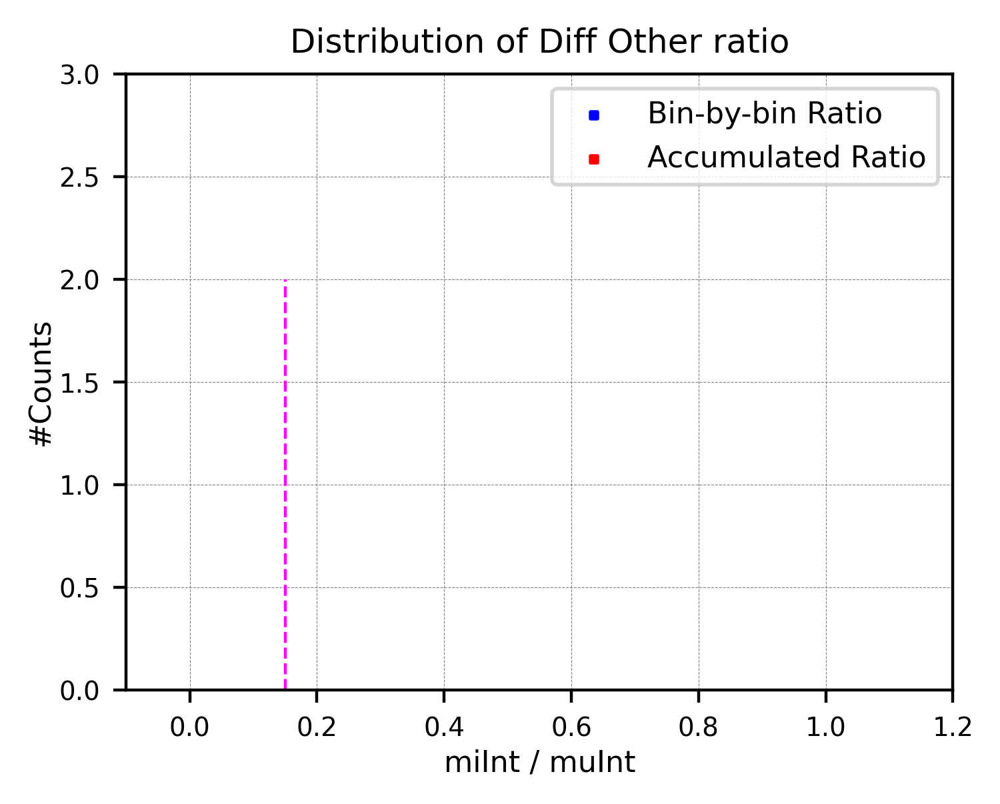

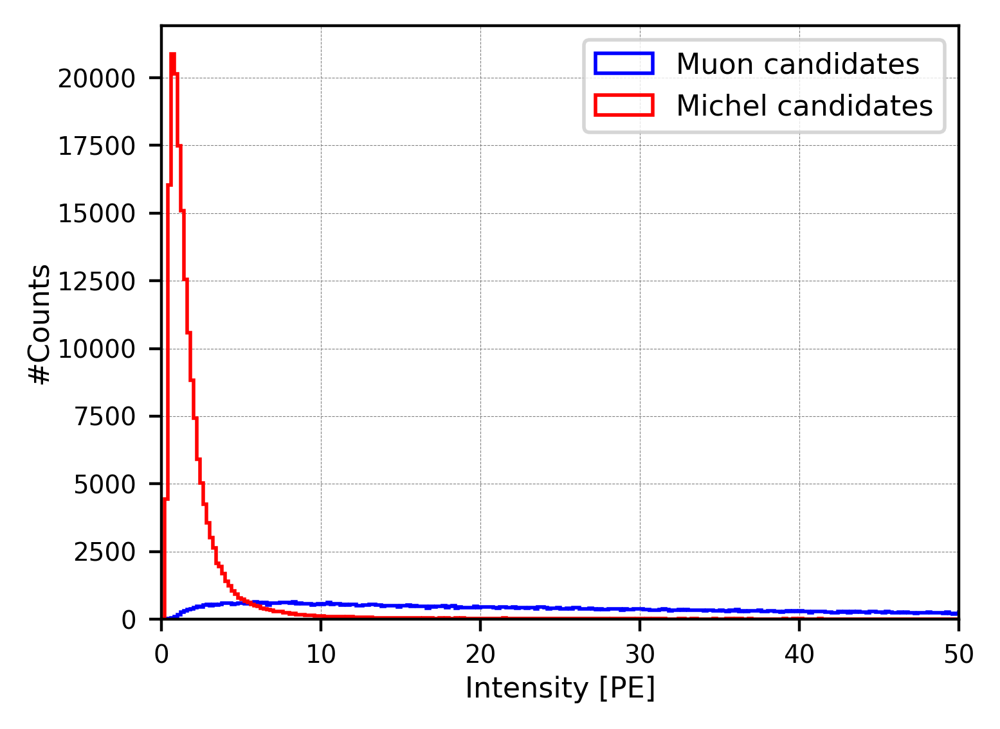

In [15]:
from scipy.stats import gaussian_kde
from matplotlib import colors 
import matplotlib.patches as mpatches

trueLife_diff500 = [ev.true_lifetime for ev in events_diff500]
recoLife_diff500 = [ev.reco_lifetime for ev in events_diff500]
muInt_diff500 = [ev.muon_intensity for ev in events_diff500]
miInt_diff500 = [ev.michel_intensity for ev in events_diff500]
X_diff500 = [ev.posX for ev in events_diff500]

trueLife_diff0 = [ev.true_lifetime for ev in events_diff0]
recoLife_diff0 = [ev.reco_lifetime for ev in events_diff0]
muInt_diff0 = [ev.muon_intensity for ev in events_diff0]
miInt_diff0 = [ev.michel_intensity for ev in events_diff0]
X_diff0 = [ev.posX for ev in events_diff0]

# Total---
muInt_total = [ev.muon_intensity for ev in events_newClass]
miInt_total = [ev.michel_intensity for ev in events_newClass]

mScore_total = [ev.michel_score for ev in events_newClass]



# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoLife_diff500, trueLife_diff500, s=0.3, c='grey', alpha=1.0, label="Others")
plt.scatter(recoLife_diff0, trueLife_diff0, s=0.3, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=5)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(fontsize=5, loc="upper right")
plt.show()








#Michel Intensity Cut (Cut 4)================================================
print("After lifetime cut (cut 3):")

n_valid = sum(1 for ev in events_newClass if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_newClass),
      "({:.2f}%)".format(n_valid/len(events_newClass)*100))

print("\n(Diff [-120, 40]): ", len(events_diff0), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0)/n_valid*100))
print("(Diff OTHERS)    : ", len(muInt_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(muInt_diff500)/len(events_newClass)*100))

#Michel score:
mean_score = sum(mScore_total) / len(mScore_total)
n_high = sum(1 for s in mScore_total if s > 0.8)
frac_high = n_high / len(mScore_total)
print(f"\nTotal events        = {len(mScore_total)}")
print(f"Mean Michel score   = {mean_score:.3f}")
print(f"N(score > 0.8)      = {n_high}")
print(f"Fraction > 0.8      = {frac_high:.3f}")




thre1 = 7.5 / 50
thre2 = 40 / 100

# filter the actual events
events_diff0_purify4 = [
    ev for ev in events_diff0
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
events_diff500_purify4 = [
    ev for ev in events_diff500
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
#-------------------------------

print("\n(michel Intensity) / (muon intensity) (Cut 4):----------")
events_total_purify4 = events_diff0_purify4 + events_diff500_purify4

print("Efficiency (cut4 / cut3): ", len(events_total_purify4), "/", len(events_newClass),
      "({:.2f}%)".format(len(events_total_purify4)/len(events_newClass)*100))

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff [-120, 40]): ", len(events_diff0_purify4), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify4)/n_valid*100))
print("(Diff Others)    : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))


mScore_purify4 = [ev.michel_score for ev in events_total_purify4]
#Michel score:
mean_score_purify4 = sum(mScore_purify4) / len(mScore_purify4)
n_high_purify4 = sum(1 for s in mScore_purify4 if s > 0.8)
frac_high_purify4 = n_high_purify4 / len(mScore_purify4)
print(f"\nTotal events        = {len(mScore_purify4)}")
print(f"Mean Michel score   = {mean_score_purify4:.3f}")
print(f"N(score > 0.8)      = {n_high_purify4}")
print(f"Fraction > 0.8      = {frac_high_purify4:.3f}")







# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500), np.array(miInt_diff500)
x2, y2 = np.array(muInt_diff0), np.array(miInt_diff0)
x3, y3 = np.array(muInt_total), np.array(miInt_total)#total---
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Density for group total ---
xy3 = np.vstack([x3, y3])
z3 = gaussian_kde(xy3)(xy3)
idx3 = z3.argsort()
x3, y3, z3 = x3[idx3], y3[idx3], z3[idx3]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
#plt.scatter(x3, y3, s=0.8, color="orange", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#plt.scatter(x3, y3, c=z3, s=0.8, cmap="Oranges", alpha=0.8, edgecolors="none", label="MC Reco Total")
#---------------------------------

plt.plot([0, 500], [0, 75], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 1000], [0, 400], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)#(-5, 400)
plt.ylim(0, 10)#(-5, 60)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

#orange_patch = mpatches.Patch(color="orange", label="Total MC Reco")
#plt.legend(handles=[orange_patch], loc="upper right", frameon=True, 
#           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()






#Ratio distribution===================================
print("\nPurify 4----------------------")

ratio_diff500_purify3 = [mi / mu for mi, mu in zip(miInt_diff500, muInt_diff500) if mu != 0]
ratio_diff0_purify3 = [mi / mu for mi, mu in zip(miInt_diff0, muInt_diff0) if mu != 0]
ratio_total_purify3 = [mi / mu for mi, mu in zip(miInt_total, muInt_total) if mu != 0]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purify3, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(ratio_diff500_purify3, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")
#plt.hist(ratio_total_purify3, bins=bins, range=(range_min, range_max), edgecolor='orange', 
#         histtype='step', linewidth=1.0, label="Total")

plt.plot([0.15, 0.15], [0, 40000], color="magenta", linewidth=1.8, linestyle='--')
plt.plot([0.4, 0.4], [0, 40000], color="magenta", linewidth=1.8, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('Michel Intensity / Muon Intensity', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 6000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 







# Bin-by-bin ratio & Accumulated ratio of ratio distribution================

# --- Your original binning ---
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])

hist_diff, _  = np.histogram(ratio_diff0_purify3, bins=bins)
hist_other, _ = np.histogram(ratio_diff500_purify3, bins=bins)

# Avoid division by zero
hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)

ratio_bin = hist_other / hist_diff_safe

# Print bin-by-bin ratios
print("=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator=0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")

cum_diff  = np.cumsum(hist_diff[::-1])[::-1]
cum_other = np.cumsum(hist_other[::-1])[::-1]
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)

plt.figure(figsize=(4,3), dpi=400)

# --- Scatter points: bin-by-bin ratio (blue) ---
plt.scatter(x_centers, ratio_bin, marker='s',
            color='blue', s=3, label="Bin-by-bin Ratio")

# --- Scatter points: accumulated ratio (red) ---
plt.scatter(x_centers, cum_ratio, marker='s',
            color='red', s=3, label="Accumulated Ratio")

plt.plot([0.15, 0.15], [0, 2], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('miInt / muInt', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.0, 3.0)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Diff Other ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 









#Single Intensities===================================

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.2
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_total, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Muon candidates")
plt.hist(miInt_total, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Michel candidates")

#plt.plot([1, 1], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([4, 4], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 50)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 30000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 





#### Cut 5: Michel intensity & Muon intensity: 

After cut 4):
Purity (true / reco):  2073 / 13882 (14.93%)

(Diff [-120, 40]:  1194 / 2073 (57.60%)
(Diff Others     :  12688 / 13882 (91.40%)

Michel Intensity Cut (Cut 5):--------------
Efficiency (cut5 / cut4):  8440 / 13882 (60.80%)
Purity (true / reco)    :  1076 / 8440 (12.75%)

(Diff [-120, 40]:  874 / 1076 (81.23%)
(Diff OTHERS    :  7566 / 8440 (89.64%)


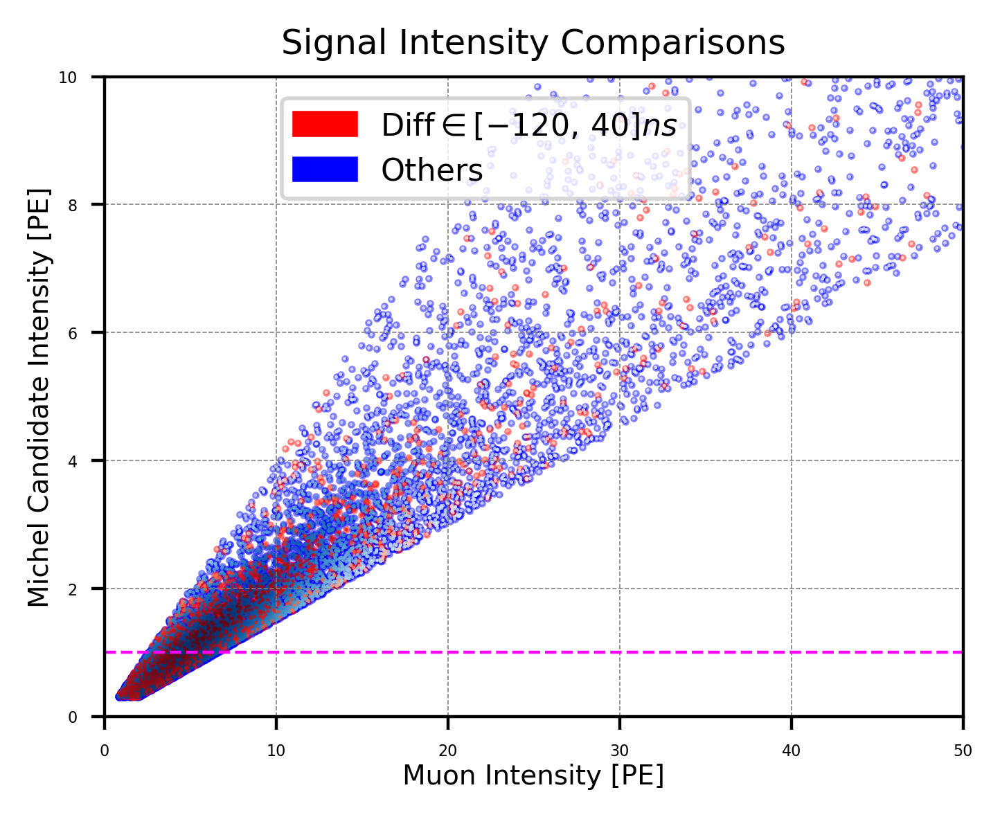


Purify 5----------------------


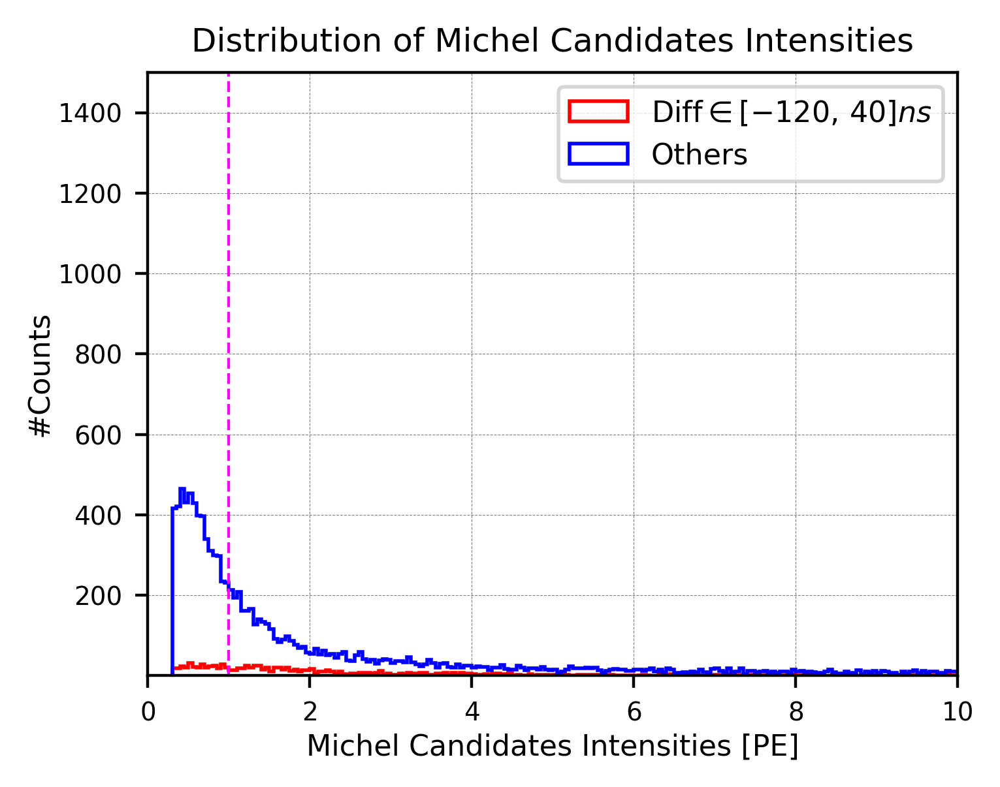

In [16]:
#Michel & Muon Intensities Cut (Cut 5)================================================
print("After cut 4):")

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify4), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify4)/n_valid*100))
print("(Diff Others     : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))



thre_muInt = 0.3 # mu Int will automatically higher than mi---
thre_miInt = 1.0

# filter the actual events
events_diff0_purify5 = [
    ev for ev in events_diff0_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
events_diff500_purify5 = [
    ev for ev in events_diff500_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
#-------------------------------

print("\nMichel Intensity Cut (Cut 5):--------------")

events_total_purify5 = events_diff0_purify5 + events_diff500_purify5

print("Efficiency (cut5 / cut4): ", len(events_total_purify5), "/", len(events_total_purify4),
      "({:.2f}%)".format(len(events_total_purify5)/len(events_total_purify4)*100))

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))







# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
muInt_diff500_purify4 = [ev.muon_intensity for ev in events_diff500_purify4]#Events after purification 4---
miInt_diff500_purify4 = [ev.michel_intensity for ev in events_diff500_purify4]

muInt_diff0_purify4 = [ev.muon_intensity for ev in events_diff0_purify4]
miInt_diff0_purify4 = [ev.michel_intensity for ev in events_diff0_purify4]



plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500_purify4), np.array(miInt_diff500_purify4)
x2, y2 = np.array(muInt_diff0_purify4), np.array(miInt_diff0_purify4)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")

#---------------------------------

plt.plot([0, 100], [1.0, 1.0], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)
plt.ylim(0, 10)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
blue_patch = mpatches.Patch(color="blue", label="Others")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()







#Michel Intensity distribution===================================
print("\nPurify 5----------------------")

#miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
#miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(miInt_diff0_purify4, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(miInt_diff500_purify4, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([1.0, 1.0], [0, 2000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 10)
plt.xlabel('Michel Candidates Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Michel Candidates Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





#### Mu & Michel intensity distributions after Cut 5:

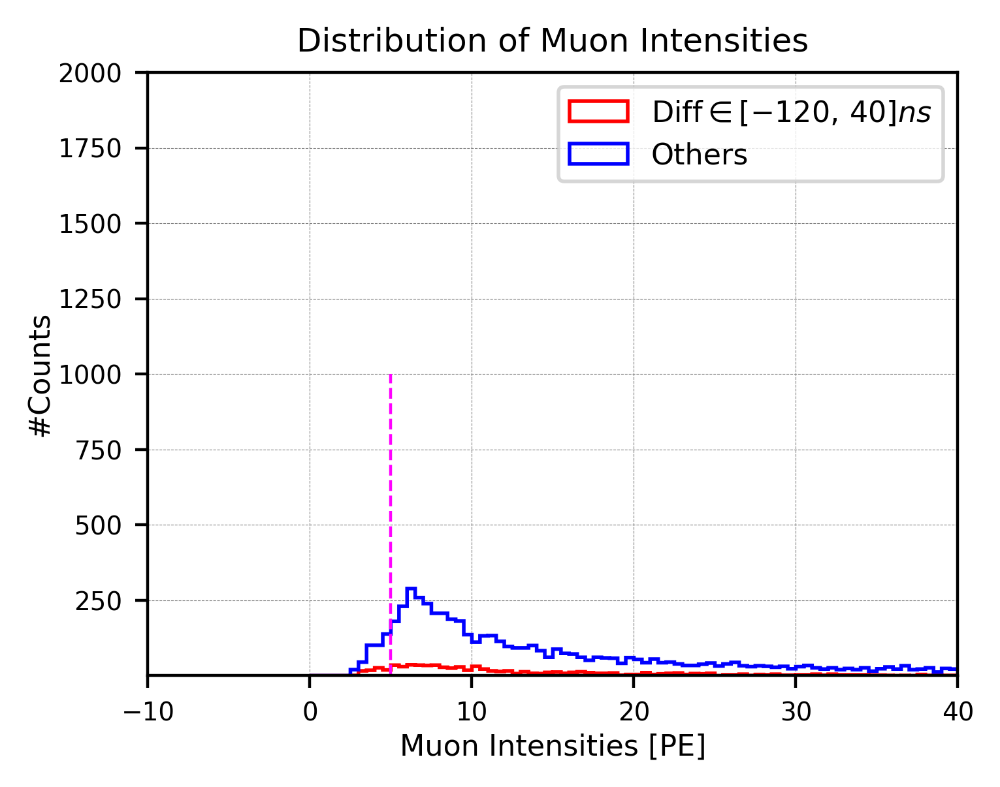

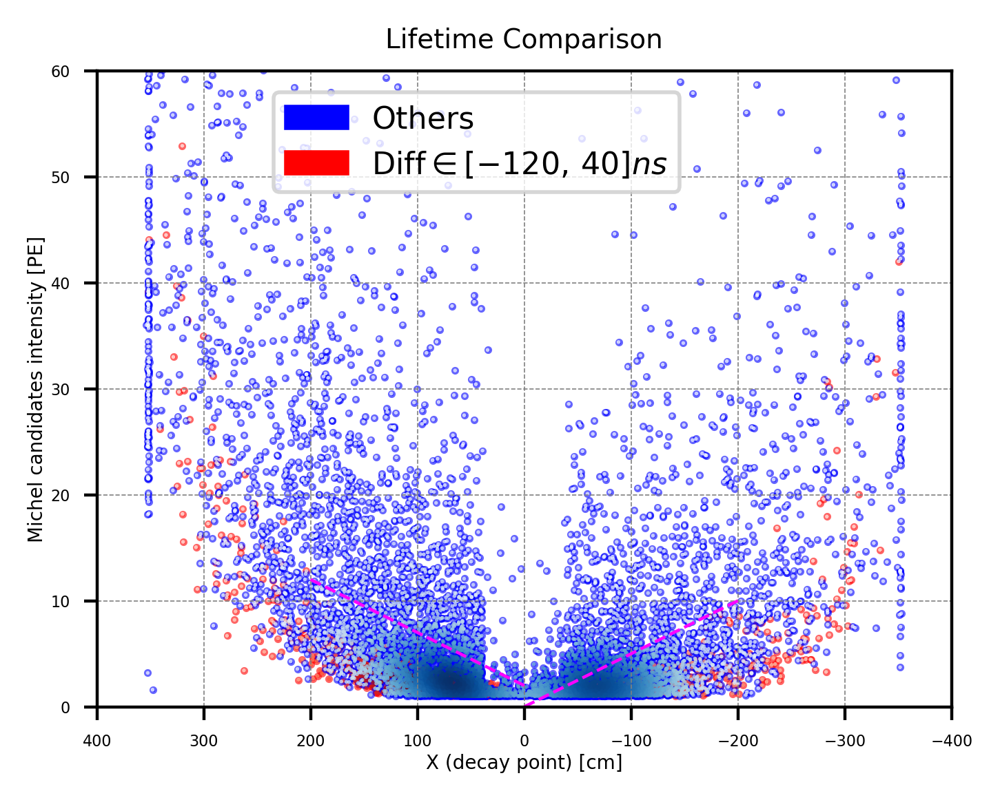

In [17]:
#Muon Intensity distribution===================================

muInt_diff500_purify5 = [ev.muon_intensity for ev in events_diff500_purify5]
muInt_diff0_purify5 = [ev.muon_intensity for ev in events_diff0_purify5]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = 0
range_max = 300
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_diff0_purify5, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(muInt_diff500_purify5, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([5, 5], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-10, 40)
plt.xlabel('Muon Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Muon Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 





#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5 = [ev.posX for ev in events_diff500_purify5]
posX_diff0_purify5 = [ev.posX for ev in events_diff0_purify5]
miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5, dtype=float)
y0 = np.array(miInt_diff0_purify5, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5, dtype=float)
y1 = np.array(miInt_diff500_purify5, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()

#### Cut 5': Michel signal VS Distance cut:

After cut 5:---------
Purity (true / reco)    :  1076 / 8440 (12.75%)

(Diff [-120, 40]:  874 / 1076 (81.23%)
(Diff OTHERS    :  7566 / 8440 (89.64%)

After Cut 5' (Michel vs Distance):--------------
Efficiency (cut5' / cut5):  6452 / 8440 (76.45%)
Purity (true / reco)    :  1062 / 6452 (16.46%)

(Diff [-120, 40]:  873 / 1062 (82.20%)
(Diff OTHERS    :  5579 / 6452 (86.47%)


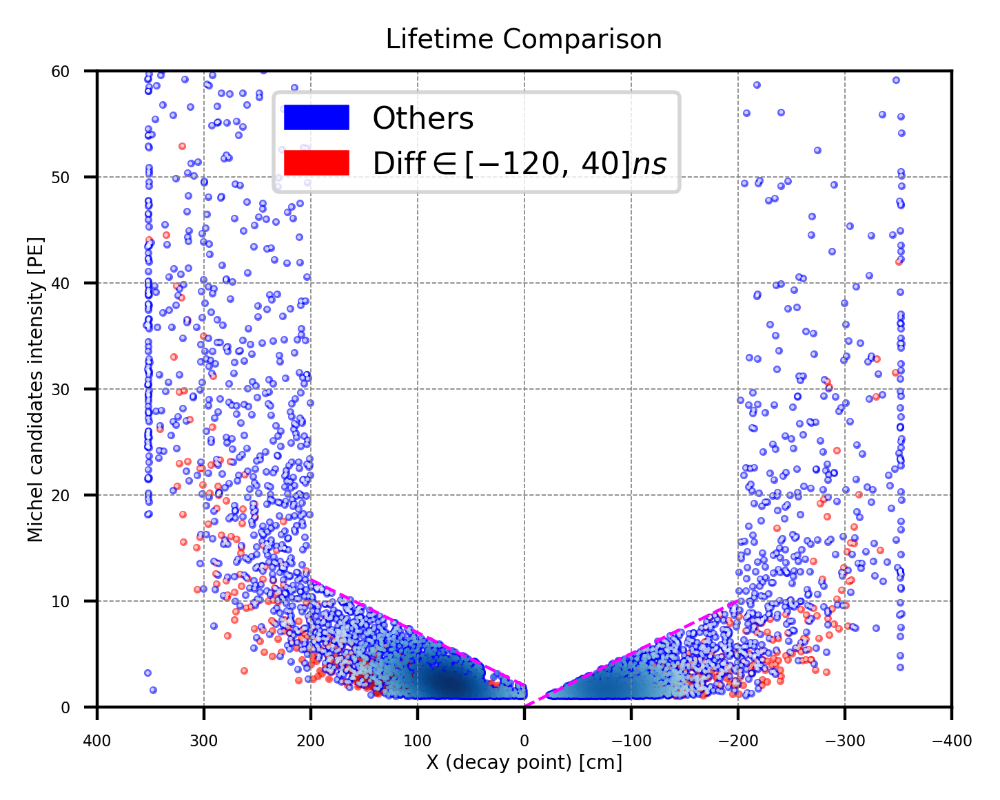

In [18]:
print("After cut 5:---------")

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))


#Michel Peak rise & drop Cut (Cut 5')--------
# --- Define slopes and intercepts for both cuts ---
slope_pos = (7 - 2) / 100.0      # = 0.05
intercept_pos = 2.0

slope_neg = (10 - 0) / (-200 - 0.0)  # = -0.05
intercept_neg = 0.0

def below_line_cut(ev):
    """Return True if event passes both (posX, michel_intensity) cuts."""
    x = ev.posX
    y = ev.michel_intensity

    # Region 1: positive side [0, 100]
    if 0 <= x <= 200:
        return y <= intercept_pos + slope_pos * x

    # Region 2: negative side [-200, 0]
    elif -200 <= x <= 0:
        return y <= intercept_neg + slope_neg * x

    # Outside both ranges: no cut
    else:
        return True

# --- Apply the geometric cut to both event classes ---
events_diff0_purify5P = [ev for ev in events_diff0_purify5 if below_line_cut(ev)]
events_diff500_purify5P = [ev for ev in events_diff500_purify5 if below_line_cut(ev)]
#-------------------------------





print("\nAfter Cut 5' (Michel vs Distance):--------------")

events_total_purify5P = events_diff0_purify5P + events_diff500_purify5P

print("Efficiency (cut5' / cut5): ", len(events_total_purify5P), "/", len(events_total_purify5),
      "({:.2f}%)".format(len(events_total_purify5P)/len(events_total_purify5)*100))

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5P), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5P)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))






#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5P = [ev.posX for ev in events_diff500_purify5P]
posX_diff0_purify5P = [ev.posX for ev in events_diff0_purify5P]
miInt_diff500_purify5P = [ev.michel_intensity for ev in events_diff500_purify5P]
miInt_diff0_purify5P = [ev.michel_intensity for ev in events_diff0_purify5P]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5P, dtype=float)
y0 = np.array(miInt_diff0_purify5P, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5P, dtype=float)
y1 = np.array(miInt_diff500_purify5P, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#### Cut 6: Michel peak rise and drop slope: 

After cut 5':---------
Purity (true / reco)    :  1062 / 6452 (16.46%)

(Diff [-120, 40]:  873 / 1062 (82.20%)
(Diff Others    :  5579 / 6452 (86.47%)

Michel Peak Rise Drop Slope (Cut 6):--------------
Efficiency (cut6 / cut5P):  5087 / 6452 (78.84%)
Purity (true / reco)    :  807 / 5087 (15.86%)

(Diff [-120, 40]:  700 / 807 (86.74%)
(Diff OTHERS    :  4387 / 5087 (86.24%)


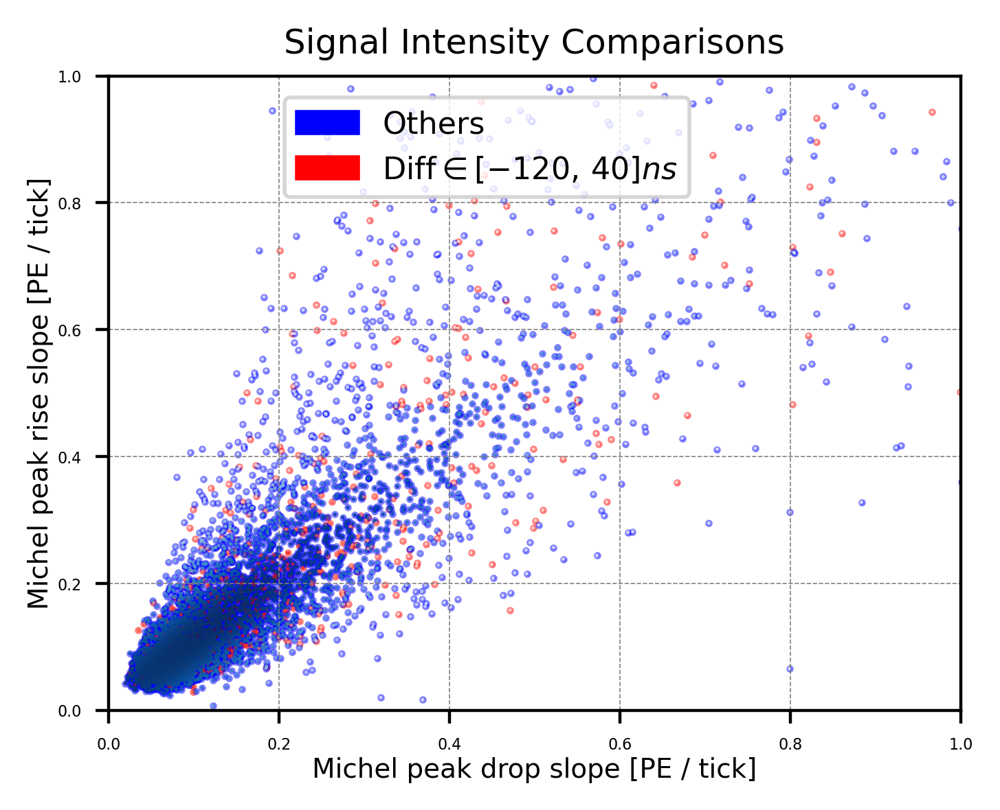

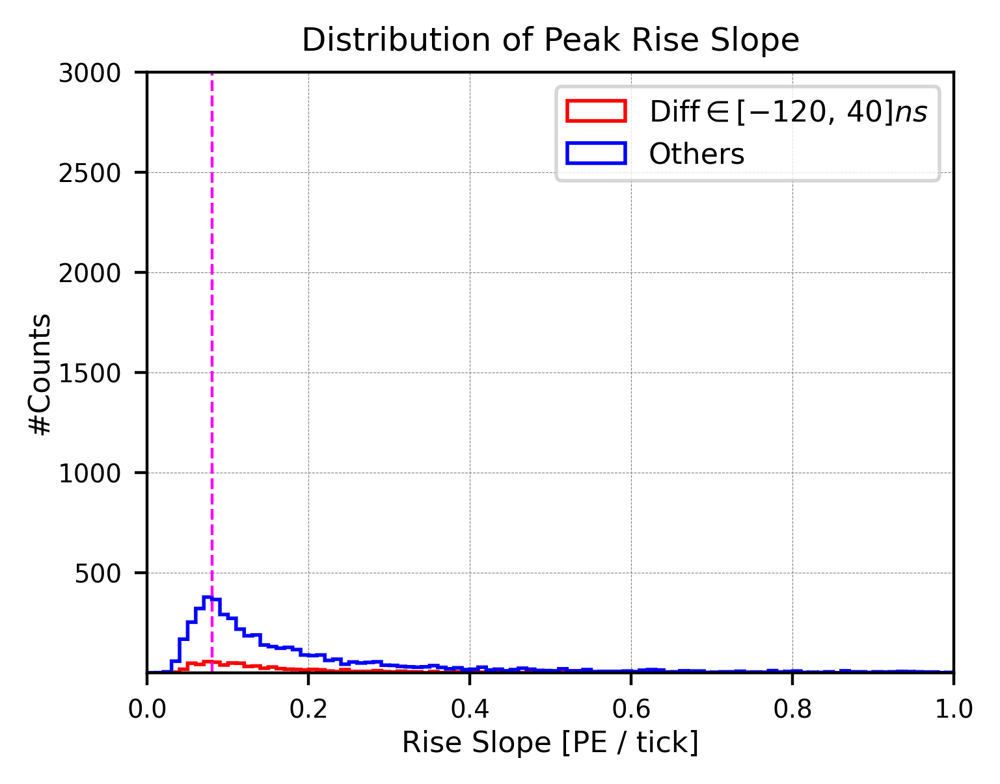

=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===
x=0.005, Ratio=NaN (denominator=0)
x=0.015, Ratio=NaN (denominator=0)
x=0.025, Ratio=6.0000
x=0.035, Ratio=14.7500
x=0.045, Ratio=8.8947
x=0.055, Ratio=5.1837
x=0.065, Ratio=7.4884
x=0.075, Ratio=6.6491
x=0.085, Ratio=6.7963
x=0.095, Ratio=7.3000
x=0.105, Ratio=5.4600
x=0.115, Ratio=4.4694
x=0.125, Ratio=5.6364
x=0.135, Ratio=5.4286
x=0.145, Ratio=5.8333
x=0.155, Ratio=4.4000
x=0.165, Ratio=5.6364
x=0.175, Ratio=6.7368
x=0.185, Ratio=6.5000
x=0.195, Ratio=6.0000
x=0.205, Ratio=4.8333
x=0.215, Ratio=5.6250
x=0.225, Ratio=6.3000
x=0.235, Ratio=9.8571
x=0.245, Ratio=2.5882
x=0.255, Ratio=6.8750
x=0.265, Ratio=6.2500
x=0.275, Ratio=6.6250
x=0.285, Ratio=4.6667
x=0.295, Ratio=5.5714
x=0.305, Ratio=7.6000
x=0.315, Ratio=3.6667
x=0.325, Ratio=5.1667
x=0.335, Ratio=4.8333
x=0.345, Ratio=31.0000
x=0.355, Ratio=5.2857
x=0.365, Ratio=14.0000
x=0.375, Ratio=7.0000
x=0.385, Ratio=4.3333
x=0.395, Ratio=5.6667
x=0.405, Ratio=6.3333
x=0.415, Ratio=7.2

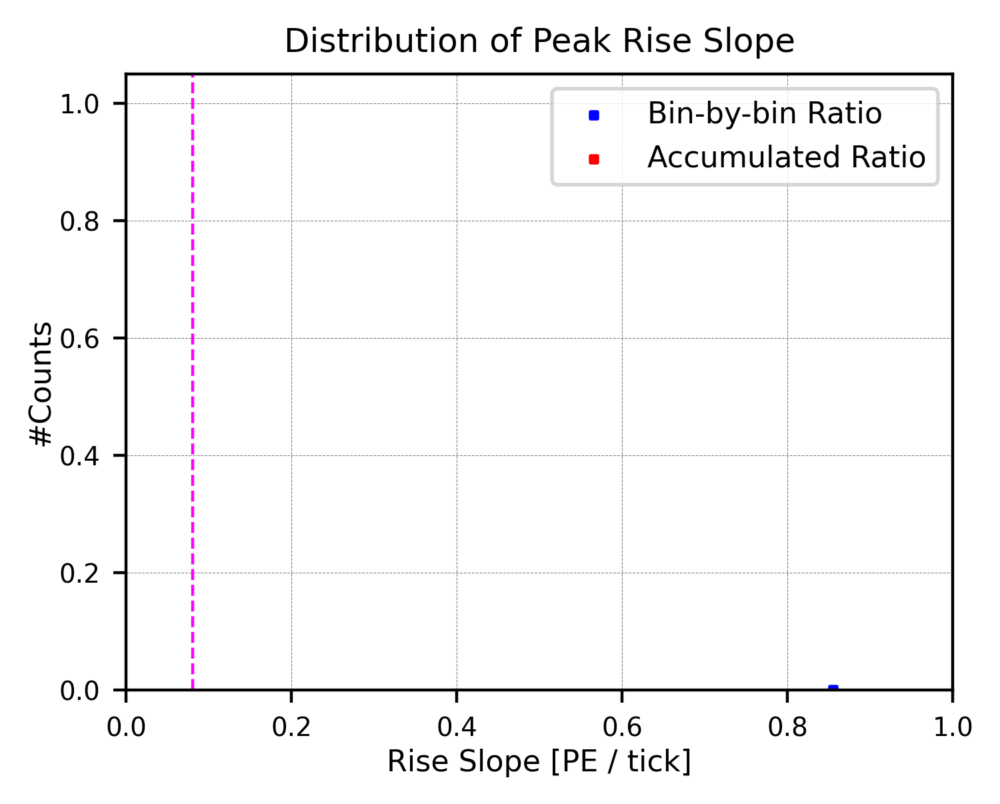

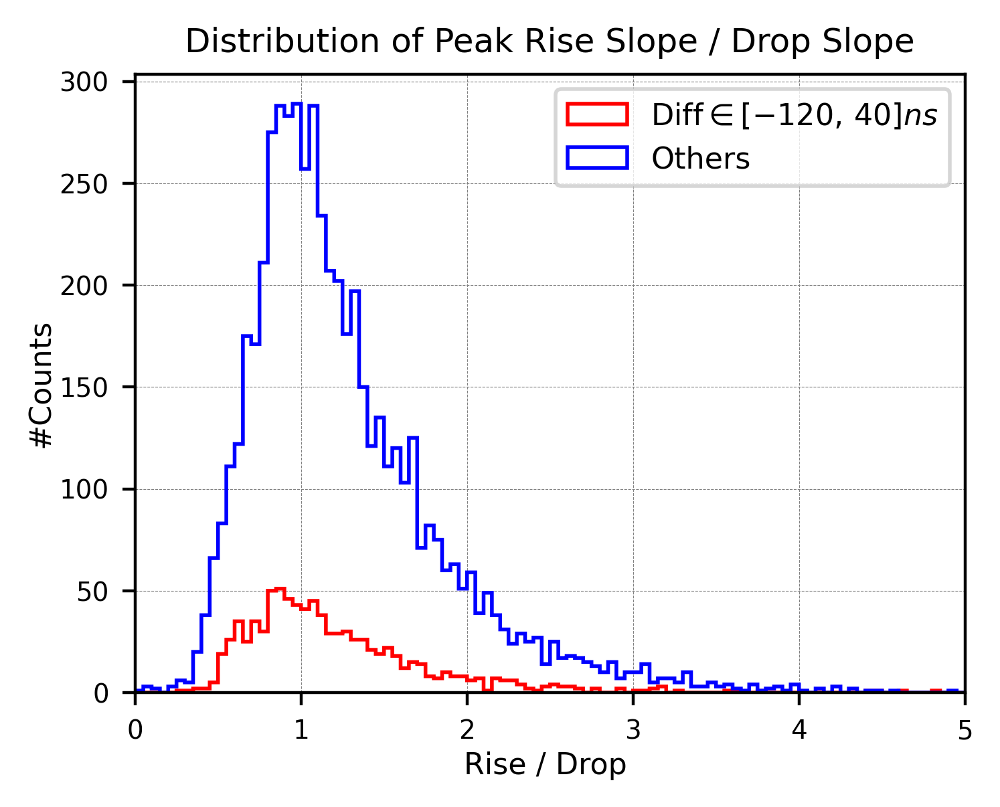

In [19]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 5':---------")

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify5P), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify5P)/n_valid*100))
print("(Diff Others    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))


rise_diff0_purity5P = [ev.michel_rise for ev in events_diff0_purify5P]
drop_diff0_purity5P = [ev.michel_drop for ev in events_diff0_purify5P]

ratios_diff0_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff0_purity5P, drop_diff0_purity5P)
]

rise_diff500_purity5P = [ev.michel_rise for ev in events_diff500_purify5P]
drop_diff500_purity5P = [ev.michel_drop for ev in events_diff500_purify5P]

ratios_diff500_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff500_purity5P, drop_diff500_purity5P)
]



thre_rise = 0.08 # mu Int will automatically higher than mi---


# filter the actual events
events_diff0_purify6 = [
    ev for ev in events_diff0_purify5P
    if thre_rise < ev.michel_rise
]
events_diff500_purify6 = [
    ev for ev in events_diff500_purify5P
    if thre_rise < ev.michel_rise 
]
#-------------------------------



print("\nMichel Peak Rise Drop Slope (Cut 6):--------------")

events_total_purify6 = events_diff0_purify6 + events_diff500_purify6

print("Efficiency (cut6 / cut5P): ", len(events_total_purify6), "/", len(events_total_purify5P),
      "({:.2f}%)".format(len(events_total_purify6)/len(events_total_purify5P)*100))

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify6), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify6)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))








# ==========================================================
# Michel Rise VS Michel Drop
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(drop_diff500_purity5P), np.array(rise_diff500_purity5P)
x2, y2 = np.array(drop_diff0_purity5P), np.array(rise_diff0_purity5P)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")


#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel('Michel peak drop slope [PE / tick]', labelpad=1, fontsize=7)
plt.ylabel('Michel peak rise slope [PE / tick]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#Michel Rise Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(rise_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(rise_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.08, 0.08], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 1.0)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 3000)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





# Bin-by-bin ratio & Accumulated ratio distribution================


# --- Your original binning ---
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])

hist_diff, _  = np.histogram(rise_diff0_purity5P, bins=bins)
hist_other, _ = np.histogram(rise_diff500_purity5P, bins=bins)

# Avoid division by zero
hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)

ratio_bin = hist_other / hist_diff_safe

# Print bin-by-bin ratios
print("=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator=0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")

cum_diff  = np.cumsum(hist_diff[::-1])[::-1]
cum_other = np.cumsum(hist_other[::-1])[::-1]
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)

plt.figure(figsize=(4,3), dpi=400)

# --- Scatter points: bin-by-bin ratio (blue) ---
plt.scatter(x_centers, ratio_bin, marker='s',
            color='blue', s=3, label="Bin-by-bin Ratio")

# --- Scatter points: accumulated ratio (red) ---
plt.scatter(x_centers, cum_ratio, marker='s',
            color='red', s=3, label="Accumulated Ratio")

plt.plot([0.08, 0.08], [0, 2], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 1.0)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.0, 1.05)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 











#Michel Rise & Drop Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.hist(drop_diff0_purity1, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
#         histtype='step', linewidth=1.0, label="Drop for Diff0")
#plt.hist(drop_diff500_purity1, bins=bins, range=(range_min, range_max), edgecolor='green', 
#         histtype='step', linewidth=1.0, label="Drop for Diff500")
plt.hist(ratios_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(ratios_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")


plt.xlim(0, 5)
plt.xlabel('Rise / Drop ', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope / Drop Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 







#Apply Cut======================================




### Cut 7: 2nd 3rd peak intensity diff cut

After cut 6:---------
Purity (true / reco)    :  807 / 5087 (15.86%)

(Diff [-120, 40]:  700 / 807 (86.74%)
(Diff OTHERS    :  4387 / 5087 (86.24%)

Third / Second peak intensity (Cut 7):--------------
Efficiency (cut7 / cut6):  4467 / 5087 (87.81%)
Purity (true / reco)    :  690 / 4467 (15.45%)

(Diff [-120, 40]:  619 / 690 (89.71%)
(Diff OTHERS    :  3848 / 4467 (86.14%)


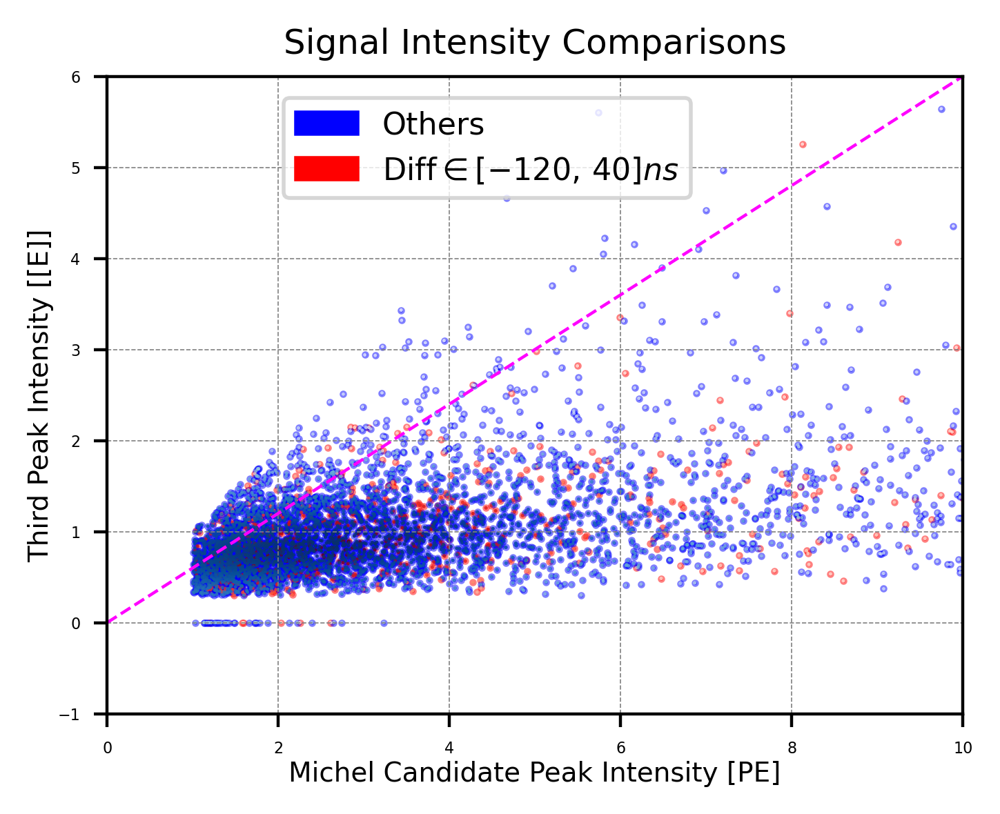

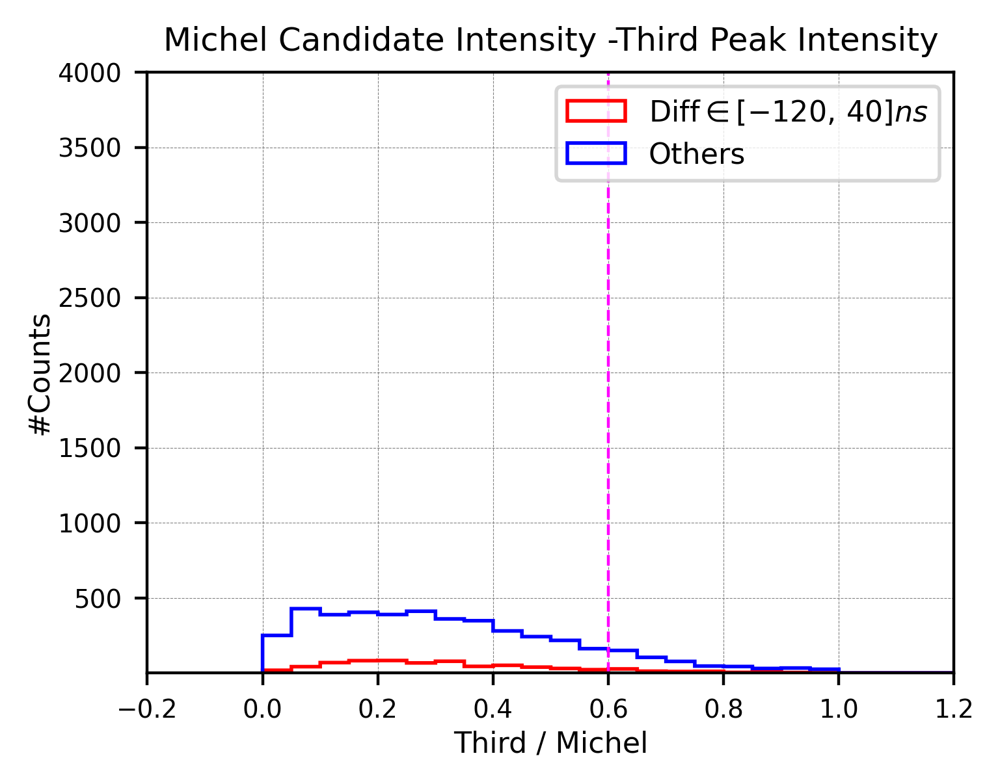

=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===
x=0.025, Ratio=13.8889
x=0.075, Ratio=10.1905
x=0.125, Ratio=5.6232
x=0.175, Ratio=4.9268
x=0.225, Ratio=4.6867
x=0.275, Ratio=6.1343
x=0.325, Ratio=4.6154
x=0.375, Ratio=7.9091
x=0.425, Ratio=5.4902
x=0.475, Ratio=6.2051
x=0.525, Ratio=7.2333
x=0.575, Ratio=7.3636
x=0.625, Ratio=5.5556
x=0.675, Ratio=8.6667
x=0.725, Ratio=7.7000
x=0.775, Ratio=4.1818
x=0.825, Ratio=10.7500
x=0.875, Ratio=4.2857
x=0.925, Ratio=11.0000
x=0.975, Ratio=25.0000
x=1.025, Ratio=NaN (denominator = 0)
x=1.075, Ratio=NaN (denominator = 0)
x=1.125, Ratio=NaN (denominator = 0)
x=1.175, Ratio=NaN (denominator = 0)
x=1.225, Ratio=NaN (denominator = 0)
x=1.275, Ratio=NaN (denominator = 0)
x=1.325, Ratio=NaN (denominator = 0)
x=1.375, Ratio=NaN (denominator = 0)
x=1.425, Ratio=NaN (denominator = 0)
x=1.475, Ratio=NaN (denominator = 0)
x=1.525, Ratio=NaN (denominator = 0)
x=1.575, Ratio=NaN (denominator = 0)
x=1.625, Ratio=NaN (denominator = 0)
x=1.675, Ratio=NaN (den

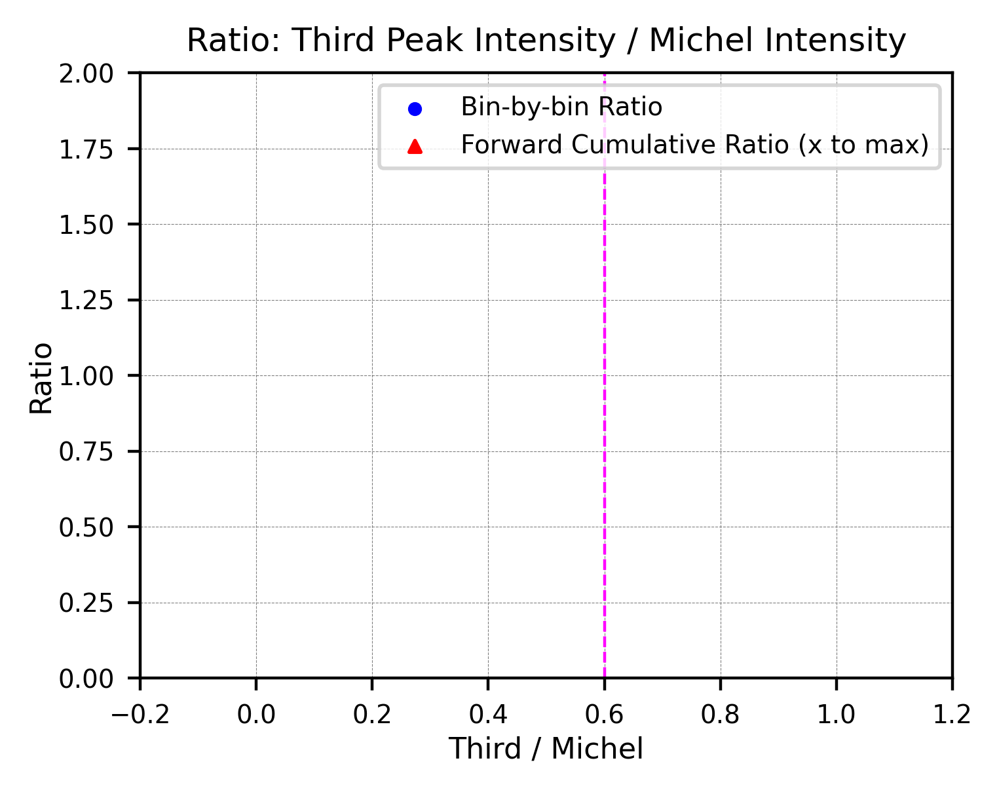

In [20]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 6:---------")

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify6), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify6)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))



miInt_diff0_purity6 = [ev.michel_intensity for ev in events_diff0_purify6]
thInt_diff0_purity6 = [ev.third_intensity for ev in events_diff0_purify6]

miInt_diff500_purity6 = [ev.michel_intensity for ev in events_diff500_purify6]
thInt_diff500_purity6 = [ev.third_intensity for ev in events_diff500_purify6]



# Element-by-element ratio (thInt / miInt)
ratio_diff0_purity6 = [th / mi for th, mi in zip(thInt_diff0_purity6, miInt_diff0_purity6)]
ratio_diff500_purity6 = [th / mi for th, mi in zip(thInt_diff500_purity6, miInt_diff500_purity6)]


thre1 = 0.0
thre2 = 0.6

# filter the actual events
events_diff0_purify7 = [
    ev for ev in events_diff0_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
events_diff500_purify7 = [
    ev for ev in events_diff500_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
#-------------------------------


print("\nThird / Second peak intensity (Cut 7):--------------")

events_total_purify7 = events_diff0_purify7 + events_diff500_purify7

print("Efficiency (cut7 / cut6): ", len(events_total_purify7), "/", len(events_total_purify6),
      "({:.2f}%)".format(len(events_total_purify7)/len(events_total_purify6)*100))

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify7), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify7)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))








# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity6), np.array(thInt_diff500_purity6) #(x, y)
x2, y2 = np.array(miInt_diff0_purity6), np.array(thInt_diff0_purity6)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 100], [0, 60], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()






#Third / Michel Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purity6, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(ratio_diff500_purity6, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.6, 0.6], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.2, 1.2)
plt.xlabel('Third / Michel', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 4000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 






# ============================================================
# Ratio Plot for Third/Michel Distributions (scatter only)
# ============================================================


# --- Binning (same as your histogram) ---
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)
x_centers = 0.5 * (bins[:-1] + bins[1:])


hist_diff, _  = np.histogram(ratio_diff0_purity6, bins=bins)
hist_other, _ = np.histogram(ratio_diff500_purity6, bins=bins)

hist_diff_safe = np.where(hist_diff == 0, np.nan, hist_diff)


ratio_bin = hist_other / hist_diff_safe

print("=== Bin-by-bin Ratio: Others / Diff [-120, 40] ===")
for xc, r in zip(x_centers, ratio_bin):
    if np.isnan(r):
        print(f"x={xc:.3f}, Ratio=NaN (denominator = 0)")
    else:
        print(f"x={xc:.3f}, Ratio={r:.4f}")



# forward cumulative ratio
cum_diff  = np.cumsum(hist_diff)
cum_other = np.cumsum(hist_other)
cum_ratio = cum_other / np.where(cum_diff == 0, np.nan, cum_diff)



plt.figure(figsize=(4,3), dpi=400)

# --- Scatter: bin-by-bin ratio (blue circles) ---
plt.scatter(x_centers, ratio_bin,
            color='blue', s=8, marker='o',
            label="Bin-by-bin Ratio")

# --- Scatter: accumulated ratio (red triangles) ---
plt.scatter(x_centers, cum_ratio,
            color='red', s=10, marker='^',
            label="Forward Cumulative Ratio (x to max)")

plt.plot([0.6, 0.6], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')


plt.xlim(-0.2, 1.2)
plt.ylim(0, 2.0)

plt.xlabel('Third / Michel', labelpad=2, fontsize=8)
plt.ylabel('Ratio', labelpad=1, fontsize=8)

plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.tick_params(labelsize=7)
plt.title('Ratio: Third Peak Intensity / Michel Intensity', fontsize=9)

plt.legend(fontsize=7, loc="upper right")

plt.show()


### Cut 8: Third second peak intensity ratio cut


After Cut 7:--------------
Purity (true / reco)    :  690 / 4467 (15.45%)

(Diff [-120, 40]:  619 / 690 (89.71%)
(Diff OTHERS    :  3848 / 4467 (86.14%)

Michel 3rd Peaks intensity Diff (Cut 8):--------------
Efficiency (cut8 / cut7):  4262 / 4467 (95.41%)
Purity (true / reco)    :  661 / 4262 (15.51%)

(Diff [-120, 40]:  600 / 661 (90.77%)
(Diff OTHERS    :  3662 / 4262 (85.92%)


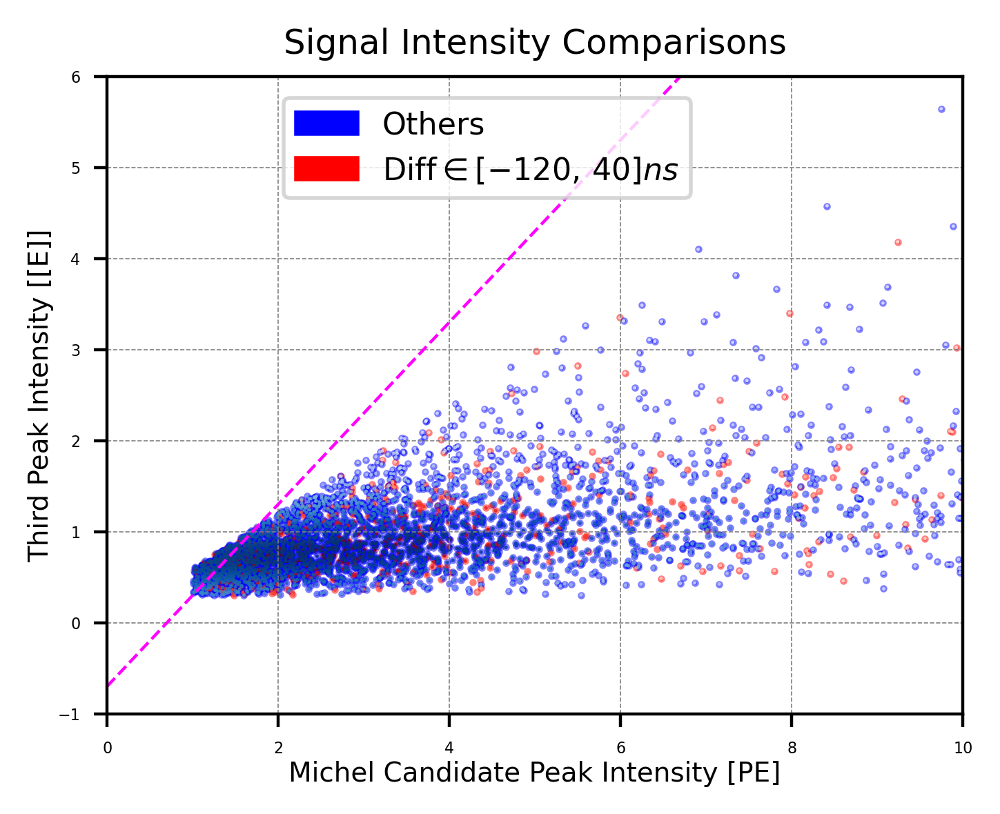

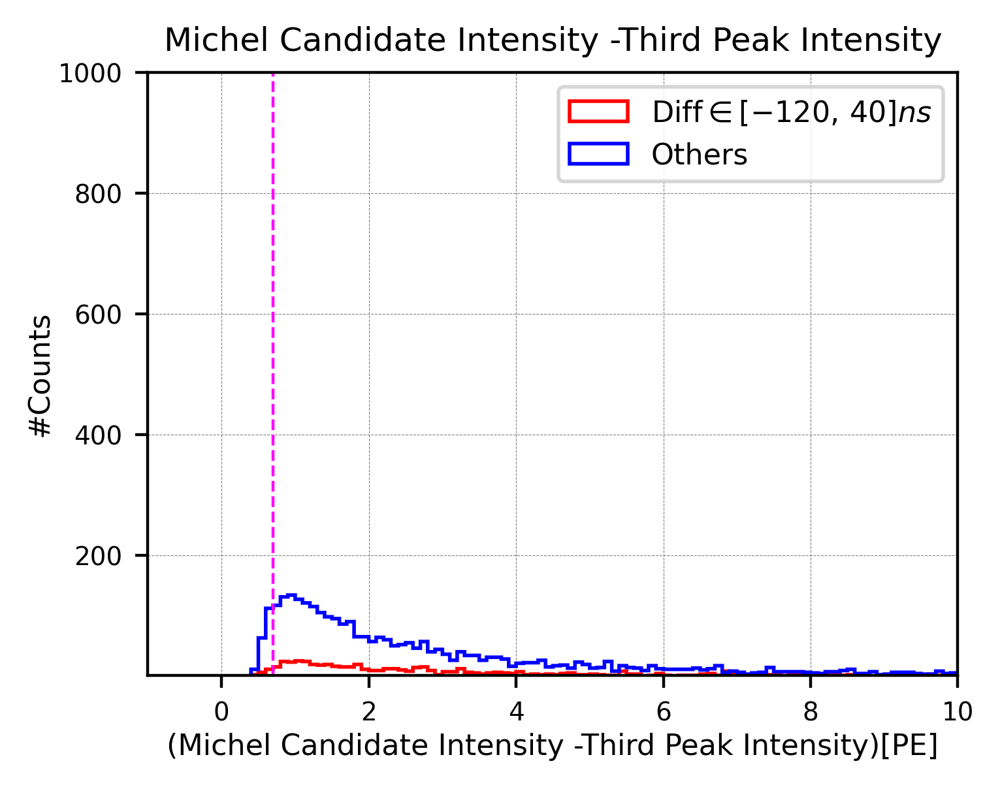

In [21]:
print("\nAfter Cut 7:--------------")

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify7), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify7)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))


miInt_diff0_purity7 = [ev.michel_intensity for ev in events_diff0_purify7]
thInt_diff0_purity7 = [ev.third_intensity for ev in events_diff0_purify7]

miInt_diff500_purity7 = [ev.michel_intensity for ev in events_diff500_purify7]
thInt_diff500_purity7 = [ev.third_intensity for ev in events_diff500_purify7]

# Element-by-element difference (thInt - miInt)
subtract_diff0_purity7 = [mi - th for th, mi in zip(thInt_diff0_purity7, miInt_diff0_purity7)]
subtract_diff500_purity7 = [mi - th for th, mi in zip(thInt_diff500_purity7, miInt_diff500_purity7)]


thre_diff = 0.7

# filter the actual events
events_diff0_purify8 = [
    ev for ev in events_diff0_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
events_diff500_purify8 = [
    ev for ev in events_diff500_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
#-------------------------------


print("\nMichel 3rd Peaks intensity Diff (Cut 8):--------------")

events_total_purify8 = events_diff0_purify8 + events_diff500_purify8

print("Efficiency (cut8 / cut7): ", len(events_total_purify8), "/", len(events_total_purify7),
      "({:.2f}%)".format(len(events_total_purify8)/len(events_total_purify7)*100))

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify8), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify8)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))










# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity7), np.array(thInt_diff500_purity7) #(x, y)
x2, y2 = np.array(miInt_diff0_purity7), np.array(thInt_diff0_purity7)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

plt.plot([0, 10], [-0.7, 9.3], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()









#(Michel Candidate Intensity -Third Peak Intensity) Distributions====================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(subtract_diff0_purity7, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(subtract_diff500_purity7, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.7, 0.7], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-1, 10)
plt.xlabel('(Michel Candidate Intensity -Third Peak Intensity)[PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  

### Cut 9: Space Cut along drift direction


After Cut 8:--------------
Purity (true / reco)    :  661 / 4262 (15.51%)

(Diff [-120, 40]:  600 / 661 (90.77%)
(Diff OTHERS    :  3662 / 4262 (85.92%)

Drift Direction Cut (Cut 9):--------------
Efficiency (cut9 / cut8):  3525 / 4262 (82.71%)
Purity (true / reco)    :  615 / 3525 (17.45%)

(Diff [-120, 40]:  567 / 615 (92.20%)
(Diff OTHERS    :  2958 / 3525 (83.91%)

Decay points distribution: 


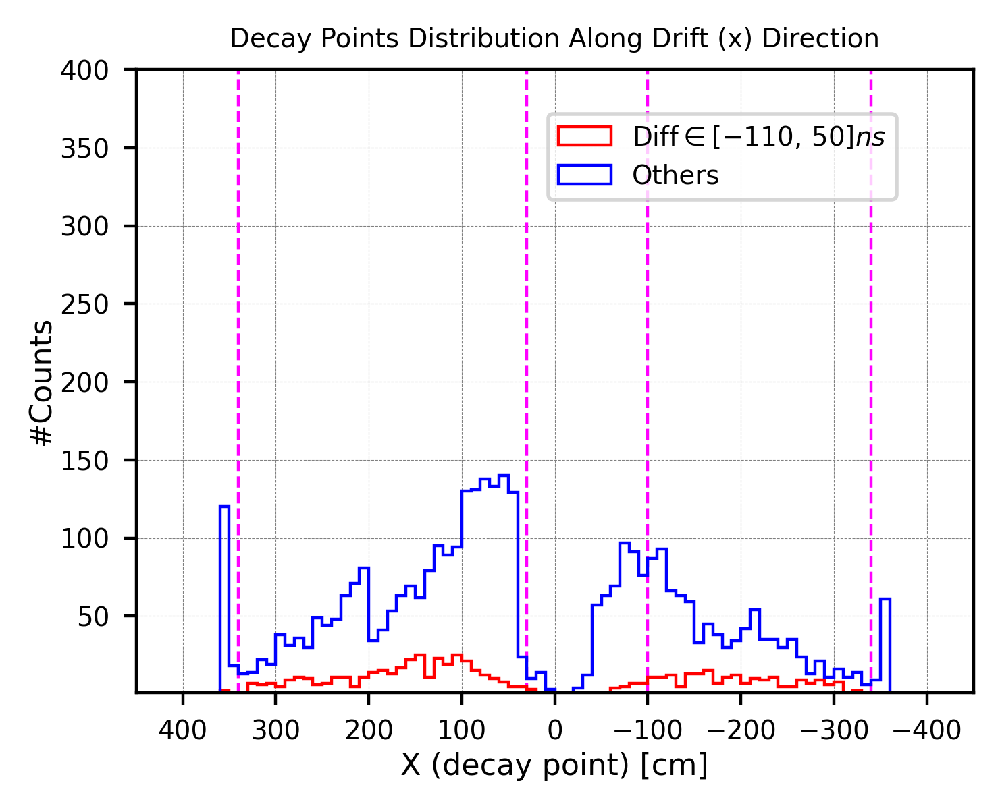

In [22]:
print("\nAfter Cut 8:--------------")

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify8), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify8)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))





posX_cut1 = 30
posX_cut2 = 340
negX_cut1 = -100
negX_cut2 = -340

# filter the actual events
events_diff0_purify9 = [
    ev for ev in events_diff0_purify8
    if posX_cut1 < ev.posX < posX_cut2 or negX_cut2 < ev.posX < negX_cut1
]
events_diff500_purify9 = [
    ev for ev in events_diff500_purify8
    if posX_cut1 < ev.posX < posX_cut2 or negX_cut2 < ev.posX < negX_cut1
]
#-------------------------------


print("\nDrift Direction Cut (Cut 9):--------------")

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9

print("Efficiency (cut9 / cut8): ", len(events_total_purify9), "/", len(events_total_purify8),
      "({:.2f}%)".format(len(events_total_purify9)/len(events_total_purify8)*100))

n_valid = sum(1 for ev in events_total_purify9 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify9),
      "({:.2f}%)".format(n_valid/len(events_total_purify9)*100))

print("\n(Diff [-120, 40]: ", len(events_diff0_purify9), "/", n_valid,
       "({:.2f}%)".format(len(events_diff0_purify9)/n_valid*100))
print("(Diff OTHERS    : ", len(events_diff500_purify9), "/", len(events_total_purify9),
       "({:.2f}%)".format(len(events_diff500_purify9)/len(events_total_purify9)*100))









posX_diff500_purify8 = [ev.posX for ev in events_diff500_purify8]

posX_diff0_purify8 = [ev.posX for ev in events_diff0_purify8]

posX_total_purify8 = posX_diff500_purify8 + posX_diff0_purify8


#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
#plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
#plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([340, 340], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-340, -340], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify8, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(posX_diff500_purify8, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#plt.hist(posX_total_purify8, bins=bins, range=(range_min, range_max), edgecolor='orange', 
#          histtype='step', linewidth=0.8, label="Total")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel('X (decay point) [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 400)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  





Decay points distribution: 


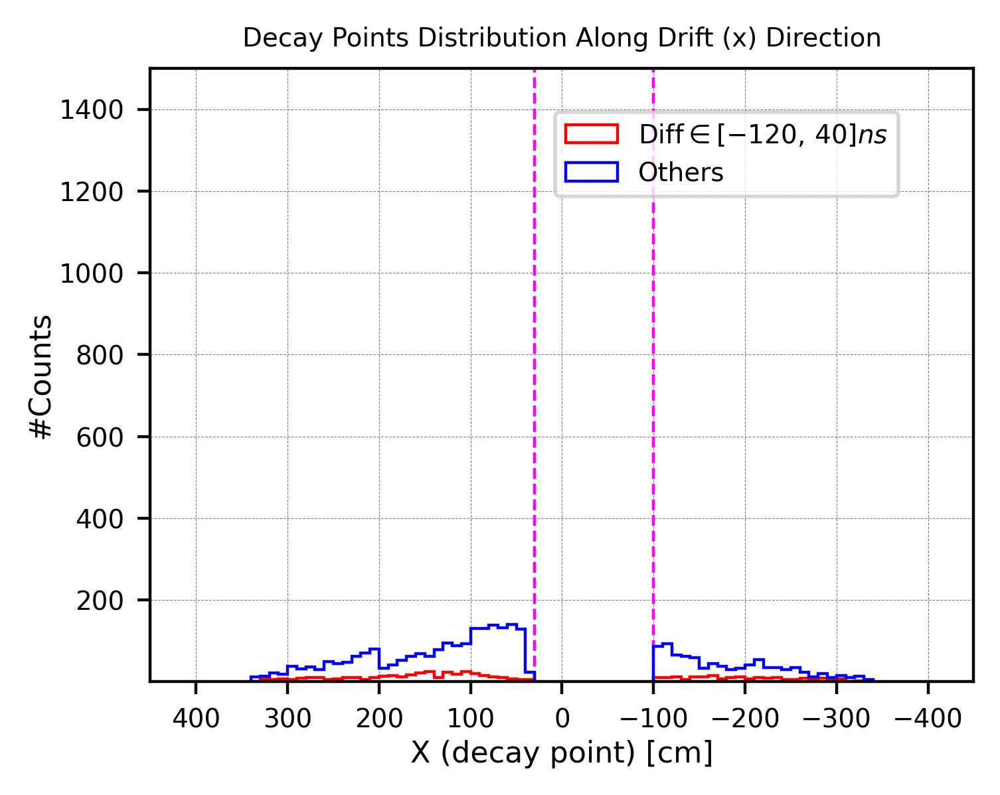

In [23]:
posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
#plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
#plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel('X (decay point) [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 1500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  

<br />

### Explore Validaty of $-120<Diff<40$ [ns] standard: 

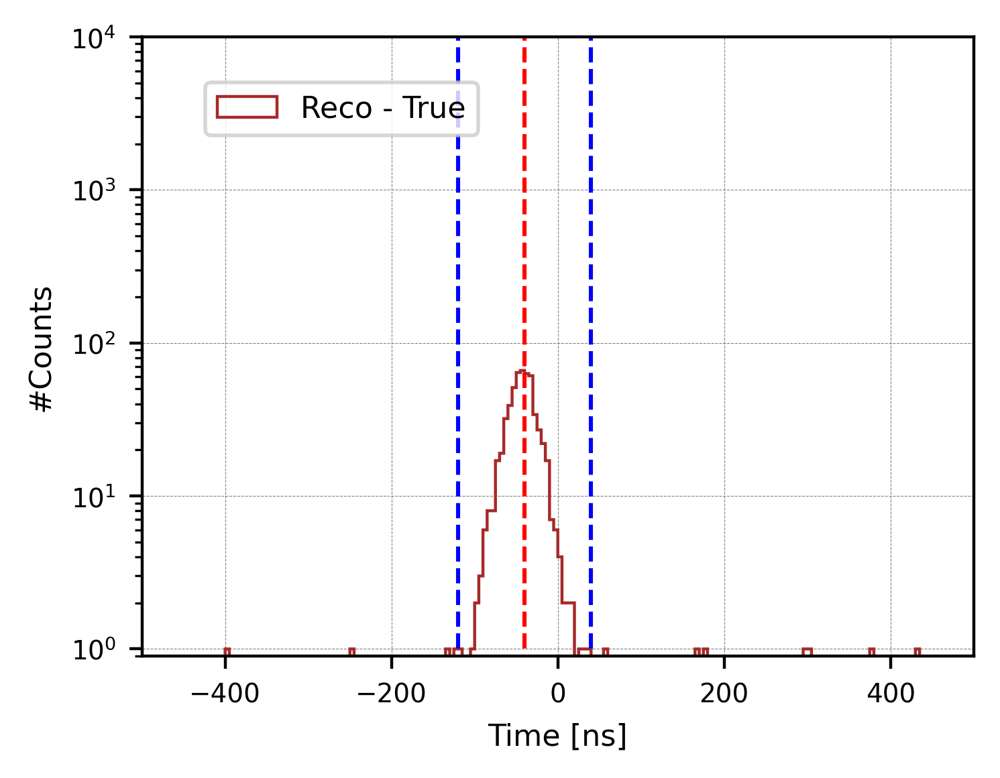

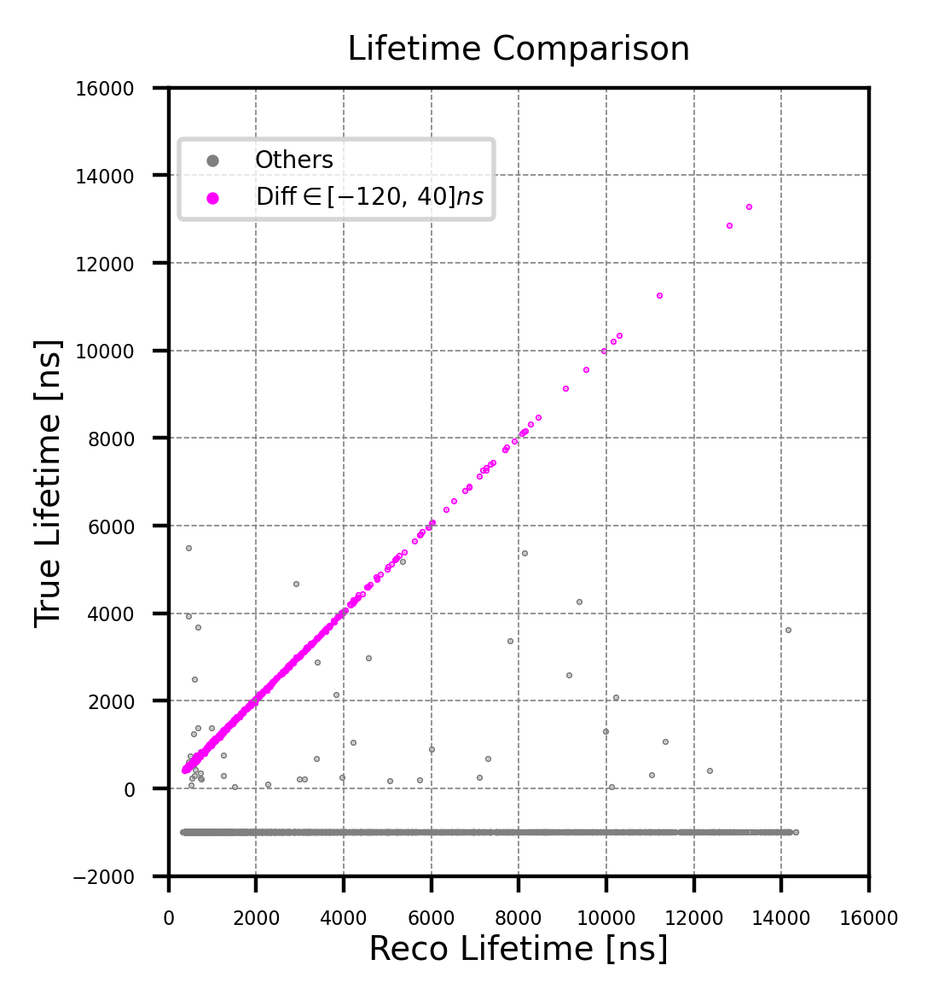

In [24]:
#The final dataset: events_diff500_purify9

diffTime_diff500_purify9 = [ev.diff_lifetime for ev in events_diff500_purify9]
trueTime_diff500_purify9 = [ev.true_lifetime for ev in events_diff500_purify9]
recoTime_diff500_purify9 = [ev.reco_lifetime for ev in events_diff500_purify9]

#Group of diff<500
diffTime_diff0_purify9 = [ev.diff_lifetime for ev in events_diff0_purify9]
trueTime_diff0_purify9 = [ev.true_lifetime for ev in events_diff0_purify9]
recoTime_diff0_purify9 = [ev.reco_lifetime for ev in events_diff0_purify9]

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9
diffTime_total_purify9 = diffTime_diff500_purify9 + diffTime_diff0_purify9

#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diffTime_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

plt.plot([-40, -40], [0, 30000], color="red", linewidth=1.1, linestyle='--')
plt.plot([-120, -120], [0, 30000], color="blue", linewidth=1.1, linestyle='--')
plt.plot([40, 40], [0, 30000], color="blue", linewidth=1.1, linestyle='--')

plt.xlim(-500, 500)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()







# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoTime_diff500_purify9, trueTime_diff500_purify9, s=0.1, c='grey', alpha=1.0, label="Others")
plt.scatter(recoTime_diff0_purify9, trueTime_diff0_purify9, s=0.1, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=7)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=7)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=6, markerscale=5, ncol=1, prop={'size':5})
plt.show()





<br />

#### Single Event Inspection:

<br />
<br />
<br />
<br />

### Features of FINAL dataset (after purification 9):

In [25]:
events_total_purify9 = events_diff500_purify9 + events_diff0_purify9

events_pM_purify9 = []#e^+---
events_nM_purify9 = []

for i in range(0, len(events_total_purify9)):
    pdg = events_total_purify9[i].pdg

    if pdg < 0:
        events_pM_purify9.append(events_total_purify9[i])

    elif pdg > 0:
        events_nM_purify9.append(events_total_purify9[i])



print("\nMichel e^+: ", len(events_pM_purify9), "/", len(events_total_purify9), 
      "({:.2f}%)".format(len(events_pM_purify9)/len(events_total_purify9)*100))
print("Michel e^-: ", len(events_nM_purify9), "/", len(events_total_purify9), 
      "({:.2f}%)".format(len(events_nM_purify9)/len(events_total_purify9)*100))

print("\n#e^+ / #e^-: ", len(events_pM_purify9), "/", len(events_nM_purify9), 
      "({:.2f}%)".format(len(events_pM_purify9)/len(events_nM_purify9)*100))

print("Comment [20260415]: the ratio change (4.6 -> 7.5) might be important; We have less e^- events left")


Michel e^+:  542 / 3525 (15.38%)
Michel e^-:  73 / 3525 (2.07%)

#e^+ / #e^-:  542 / 73 (742.47%)
Comment [20260415]: the ratio change (4.6 -> 7.5) might be important; We have less e^- events left



Decay points distribution: 


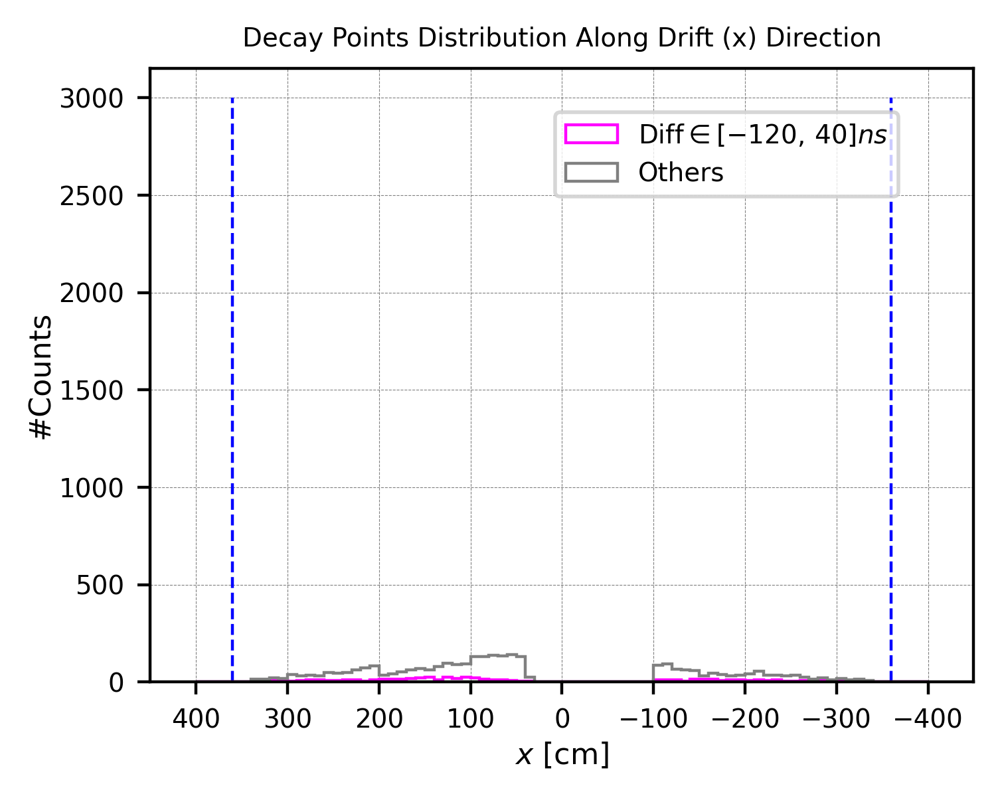

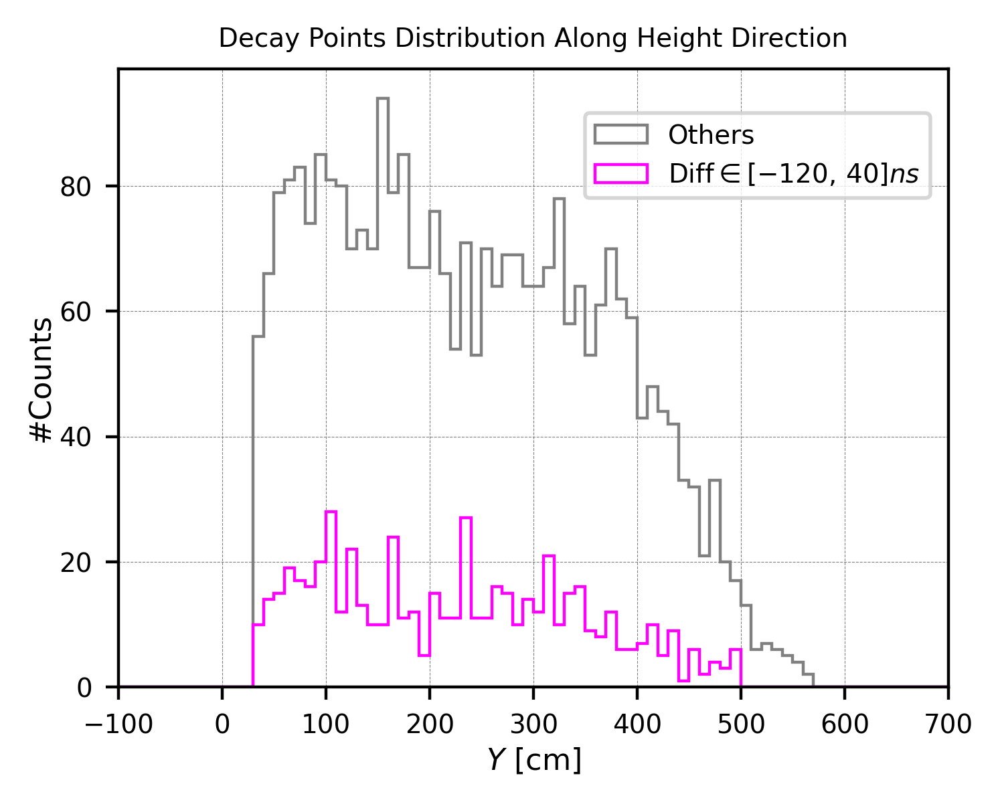

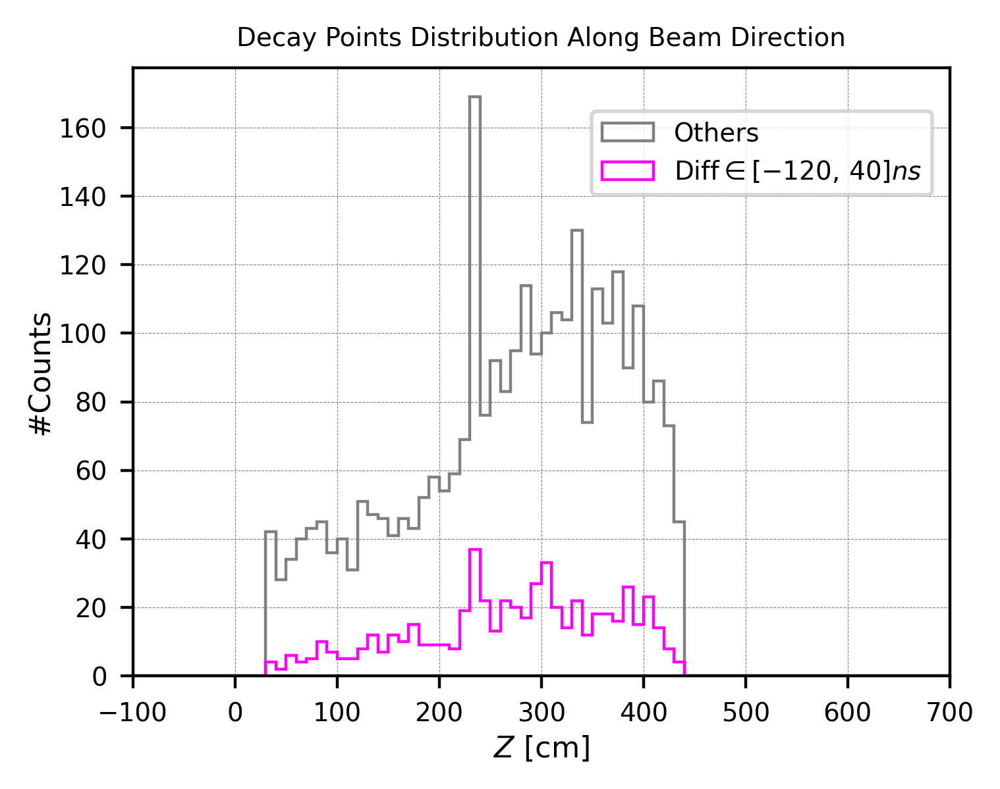

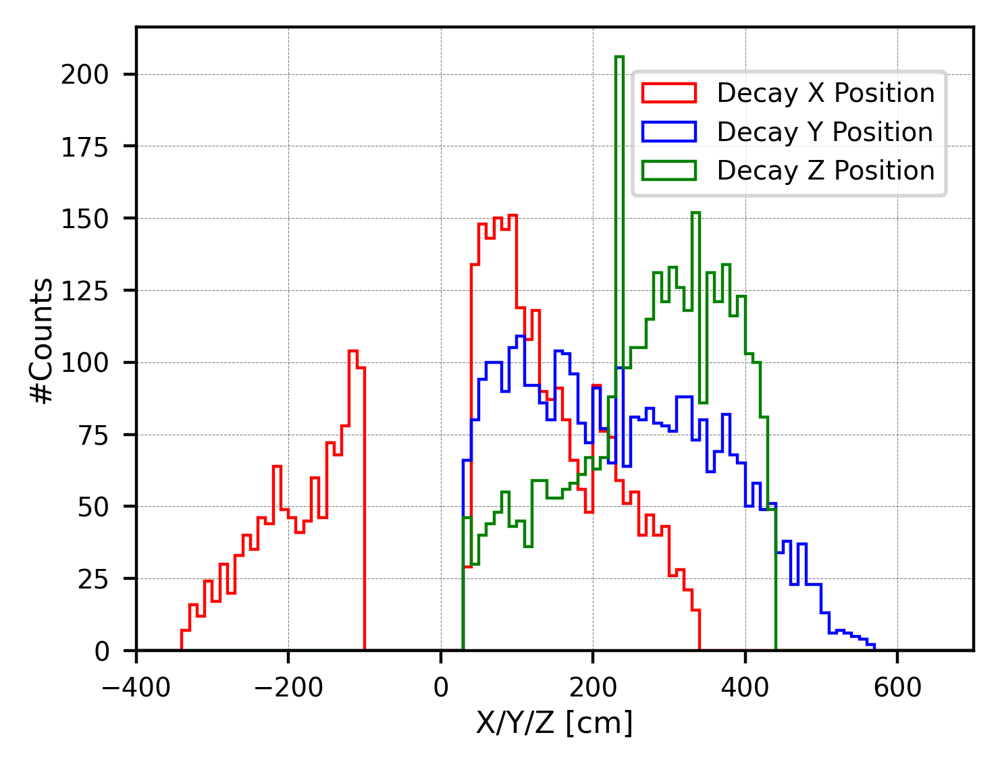

In [34]:

posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]
posY_diff500_purify9 = [ev.posY for ev in events_diff500_purify9]
posZ_diff500_purify9 = [ev.posZ for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]
posY_diff0_purify9 = [ev.posY for ev in events_diff0_purify9]
posZ_diff0_purify9 = [ev.posZ for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Y distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posY_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posY_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Y$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Height Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posZ_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posZ_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Z$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 






#X/Y/Z in one plotting:==========================================
posX_total_purify9 = posX_diff500_purify9 + posX_diff0_purify9
posY_total_purify9 = posY_diff500_purify9 + posY_diff0_purify9
posZ_total_purify9 = posZ_diff500_purify9 + posZ_diff0_purify9

# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label="Decay X Position")
plt.hist(posY_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Decay Y Position")
plt.hist(posZ_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='green', 
          histtype='step', linewidth=0.8, label="Decay Z Position")
#--------------------------------

plt.xlim(-400, 700)
plt.xlabel('X/Y/Z [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
#plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.78, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 








# Set the limits of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

# Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


# ==========================================================
# Y–X plane plotting (Front View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line for field cage
# aux2 = [0, 610, 610, 0, 0]
# aux1 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posX_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posX_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posX_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posX_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posX_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(xmin, xmax)
# plt.ylim(-50, 660)
# plt.gca().invert_xaxis()  # Flip x-axis
# plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Front View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


# ==========================================================
# Z–X plane plotting (Top View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux1 = [0, 465, 465, 0, 0]
# aux2 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posX_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posX_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posX_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posX_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posX_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.ylim(xmin, xmax)
# plt.xlim(-50, 515)
# plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.title('Top View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()




# ==========================================================
# Y–Z plane plotting (Side View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY]
# aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(-50, 515)
# plt.ylim(-50, 660)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Side View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


#### Energy and Reco Hits:


Energy Distribution: 


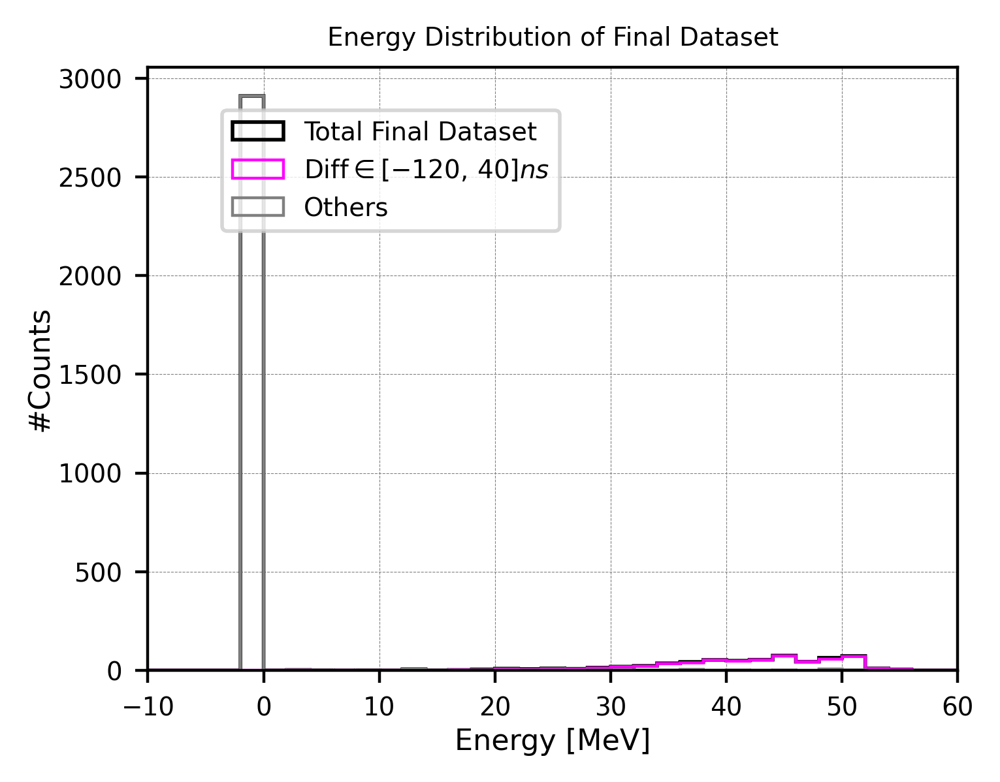


Michel Score Distribution: 


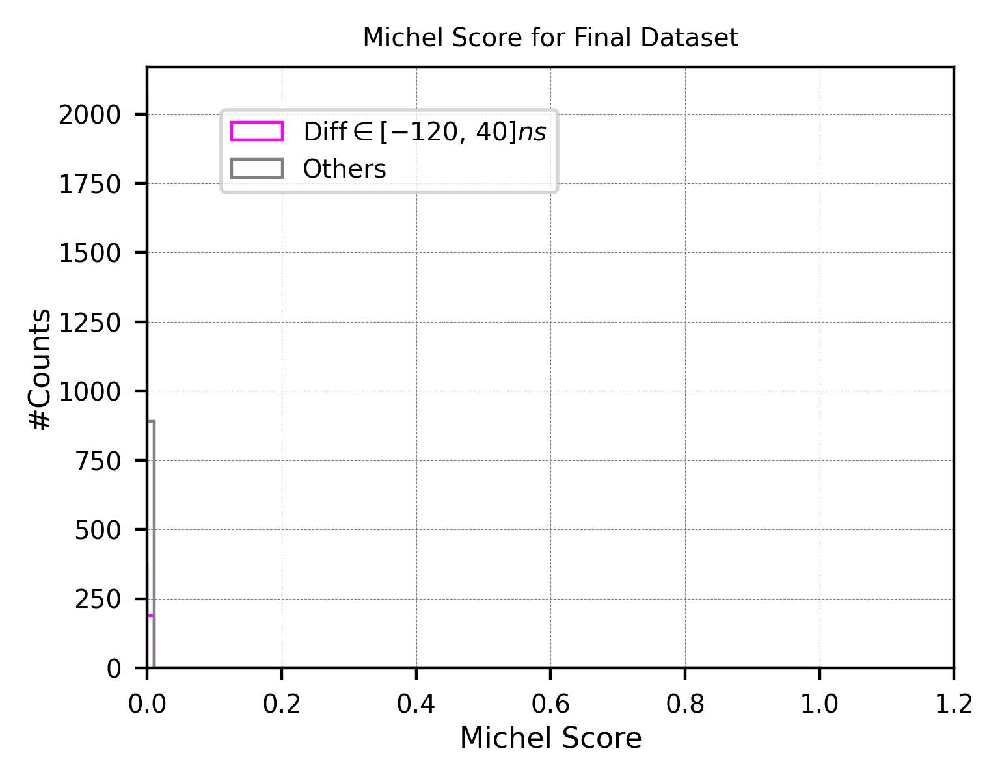


Michel Hits Distribution: 


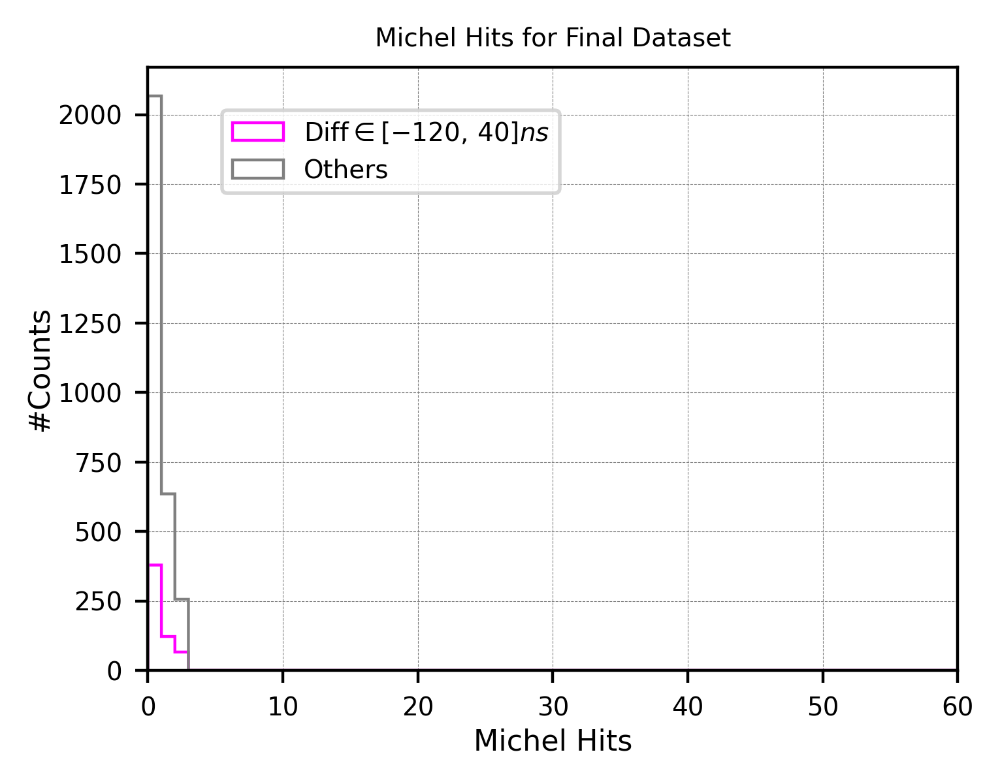

In [27]:
energy_diff500_purify9 = [ev.energy for ev in events_diff500_purify9]
energy_diff0_purify9 = [ev.energy for ev in events_diff0_purify9]
energy_total_purify9 = [ev.energy for ev in events_total_purify9]

hits_diff500_purify9 = [ev.michel_hits for ev in events_diff500_purify9]
hits_diff0_purify9 = [ev.michel_hits for ev in events_diff0_purify9]

score_diff500_purify9 = [ev.michel_score for ev in events_diff500_purify9]
score_diff0_purify9 = [ev.michel_score for ev in events_diff0_purify9]




#Decay points distribution:==========================================
print("\nEnergy Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 2
range_min =-1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(energy_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='black', 
          histtype='step', linewidth=1.0, label="Total Final Dataset")
plt.hist(energy_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(energy_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------


plt.xlim(-10, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.title('Energy Distribution of Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 











#Michel Score distribution:==========================================
print("\nMichel Score Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 0.01
range_min =-1
range_max = 1
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(score_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(score_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 1.2)
plt.xlabel('Michel Score', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Score for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 







#Michel Hits distribution:==========================================
print("\nMichel Hits Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 1
range_min =0
range_max = 600
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(hits_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-120,\,40]ns$")
plt.hist(hits_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 60)
plt.xlabel('Michel Hits', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Hits for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 





<br />
<br />
<br />

### Properties of Final True Michel electrons:

<br />
<br />
<br />
<br />
<br />

### Lifetime Distribution of Final Dataset (purification 9):

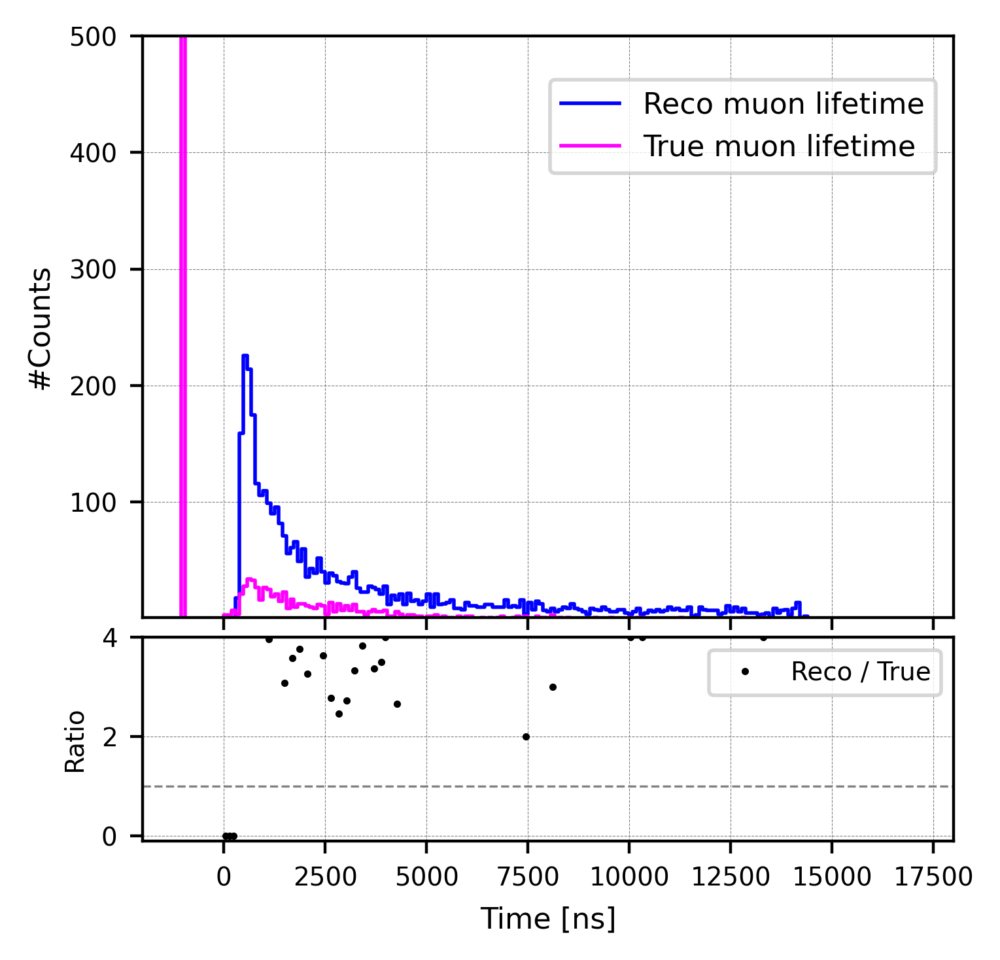



For each event, +40ns for reco time


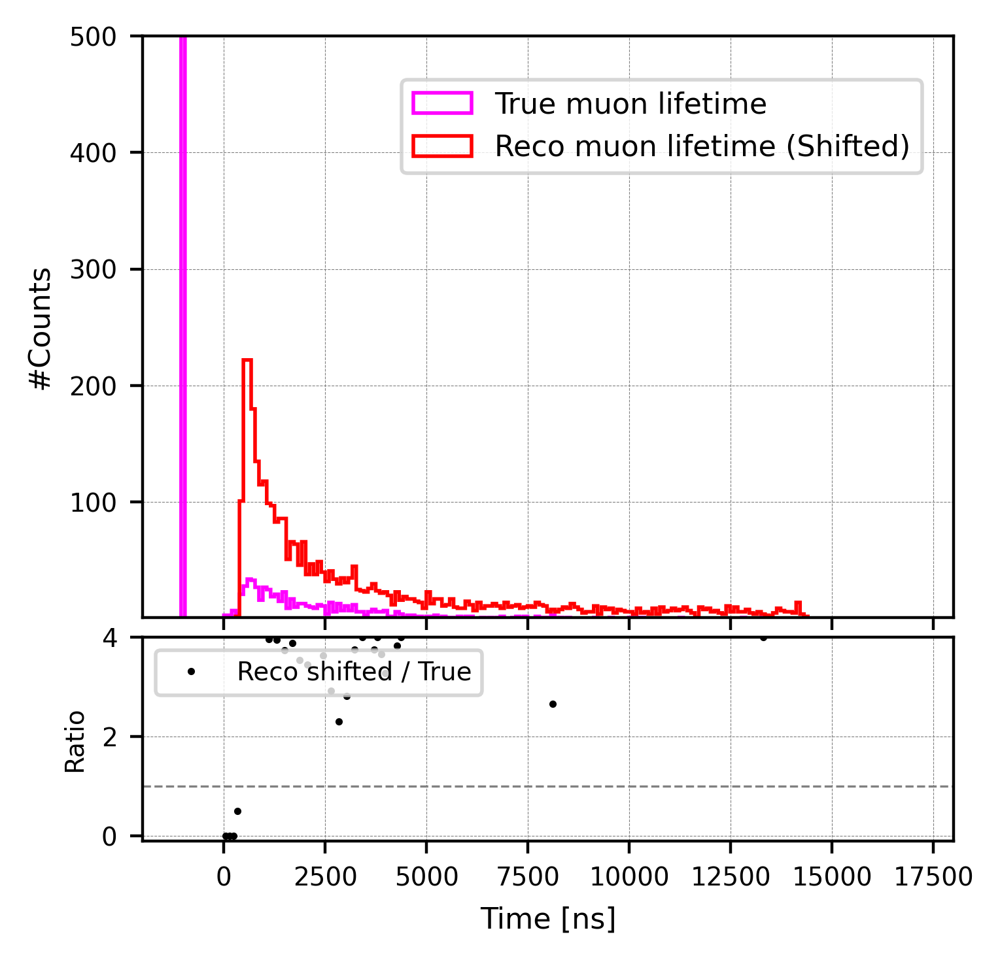

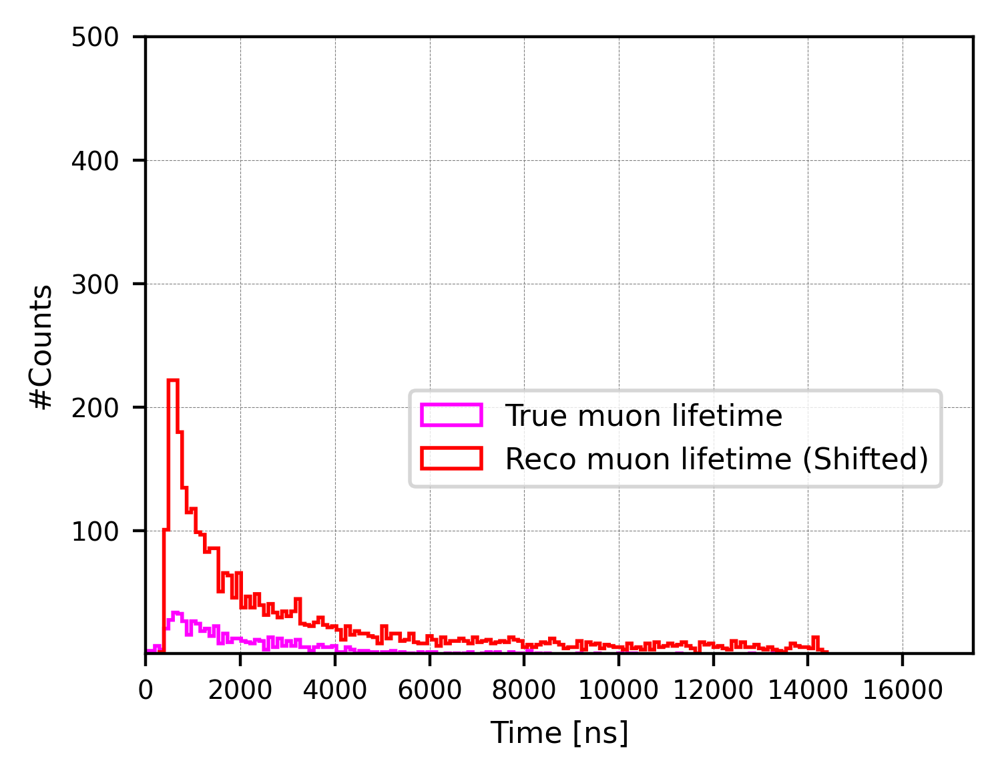



BKG distribution===========================

recoT_total_purify9_shift40:  3525
reco_true_finalEvents      :  615
reco_false_finalEvents     :  2910


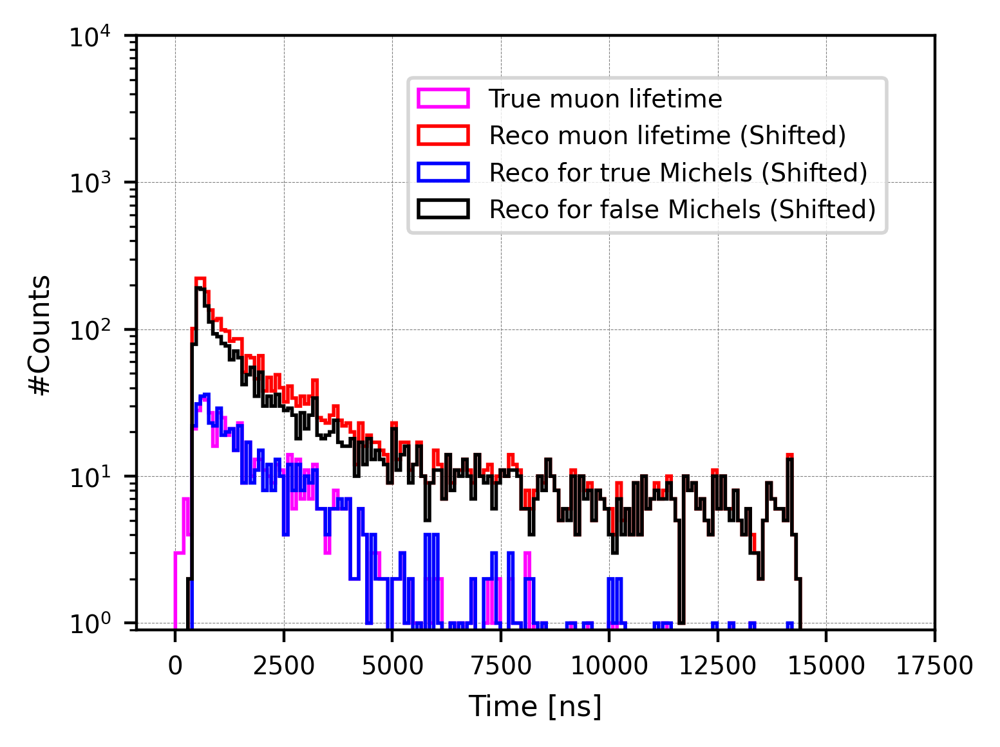



recoT_total_purify9_bkgSample.npy saved successfully.


In [31]:

recoT_total_purify9 = [ev.reco_lifetime for ev in events_total_purify9]
trueT_total_purify9 = [ev.true_lifetime for ev in events_total_purify9]




# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
# Muon Lifetime distribution (INITIAL; NO fitting)----------------------

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ============================================================
# Histogram settings
# ============================================================
bin_width = 96
range_min = -96000
range_max = 96000

bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

# ============================================================
# Histograms
# ============================================================
hist_reco, _ = np.histogram(recoT_total_purify9, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))
ratio = np.full_like(hist_true, np.nan, dtype=float)
mask = (hist_true > 0) & (centers > 0)
ratio[mask] = hist_reco[mask] / hist_true[mask]

# ============================================================
fig = plt.figure(figsize=(4, 4), dpi=400)

gs = GridSpec(2, 1, height_ratios=[4, 1.4], hspace=0.05)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# ============================================================
# Top panel
# ============================================================
ax1.step(bins, np.append(hist_reco, 0), where='post', color='blue', linewidth=1.0, 
         label='Reco muon lifetime')
ax1.step(bins, np.append(hist_true, 0), where='post',color='magenta', linewidth=1.0,
         label='True muon lifetime')

ax1.set_xlim(-2000, 18000)
ax1.set_ylim(0.9, 500)

#ax1.set_yscale("log")
ax1.set_ylabel('#Counts', fontsize=8)
ax1.tick_params(labelsize=7)
ax1.tick_params(labelbottom=False)
ax1.grid(color='gray', linestyle='--', linewidth=0.2)
ax1.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), prop={'size':8})

# ============================================================
ax2.plot(centers[mask], ratio[mask], 'o', ms=1.0, color='black', label='Reco / True')
ax2.axhline(1.0, linestyle='--', linewidth=0.6, color='gray')

ax2.set_xlim(-2000, 18000)
ax2.set_ylim(-0.1, 4)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.tick_params(labelsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2)
ax2.legend(fontsize=7)
plt.show()








#Shift +40ns================================================================================
print("\n\n===================================")
print("For each event, +40ns for reco time")

recoT_total_purify9_shift40 = [x + 40 for x in recoT_total_purify9]

bin_width = 96
range_min = -96000
range_max = 96000

bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])

hist_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))
hist_reco_shift40, _ = np.histogram(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max))

ratio = np.full_like(hist_true, np.nan, dtype=float)
mask = (hist_true > 0) & (centers > 0)

ratio[mask] = hist_reco_shift40[mask] / hist_true[mask]

# ============================================================
fig = plt.figure(figsize=(4, 4), dpi=400)

gs = GridSpec(2, 1, height_ratios=[4, 1.4], hspace=0.05)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# Top panel: keep histogram drawing
ax1.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0, label='True muon lifetime')



ax1.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0, label='Reco muon lifetime (Shifted)')

ax1.set_xlim(-2000, 18000)
ax1.set_ylim(0.9, 500)
#ax1.set_yscale("log")
ax1.set_ylabel('#Counts', fontsize=8)
ax1.tick_params(labelsize=7)
ax1.tick_params(labelbottom=False)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95),
           markerscale=5, ncol=1, prop={'size':8})

# Bottom panel: shifted reco / true
ax2.plot(centers[mask], ratio[mask], 'o', ms=1.0, color='black', label='Reco shifted / True')

ax2.axhline(1.0, linestyle='--', linewidth=0.6, color='gray')

ax2.set_xlim(-2000, 18000)
ax2.set_ylim(-0.1, 4.0)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.tick_params(labelsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(fontsize=7, loc='upper left')
plt.show()







#Zoomed-in plot=========================================
print("\n\n===================================")


# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0,
         label='Reco muon lifetime (Shifted)')

plt.xlim(0, 17500)
plt.ylim(0.9, 500)
#plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.45), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






#BKG distribution=========================================
print("\n\nBKG distribution===========================")
reco_true_finalEvents = []
reco_false_finalEvents = []

for i in range(0, len(trueT_total_purify9)):
    true = trueT_total_purify9[i]
    reco = recoT_total_purify9_shift40[i]

    if true > 0:
        reco_true_finalEvents.append(reco)
    else:
        reco_false_finalEvents.append(reco)

print("\nrecoT_total_purify9_shift40: ", len(recoT_total_purify9_shift40))
print("reco_true_finalEvents      : ", len(reco_true_finalEvents))
print("reco_false_finalEvents     : ", len(reco_false_finalEvents))

# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0,
         label='Reco muon lifetime (Shifted)')

plt.hist(reco_true_finalEvents, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco for true Michels (Shifted)')

plt.hist(reco_false_finalEvents, bins=bins, range=(range_min, range_max),
         edgecolor='black', histtype='step', linewidth=1.0,
         label='Reco for false Michels (Shifted)')


#plt.xlim(-2500, 17500)
#plt.ylim(0.9, 3000)
plt.xlim(-900, 17500)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=9, markerscale=4, 
           ncol=1, prop={'size':7})
plt.show()




#Save bkg sample (+40ns shifted reco time)===
np.save("recoT_total_purify9_bkgSample.npy", np.array(recoT_total_purify9_shift40))
print("\n\nrecoT_total_purify9_bkgSample.npy saved successfully.")


#### Fitting of BKG Hist:


Covariance matrix (Minuit):
Parameter order: ('N', 'tau')
[[ 3.61613587e-03 -1.65901403e+00]
 [-1.65901403e+00  1.04550035e+03]]

Formatted covariance matrix:
Cov(N,N) = 0.00361614
Cov(N,tau) = -1.65901
Cov(tau,N) = -1.65901
Cov(tau,tau) = 1045.5

Correlation matrix:
[[ 1.         -0.85322898]
 [-0.85322898  1.        ]]


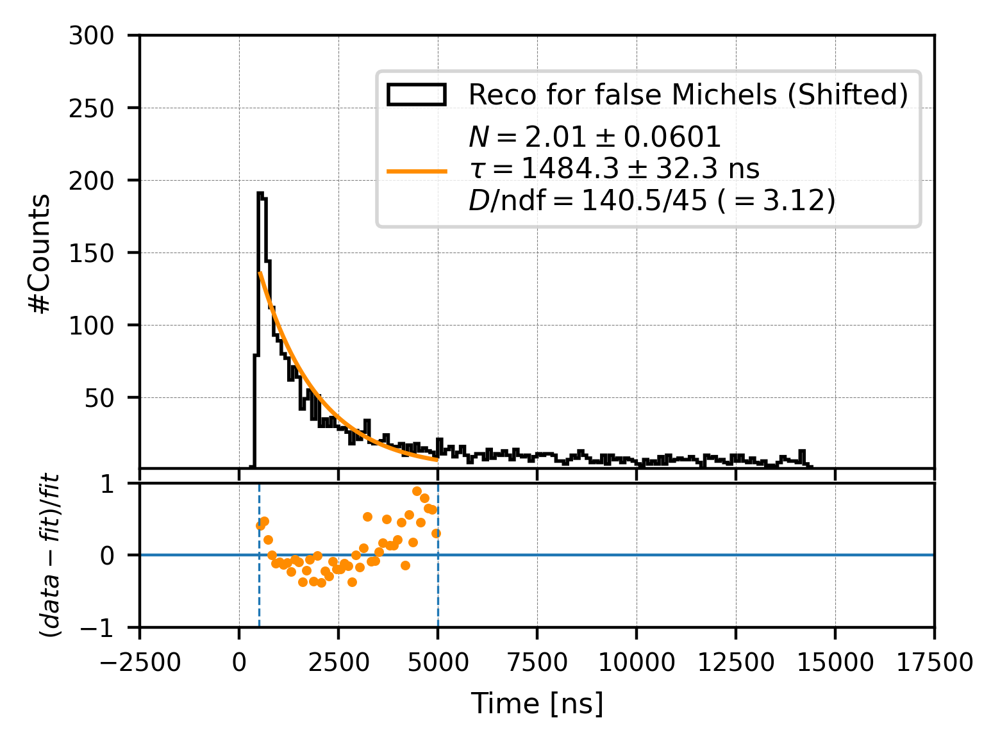

N   = 2.01208
tau = 1484.343 ± 32.334 ns
D/ndf = 140.48/45  (= 3.122)
Minuit success = True, message: valid=True, accurate=True, fmin_ok=True


In [29]:
import numpy as np
import matplotlib.pyplot as plt
from iminuit import Minuit

# ============================================================
# 1) Bin-integrated exponential: mu_i = ∫_a^b N exp(-t/tau) dt
# ============================================================
def mu_binint_exp(edges, N, tau):
    a = edges[:-1]
    b = edges[1:]
    return N * tau * (np.exp(-a / tau) - np.exp(-b / tau))

# ============================================================
# 2) Poisson deviance D = 2 Σ [ mu - n + n ln(n/mu) ]
#    For n=0, define n ln(n/mu)=0.
# ============================================================
def poisson_deviance(n, mu, eps=1e-12):
    mu = np.maximum(mu, eps)
    term = np.where(n > 0, n * np.log(n / mu), 0.0)
    return 2.0 * np.sum(mu - n + term)

# ============================================================
# 3) Fit single exp with binned Poisson MLE using Minuit
#    Returns tau uncertainty from HESSE
# ============================================================
def fit_single_exp_binned_minuit(samples, bins, hist_range, fit_range, tau0=2000.0):
    counts, edges = np.histogram(samples, bins=bins, range=hist_range)
    centers = 0.5 * (edges[:-1] + edges[1:])

    m = (centers >= fit_range[0]) & (centers <= fit_range[1])
    idx = np.where(m)[0]
    if len(idx) < 3:
        return None

    n_fit = counts[m]
    edges_fit = edges[idx[0]: idx[-1] + 2]

    # Initial guesses
    binw = edges[1] - edges[0]
    N0 = max(n_fit[0] / max(binw, 1e-12), 1.0)

    def objective(N, tau):
        if N <= 0.0 or tau <= 0.0:
            return 1e30
        mu = mu_binint_exp(edges_fit, N, tau)
        return poisson_deviance(n_fit, mu)

    minuit = Minuit(objective, N=N0, tau=tau0)

    # For likelihood / deviance-like objective
    minuit.errordef = Minuit.LIKELIHOOD

    # Bounds
    minuit.limits["N"] = (1e-12, None)
    minuit.limits["tau"] = (1e-9, None)

    # Optional: step sizes for numerical derivatives
    minuit.errors["N"] = max(0.1 * N0, 1e-6)
    minuit.errors["tau"] = max(0.1 * tau0, 1.0)

    # Run minimization and HESSE errors
    minuit.migrad()
    minuit.hesse()


    # ============================================================
    # Print covariance matrix
    # ============================================================
    print("\nCovariance matrix (Minuit):")

    if minuit.covariance is None:
        print("Covariance matrix not available.")
    else:
        cov = np.array(minuit.covariance)

        print("Parameter order:", minuit.parameters)
        print(cov)

        # Optional: print in a more readable format
        print("\nFormatted covariance matrix:")
        for i, p1 in enumerate(minuit.parameters):
            for j, p2 in enumerate(minuit.parameters):
                print(f"Cov({p1},{p2}) = {cov[i,j]:.6g}")

        # ------------------------------------------------------------
        # Correlation matrix
        # ------------------------------------------------------------
        print("\nCorrelation matrix:")
        corr = cov / np.outer(np.sqrt(np.diag(cov)), np.sqrt(np.diag(cov)))
        print(corr)


    N_fit = float(minuit.values["N"])
    tau_fit = float(minuit.values["tau"])
    sigma_N = float(minuit.errors["N"]) if np.isfinite(minuit.errors["N"]) else np.nan
    sigma_tau = float(minuit.errors["tau"]) if np.isfinite(minuit.errors["tau"]) else np.nan

    mu_fit = mu_binint_exp(edges_fit, N_fit, tau_fit)
    D = poisson_deviance(n_fit, mu_fit)
    ndf = max(len(n_fit) - 2, 1)

    return {
        "counts": counts,
        "edges": edges,
        "centers": centers,
        "mask": m,
        "edges_fit": edges_fit,
        "n_fit": n_fit,
        "mu_fit": mu_fit,
        "N_fit": N_fit,
        "tau_fit": tau_fit,
        "sigma_N": sigma_N,
        "sigma_tau": sigma_tau,
        "D": float(D),
        "ndf": int(ndf),
        "opt_success": bool(minuit.valid),
        "opt_message": f"valid={minuit.valid}, accurate={minuit.accurate}, fmin_ok={minuit.fmin.is_valid}",
        "minuit": minuit,
    }

# ============================================================
# 4) USER SETTINGS (edit these only)
# ============================================================
fit_range = (500.0, 5000.0)
xlim = (-2500.0, 17500.0)
ylim = (0.9, 300.0)

hist_label = "Reco for false Michels (Shifted)"

# ============================================================
# 5) RUN FIT
# ============================================================
out = fit_single_exp_binned_minuit(
    samples=reco_false_finalEvents,
    bins=bins,
    hist_range=(range_min, range_max),
    fit_range=fit_range,
    tau0=2000.0
)

if out is None:
    print("[WARN] Not enough bins in fit_range for a stable fit.")
else:
    edges_fit = out["edges_fit"]
    centers_fit = 0.5 * (edges_fit[:-1] + edges_fit[1:])
    rel = (out["n_fit"] - out["mu_fit"]) / np.maximum(out["mu_fit"], 1e-12)

    # ============================================================
    # 6) PLOT (top + bottom)
    # ============================================================
    fig = plt.figure(figsize=(4, 3.0), dpi=400)
    gs = fig.add_gridspec(2, 1, height_ratios=[3.0, 1.0], hspace=0.05)
    ax = fig.add_subplot(gs[0])
    axr = fig.add_subplot(gs[1], sharex=ax)

    ax.hist(
        reco_false_finalEvents,
        bins=bins,
        range=(range_min, range_max),
        edgecolor="black",
        histtype="step",
        linewidth=1.0,
        label=hist_label
    )

    # Legend text
    if np.isfinite(out["sigma_tau"]):
        line_tau = rf"$\tau = {out['tau_fit']:.1f} \pm {out['sigma_tau']:.1f}$ ns"
    else:
        line_tau = rf"$\tau = {out['tau_fit']:.1f}$ ns"

    if "sigma_N" in out and np.isfinite(out["sigma_N"]):
        line_N = rf"$N = {out['N_fit']:.3g} \pm {out['sigma_N']:.3g}$"
    else:
        line_N = rf"$N = {out['N_fit']:.3g}$"

    line_D = rf"$D/\mathrm{{ndf}} = {out['D']:.1f}/{out['ndf']} \; (= {out['D']/out['ndf']:.2f})$"

    fit_label = line_N + "\n" + line_tau + "\n" + line_D

    ax.plot(
        centers_fit,
        out["mu_fit"],
        linewidth=1.2,
        label=fit_label,
        color="darkorange"
    )

    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    #ax.set_yscale("log")
    ax.set_ylabel("#Counts", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(color="gray", linestyle="--", linewidth=0.2, zorder=0)
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.64, 0.95),
        fontsize=11,
        markerscale=5,
        ncol=1,
        prop={"size": 8}
    )
    plt.setp(ax.get_xticklabels(), visible=False)

    axr.axhline(0.0, linewidth=0.8)
    axr.plot(
        centers_fit,
        rel,
        marker="o",
        markersize=1.7,
        linewidth=0.8,
        linestyle="none",
        color="darkorange"
    )
    axr.axvline(fit_range[0], linestyle="--", linewidth=0.6)
    axr.axvline(fit_range[1], linestyle="--", linewidth=0.6)

    axr.set_xlim(*xlim)
    axr.set_ylim(-1, 1)
    axr.set_xlabel("Time [ns]", fontsize=8)
    axr.set_ylabel(r"$(data-fit)/fit$", fontsize=7)
    axr.tick_params(labelsize=7)
    axr.grid(color="gray", linestyle="--", linewidth=0.2, zorder=0)

    plt.show()

    # ============================================================
    # 7) PRINT RESULTS
    # ============================================================
    print(f"N   = {out['N_fit']:.6g}")
    if np.isfinite(out["sigma_tau"]):
        print(f"tau = {out['tau_fit']:.3f} ± {out['sigma_tau']:.3f} ns")
    else:
        print(f"tau = {out['tau_fit']:.3f} ns (uncertainty unavailable)")
    print(f"D/ndf = {out['D']:.2f}/{out['ndf']}  (= {out['D']/out['ndf']:.3f})")
    print(f"Minuit success = {out['opt_success']}, message: {out['opt_message']}")

<br />
<br />
<br />
<br />
<br />

## Lifetime measurement efficiency:

#### Initial True Michel and Final True Michel---

#### Fit efficiency points:

<br />
<br />
<br />

### Explore different Detection Efficiencies



<br />
<br />
<br />
<br />
<br />


### Apply Selection Efficiency to FINAL RECO 
### (check again the error propagation!)

<br />

#### Double exponential fitting (fixed tau2 ) (WITH Complete Error)

<br />
<br />
<br />
<br />
<br />
<br />

### New Fitting Approach (Binned ML + Minuit + Efficiency) [20260306]: